In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import os.path as op
import glob
import matplotlib.pyplot as plt
import ast
# import moss
import csv
import random
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.sm_exceptions import ConvergenceWarning
import scipy
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.sm_exceptions import ConvergenceWarning
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm

from statsmodels.stats.anova import AnovaRM
from sklearn.preprocessing import StandardScaler
from matplotlib.cm import get_cmap


In [2]:
scaler = StandardScaler()

df = pd.read_csv('pilot_total.csv')
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_12023/2278658466.py:3: DtypeWarning: Columns (254,255,256,257,258,259) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('pilot_total.csv')


In [3]:
palette = sns.color_palette("husl", n_colors=2)[::-1]  # Reverse the color order


In [4]:
df['Distractor V2 Similarity Preference Tested']

0        Untested
1          Tested
2        Untested
3          Tested
4        Untested
           ...   
80632    Untested
80633      Tested
80634      Tested
80635      Tested
80636    Untested
Name: Distractor V2 Similarity Preference Tested, Length: 80637, dtype: object

In [5]:

column_params = {
    'v2': {'n_cats': 5, 'labels': ['Least Similar', '', ' ', '   ', 'Most Similar']},
    'it': {'n_cats': 5, 'labels': ['Least Similar', '', ' ', '   ', 'Most Similar']}
}

for label in ['it_sim_dis_attend', 'v2_sim_dis_attend', 'it_sim_dis_unattend', 'v2_sim_dis_unattend', 'it_sim_dis_diff', 'v2_sim_dis_diff', 'it_im1_im2', 'v2_im1_im2', 'it_sim_dis_test', 'v2_sim_dis_test', 'it_sim_dis_untest', 'v2_sim_dis_untest', 'it_sim_dis_diff_test', 'v2_sim_dis_diff_test', 'v2_sim_dis_diff_sq', 'it_sim_dis_diff_sq', 'v2_sim_dis_diff_test_sq','it_sim_dis_diff_test_sq']:
    
    if 'v2' in label:
        n_cats = column_params['v2']['n_cats']
        labels = column_params['v2']['labels']
    else:
        n_cats = column_params['it']['n_cats']
        labels = column_params['it']['labels']
    
    df[label + '_cat'] = pd.qcut(df[label], q=n_cats, labels=labels, duplicates='drop')


df['V2 Distractor Similarity\nto Prioritized Item'] = df['v2_sim_dis_attend_cat']
df['IT Distractor Similarity\nto Prioritized Item'] = df['it_sim_dis_attend_cat']
df['V2 Distractor Similarity\nto Deprioritized Item'] = df['v2_sim_dis_unattend_cat']
df['IT Distractor Similarity\nto Deprioritized Item'] = df['it_sim_dis_unattend_cat']
# df['Prioritized - Deprioritized IT Distractor Similarity'] = df['it_sim_dis_diff_cat'] 
# df['Prioritized - Deprioritized V2 Distractor Similarity'] = df['v2_sim_dis_diff_cat'] 
# df['Prioritized - Deprioritized IT Distractor Similarity Squared'] = df['v2_sim_dis_diff_sq_cat'] 
# df['Prioritized - Deprioritized V2 Distractor Similarity Squared'] = df['it_sim_dis_diff_sq_cat'] 


df['V2 Distractor Similarity\nto Tested Item'] = df['v2_sim_dis_test_cat']
df['IT Distractor Similarity\nto Tested Item'] = df['it_sim_dis_test_cat']
df['V2 Distractor Similarity\nto Untested Item'] = df['v2_sim_dis_untest_cat']
df['IT Distractor Similarity\nto Untested Item'] = df['it_sim_dis_untest_cat']
# df['Tested - Untested IT Distractor Similarity'] = df['it_sim_dis_diff_test_cat'] 
# df['Tested - Untested V2 Distractor Similarity'] = df['v2_sim_dis_diff_test_cat'] 
# df['Tested - Untested IT Distractor Similarity Squared'] = df['v2_sim_dis_diff_test_sq_cat'] 
# df['Tested - Untested V2 Distractor Similarity Squared'] = df['it_sim_dis_diff_test_sq_cat'] 


In [6]:


df['IT_diff_binned'] = pd.qcut(df['it_sim_dis_diff'], 5, duplicates='drop')
df['V2_diff_binned'] = pd.qcut(df['v2_sim_dis_diff'], 5, duplicates='drop')
df['IT_diff_binned_sq'] = pd.qcut(df['it_sim_dis_diff_sq'], 5, duplicates='drop')
df['V2_diff_binned_sq'] = pd.qcut(df['v2_sim_dis_diff_sq'], 5, duplicates='drop')




df['IT_diff_binned_test'] = pd.qcut(df['it_sim_dis_diff_test'], 5, duplicates='drop')
df['V2_diff_binned_test'] = pd.qcut(df['v2_sim_dis_diff_test'], 5, duplicates='drop')
df['IT_diff_binned_test_sq'] = pd.qcut(df['it_sim_dis_diff_test_sq'], 5, duplicates='drop')
df['V2_diff_binned_test_sq'] = pd.qcut(df['v2_sim_dis_diff_test_sq'], 5, duplicates='drop')

def round_to_significant_figures(x, sig_figs=2):
    if x == 0:
        return 0
    else:
        return round(x, sig_figs - int(np.floor(np.log10(abs(x)))) - 1)


def process_interval(interval):
    # Round both bounds
    lower_rounded = round_to_significant_figures(interval.left)
    upper_rounded = round_to_significant_figures(interval.right)
    # Return a new interval with the rounded bounds
    return pd.Interval(lower_rounded, upper_rounded)

df['IT_diff_binned'] = df['IT_diff_binned'].apply(process_interval)
df['V2_diff_binned'] = df['V2_diff_binned'].apply(process_interval)
df['IT_diff_binned_sq'] = df['IT_diff_binned_sq'].apply(process_interval)
df['V2_diff_binned_sq'] = df['V2_diff_binned_sq'].apply(process_interval)

df['IT_diff_binned_test'] = df['IT_diff_binned_test'].apply(process_interval)
df['V2_diff_binned_test'] = df['V2_diff_binned_test'].apply(process_interval)
df['IT_diff_binned_test_sq'] = df['IT_diff_binned_test_sq'].apply(process_interval)
df['V2_diff_binned_test_sq'] = df['V2_diff_binned_test_sq'].apply(process_interval)

df['Prioritized - Deprioritized V2 Distractor Similarity Ranges'] = df['V2_diff_binned']
df['Prioritized - Deprioritized IT Distractor Similarity Ranges'] = df['IT_diff_binned']
df['Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges'] = df['V2_diff_binned_sq']
df['Prioritized - Deprioritized IT Distractor Similarity Squared Ranges'] = df['IT_diff_binned_sq']

df['Tested - Untested V2 Distractor Similarity Ranges'] = df['V2_diff_binned_test']
df['Tested - Untested IT Distractor Similarity Ranges'] = df['IT_diff_binned_test']
df['Tested - Untested V2 Distractor Similarity Squared Ranges'] = df['V2_diff_binned_test_sq']
df['Tested - Untested IT Distractor Similarity Squared Ranges'] = df['IT_diff_binned_test_sq']





In [7]:
len(set(df['participant']))

270

In [8]:
df_correct = df[df['resp_correct'] == 1]


In [9]:
df

,setup_js.started,setup_js.stopped,participant,date,expName,psychopyVersion,OS,frameRate,Instructions1.started,Instructions1.stopped,...,v2_sim_dis_diff_test_sq_cat,it_sim_dis_diff_test_sq_cat,IT_diff_binned_sq,V2_diff_binned_sq,IT_diff_binned_test_sq,V2_diff_binned_test_sq,Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges,Prioritized - Deprioritized IT Distractor Similarity Squared Ranges,Tested - Untested V2 Distractor Similarity Squared Ranges,Tested - Untested IT Distractor Similarity Squared Ranges
0,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,,,"(0.69, 1.1]","(0.0016, 0.0052]","(0.69, 1.1]","(0.0016, 0.0052]","(0.0016, 0.0052]","(0.69, 1.1]","(0.0016, 0.0052]","(0.69, 1.1]"
1,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,,,"(0.69, 1.1]","(0.0016, 0.0052]","(0.69, 1.1]","(0.0016, 0.0052]","(0.0016, 0.0052]","(0.69, 1.1]","(0.0016, 0.0052]","(0.69, 1.1]"
2,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,Most Similar,,"(0.12, 0.35]","(0.018, 0.029]","(0.12, 0.35]","(0.018, 0.029]","(0.018, 0.029]","(0.12, 0.35]","(0.018, 0.029]","(0.12, 0.35]"
3,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,,Most Similar,"(1.1, 1.5]","(0.011, 0.018]","(1.1, 1.5]","(0.011, 0.018]","(0.011, 0.018]","(1.1, 1.5]","(0.011, 0.018]","(1.1, 1.5]"
4,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,Least Similar,Most Similar,"(1.1, 1.5]","(-0.00096, 0.0016]","(1.1, 1.5]","(-0.00096, 0.0016]","(-0.00096, 0.0016]","(1.1, 1.5]","(-0.00096, 0.0016]","(1.1, 1.5]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80632,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,Most Similar,"(1.1, 1.5]","(0.0052, 0.011]","(1.1, 1.5]","(0.0052, 0.011]","(0.0052, 0.011]","(1.1, 1.5]","(0.0052, 0.011]","(1.1, 1.5]"
80633,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,Least Similar,"(0.011, 0.12]","(0.011, 0.018]","(0.011, 0.12]","(0.011, 0.018]","(0.011, 0.018]","(0.011, 0.12]","(0.011, 0.018]","(0.011, 0.12]"
80634,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,Most Similar,"(1.1, 1.5]","(0.0016, 0.0052]","(1.1, 1.5]","(0.0016, 0.0052]","(0.0016, 0.0052]","(1.1, 1.5]","(0.0016, 0.0052]","(1.1, 1.5]"
80635,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,Least Similar,"(0.011, 0.12]","(0.011, 0.018]","(0.011, 0.12]","(0.011, 0.018]","(0.011, 0.018]","(0.011, 0.12]","(0.011, 0.018]","(0.011, 0.12]"


In [10]:
sns.set_context('notebook')

In [11]:
blue = '#90BDEC'
gray = '#BFBFBF'

# Create a palette list
palette = [blue, gray]
sns.set_palette(palette)  # Set as default palette


<Figure size 1000x600 with 0 Axes>

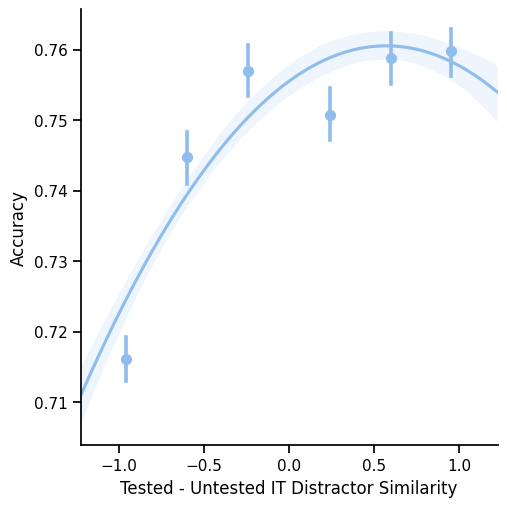

In [12]:
single_color = palette[0]  # Use the first color from the palette
single_color_palette = [single_color]


plt.figure(figsize=(10, 6))
sns.lmplot(
    x="Tested - Untested IT Distractor Similarity",
    y='Accuracy',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette,
    data=df
)

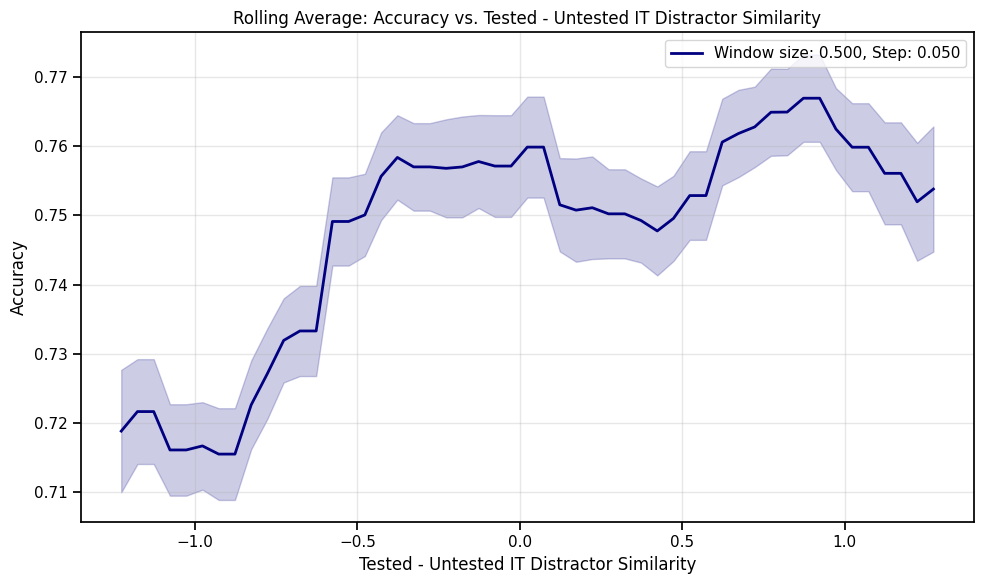

In [13]:
def basic_sliding_window(df, x_col="Tested - Untested IT Distractor Similarity", 
                         y_col='Accuracy', window_size=0.01, step_size=0.001):
    
    # Basic sliding window approach with fixed window size and step.
    
    plt.figure(figsize=(10, 6))
    
    # Get x range
    x_min = df[x_col].min()
    x_max = df[x_col].max()
    
    # Create evaluation points
    eval_points = np.arange(x_min, x_max + step_size, step_size)
    
    # Arrays to store results
    x_values = []
    y_values = []
    y_errors = []
    n_points = []
    
    for x_center in eval_points:
        window_data = df[(df[x_col] >= x_center - window_size/2) & 
                         (df[x_col] <= x_center + window_size/2)]
        
        if len(window_data) >= 5:
            mean_y = window_data[y_col].mean()
            std_y = window_data[y_col].std()
            sem_y = std_y / np.sqrt(len(window_data))
            
            x_values.append(x_center)
            y_values.append(mean_y)
            y_errors.append(sem_y)
            n_points.append(len(window_data))
    
    x_values = np.array(x_values)
    y_values = np.array(y_values)
    y_errors = np.array(y_errors)
    
    plt.plot(x_values, y_values, color='navy', linewidth=2, 
             label=f'Window size: {window_size:.3f}, Step: {step_size:.3f}')
    
    plt.fill_between(x_values, 
                     y_values - 1.96 * y_errors,
                     y_values + 1.96 * y_errors,
                     color='navy', alpha=0.2)
    
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f'Rolling Average: {y_col} vs. {x_col}')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    
    return plt


basic_sliding_window(df, 'Tested - Untested IT Distractor Similarity', 'Accuracy', 0.5, 0.05)


plt.show()

In [16]:
def sliding_window_percentage(df, x_col, y_col='Accuracy', 
                            window_percent=0.1, step_percent=0.01,
                            figsize=(10, 6), line_color='#1f77b4'):
    
   
    df_sorted = df.sort_values(by=x_col).reset_index(drop=True)
    
    # Calculate window and step sizes
    n_points = len(df_sorted)
    window_points = max(int(n_points * window_percent), 3)  # At least a window of 3 points
    step_points = max(int(n_points * step_percent), 1)      # At least a step of 1 point
    
    print(f"Total points: {n_points}, Window size: {window_points}, Step size: {step_points}")
    
    # Create lists to hold values
    x_values, y_values, err_values = [], [], []
    
    # Calculate rolling average
    if n_points >= window_points:
        for i in range(0, n_points - window_points + 1, step_points):
            window = df_sorted.iloc[i : i + window_points]
            x_values.append(window[x_col].mean())
            y_values.append(window[y_col].mean())
            err_values.append(window[y_col].std() / np.sqrt(window_points))
    
    x_values = np.array(x_values)
    y_values = np.array(y_values)
    err_values = np.array(err_values)
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot rolling average
    if len(x_values) > 0:
        ax.plot(x_values, y_values, color=line_color, linewidth=2.5, label='Rolling average')
        ax.fill_between(x_values, 
                      y_values - 1.96 * err_values, 
                      y_values + 1.96 * err_values, 
                      color=line_color, alpha=0.2)
    else:
        ax.text(0.5, 0.5, "Insufficient data for window analysis", 
              ha='center', va='center', transform=ax.transAxes)
    
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    

    
    if y_col.lower() in ['accuracy', 'acc', 'correct', 'resp_correct']:
        y_min = 0.7
        y_max = 0.8
        ax.set_ylim(y_min, y_max)
    
    window_percent_text = f"{window_percent*100:.0f}%"
    ax.set_title(f'Rolling Average Analysis (Window Size: {window_percent_text} of data)', 
               fontsize=14)
    
    plt.tight_layout()
    return fig

# Example usage:
# plot = sliding_window_percentage(
#     df, 
#     x_col="Tested - Untested IT Distractor Similarity",
#     y_col="Accuracy", 
#     window_percent=0.1, 
#     step_percent=0.01
# )
# plt.show()

Total points: 81000, Window size: 8100, Step size: 810


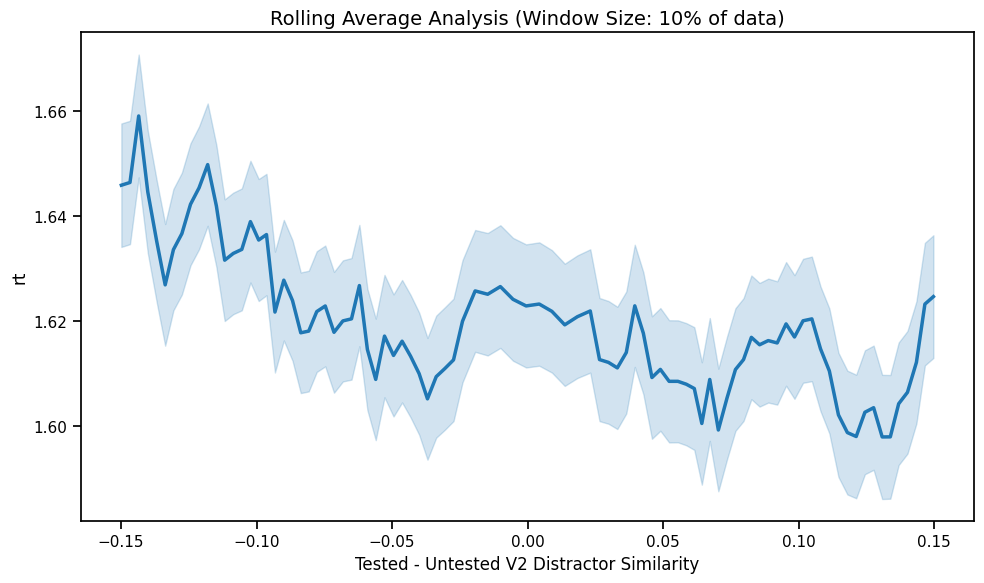

In [17]:
plot = sliding_window_percentage(
    df, 
    x_col="Tested - Untested V2 Distractor Similarity",
    y_col="rt", 
    window_percent=0.1, 
    step_percent=0.01
)
plt.show()

In [18]:
def simple_sliding_window_points(df, x_col="Tested - Untested IT Distractor Similarity", 
                         y_col='Accuracy', window_points=10, step_points=2):
    
    plt.figure(figsize=(10, 6))
    
    sorted_df = df.sort_values(by=x_col).reset_index(drop=True)
    
    total_points = len(sorted_df)
    
    window_points = min(window_points, total_points)
    
    x_values = [] 
    y_values = []  
    y_errors = []  
    
    # Slide window across the data points
    for i in range(0, total_points - window_points + 1, step_points):
        window = sorted_df.iloc[i:i+window_points]
        
        mean_x = window[x_col].mean()
        mean_y = window[y_col].mean()
        
        std_y = window[y_col].std()
        sem_y = std_y / np.sqrt(window_points)
        
        x_values.append(mean_x)
        y_values.append(mean_y)
        y_errors.append(sem_y)
    
    x_values = np.array(x_values)
    y_values = np.array(y_values)
    y_errors = np.array(y_errors)
    
    plt.plot(x_values, y_values, color='navy', linewidth=2.5)
    
    plt.fill_between(x_values, 
                     y_values - 1.96 * y_errors,
                     y_values + 1.96 * y_errors,
                     color='navy', alpha=0.2)
    
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f'Rolling Average of {y_col} ({window_points} points per window), step size of {step_points}')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    return plt



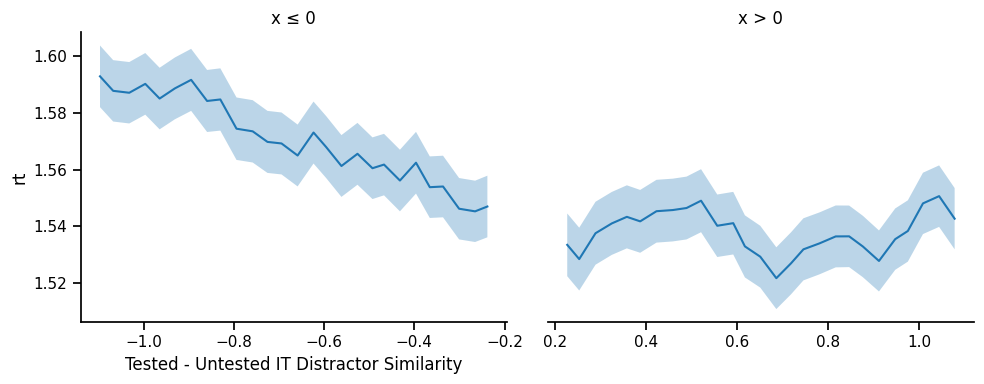

In [19]:
def plot_sliding_window_true_split(df, x_col, y_col='Accuracy', window_points=10, step_points=2):
    # First split the dataframe
    df_neg = df[df[x_col] <= 0].sort_values(by=x_col).reset_index(drop=True)
    df_pos = df[df[x_col] > 0].sort_values(by=x_col).reset_index(drop=True)
    
    # Process negative values
    x_neg, y_neg, err_neg = [], [], []
    n_neg = len(df_neg)
    window_points_neg = min(window_points, n_neg)
    
    for i in range(0, n_neg - window_points_neg + 1, step_points):
        window = df_neg.iloc[i : i + window_points_neg]
        x_neg.append(window[x_col].mean())
        y_neg.append(window[y_col].mean())
        err_neg.append(window[y_col].std() / np.sqrt(window_points_neg))
    
    # Process positive values (separately)
    x_pos, y_pos, err_pos = [], [], []
    n_pos = len(df_pos)
    window_points_pos = min(window_points, n_pos)
    
    for i in range(0, n_pos - window_points_pos + 1, step_points):
        window = df_pos.iloc[i : i + window_points_pos]
        x_pos.append(window[x_col].mean())
        y_pos.append(window[y_col].mean())
        err_pos.append(window[y_col].std() / np.sqrt(window_points_pos))
    
    # Convert to numpy arrays
    x_neg, y_neg, err_neg = np.array(x_neg), np.array(y_neg), np.array(err_neg)
    x_pos, y_pos, err_pos = np.array(x_pos), np.array(y_pos), np.array(err_pos)
    
    # Create the split plot
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    
    # Plot negative side
    ax_left.plot(x_neg, y_neg)
    ax_left.fill_between(x_neg, y_neg - 1.96 * err_neg, y_neg + 1.96 * err_neg, alpha=0.3)
    ax_left.set_title("x ≤ 0")
    ax_left.set_xlabel(x_col)
    ax_left.set_ylabel(y_col)
    
    # Plot positive side
    ax_right.plot(x_pos, y_pos)
    ax_right.fill_between(x_pos, y_pos - 1.96 * err_pos, y_pos + 1.96 * err_pos, alpha=0.3)
    ax_right.set_title("x > 0")
    ax_right.set_xlabel("")
    ax_right.yaxis.set_visible(False)
    
    # Style the plot
    ax_right.spines['left'].set_visible(False)
    ax_left.spines['right'].set_visible(False)
    ax_right.spines['right'].set_visible(False)
    ax_right.spines['top'].set_visible(False)
    ax_left.spines['top'].set_visible(False)
    
    plt.tight_layout()
    plt.show()


# and you might also play around with trying to include both this rolling average and the model fits
# on the same plot, 
# e.g., the rolling average lighter in the background, and the model fit bolder in front)
plot_sliding_window_true_split(df_correct, "Tested - Untested IT Distractor Similarity", 'rt', 8250, 825)


In [20]:
def plot_sliding_window_true_split_percentage(df, x_col, y_col='Accuracy', 
                                           window_percent=0.1, step_percent=0.01,
                                           split_value=0, figsize=(12, 5),
                                           neg_color='#1f77b4'):
    
    import numpy as np
    import matplotlib.pyplot as plt
    
    df_neg = df[df[x_col] <= split_value].sort_values(by=x_col).reset_index(drop=True)
    df_pos = df[df[x_col] > split_value].sort_values(by=x_col).reset_index(drop=True)
    
    n_neg = len(df_neg)
    window_points_neg = max(int(n_neg * window_percent), 3)  # At least 3 points
    step_points_neg = max(int(n_neg * step_percent), 1)      # At least 1 point
    
    n_pos = len(df_pos)
    window_points_pos = max(int(n_pos * window_percent), 3)  # At least 3 points
    step_points_pos = max(int(n_pos * step_percent), 1)      # At least 1 point
    
    print(f"Negative side - Total points: {n_neg}, Window size: {window_points_neg}, Step size: {step_points_neg}")
    print(f"Positive side - Total points: {n_pos}, Window size: {window_points_pos}, Step size: {step_points_pos}")
    
    x_neg, y_neg, err_neg = [], [], []
    
    if n_neg >= window_points_neg:
        for i in range(0, n_neg - window_points_neg + 1, step_points_neg):
            window = df_neg.iloc[i : i + window_points_neg]
            x_neg.append(window[x_col].mean())
            y_neg.append(window[y_col].mean())
            err_neg.append(window[y_col].std() / np.sqrt(window_points_neg))
    
    x_pos, y_pos, err_pos = [], [], []
    
    if n_pos >= window_points_pos:
        for i in range(0, n_pos - window_points_pos + 1, step_points_pos):
            window = df_pos.iloc[i : i + window_points_pos]
            x_pos.append(window[x_col].mean())
            y_pos.append(window[y_col].mean())
            err_pos.append(window[y_col].std() / np.sqrt(window_points_pos))
    
    x_neg, y_neg, err_neg = np.array(x_neg), np.array(y_neg), np.array(err_neg)
    x_pos, y_pos, err_pos = np.array(x_pos), np.array(y_pos), np.array(err_pos)
    
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=figsize, sharey=True)
    
    if len(x_neg) > 0:
        ax_left.plot(x_neg, y_neg, linewidth=2)
        ax_left.fill_between(x_neg, y_neg - 1.96 * err_neg, y_neg + 1.96 * err_neg, 
                            alpha=0.3)
    else:
        ax_left.text(0.5, 0.5, "Insufficient data\nfor window analysis", 
                   ha='center', va='center', transform=ax_left.transAxes)
    
    # Plot positive side
    if len(x_pos) > 0:
        ax_right.plot(x_pos, y_pos, linewidth=2)
        ax_right.fill_between(x_pos, y_pos - 1.96 * err_pos, y_pos + 1.96 * err_pos, 
                            alpha=0.3)
    else:
        ax_right.text(0.5, 0.5, "Insufficient data\nfor window analysis", 
                    ha='center', va='center', transform=ax_right.transAxes)
    
    # Set titles and labels
    ax_left.set_title(f"{x_col} ≤ {split_value}")
    ax_right.set_title(f"{x_col} > {split_value}")
    ax_left.set_xlabel(x_col)
    ax_right.set_xlabel(x_col)
    ax_left.set_ylabel(y_col)
    
    # Style the plot
    ax_right.yaxis.set_visible(False)
    ax_right.spines['left'].set_visible(False)
    ax_left.spines['right'].set_visible(False)
    ax_right.spines['right'].set_visible(False)
    ax_right.spines['top'].set_visible(False)
    ax_left.spines['top'].set_visible(False)
    
    
    
    window_percent_text = f"{window_percent*100:.0f}%"
    fig.suptitle(f'Sliding Window Analysis (Window Size: {window_percent_text} of data per side)', 
                y=0.98, fontsize=12)
    
    plt.tight_layout()
    return fig



Total points: 81000, Window size: 16200, Step size: 1620


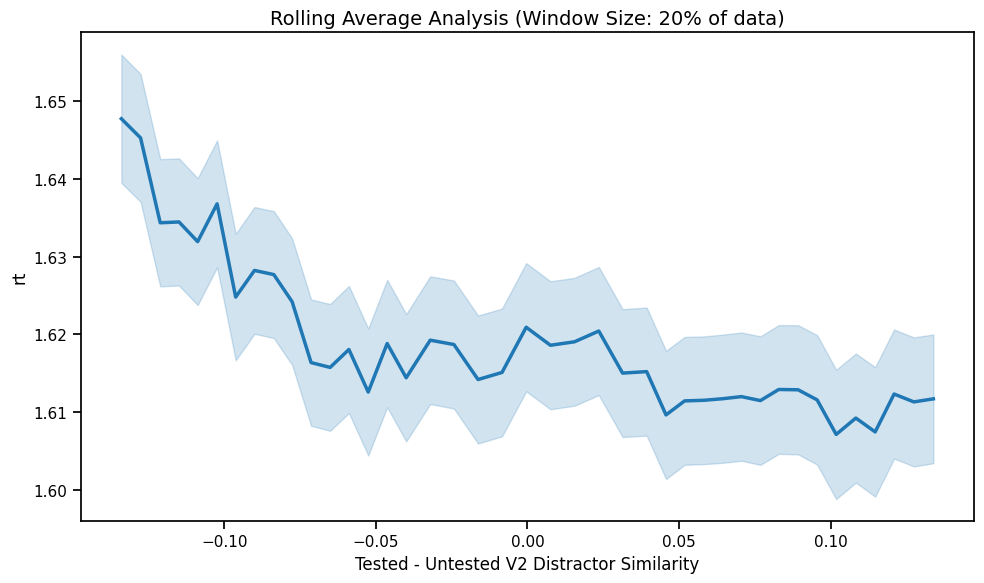

Negative side - Total points: 40544, Window size: 8108, Step size: 810
Positive side - Total points: 40456, Window size: 8091, Step size: 809


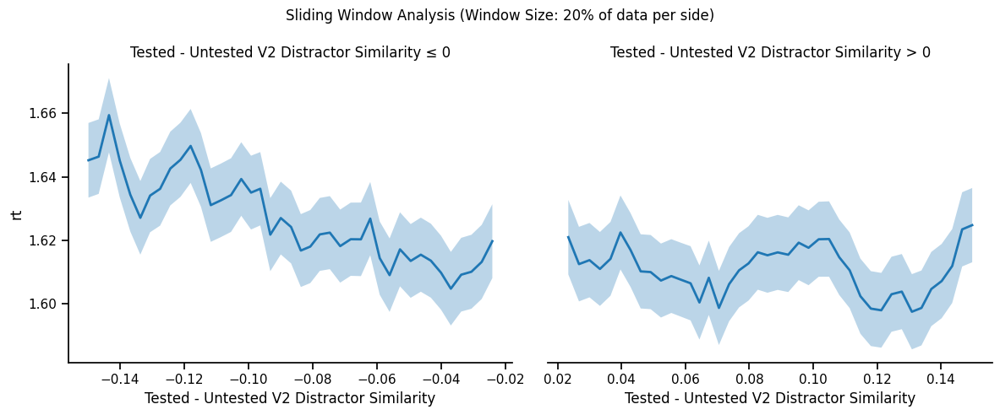

In [21]:
plot = sliding_window_percentage(
    df, 
    x_col="Tested - Untested V2 Distractor Similarity",
    y_col="rt", 
    window_percent=0.2, 
    step_percent=0.02
)
plt.show()
# Basic sliding window with percentage-based windows
fig1 = plot_sliding_window_true_split_percentage(
    df, 
    "Tested - Untested V2 Distractor Similarity", 
    'rt',
    window_percent=0.2,   # 10% of data points on each side
    step_percent=0.02     # 1% of data points on each side
)
plt.show()



In [22]:
def simple_sliding_window_by_item_percentage(df, x_col="Tested - Untested IT Distractor Similarity", 
                                           y_col='Accuracy', item_col='Tested Item',
                                           window_percent=0.1, step_percent=0.01):
    plt.figure(figsize=(10, 6))
    
    tested_items = df[item_col].unique()
    
    color_map = {
        'prioritized': '#FF69B4',    # Pink
        'deprioritized': '#2ca02c',  # Green
    }
    
    default_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd', '#8c564b']
    
    for i, item in enumerate(tested_items):
        df_item = df[df[item_col] == item].sort_values(by=x_col).reset_index(drop=True)
        
        total_points = len(df_item)
        
        window_points = max(int(total_points * window_percent), 3)  # Ensure at least 3 points
        step_points = max(int(total_points * step_percent), 1)      # Ensure at least 1 point
        
        if total_points < window_points:
            print(f"Skipping {item} - insufficient data points ({total_points} < {window_points})")
            continue
            
        print(f"Item: {item}, Total points: {total_points}, Window size: {window_points}, Step size: {step_points}")
            
        x_values = []
        y_values = []
        y_errors = []
        
        for j in range(0, total_points - window_points + 1, step_points):
            window = df_item.iloc[j:j+window_points]
            
            mean_x = window[x_col].mean()
            mean_y = window[y_col].mean()
            
            std_y = window[y_col].std()
            sem_y = std_y / np.sqrt(window_points)
            
            x_values.append(mean_x)
            y_values.append(mean_y)
            y_errors.append(sem_y)
        
        x_values = np.array(x_values)
        y_values = np.array(y_values)
        y_errors = np.array(y_errors)
        
        if len(x_values) == 0:
            continue
        
        item_lower = str(item).lower()
        if item_lower in color_map:
            color = color_map[item_lower]
        elif 'prioritized' in item_lower:
            color = color_map['prioritized']
        elif 'deprioritized' in item_lower:
            color = color_map['deprioritized']
        else:
            color = default_colors[i % len(default_colors)]
        
        plt.plot(x_values, y_values, color=color, linewidth=2.5, label=f'{item}')
        
        plt.fill_between(x_values, 
                         y_values - 1.96 * y_errors,
                         y_values + 1.96 * y_errors,
                         color=color, alpha=0.2)
    
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f'Rolling Average by {item_col} (Window: {window_percent*100:.0f}% of data)')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    if y_col.lower() in ['accuracy', 'acc', 'correct', 'resp_correct']:
        plt.ylim(0.6, 0.8)
    
    plt.tight_layout()
    
    return plt

In [23]:
def plot_sliding_window_double_split_percentage(df, x_col="Tested - Untested IT Distractor Similarity", 
                                             y_col='Accuracy', item_col='Tested Item', 
                                             window_percent=0.1, step_percent=0.01,
                                             split_value=0):
    """
    Creates a sliding window visualization that:
    1. Splits the data at x=split_value (e.g., negative vs positive)
    2. Within each split, creates separate lines for different tested items
    3. Uses window and step sizes based on percentages of data available for each item
    
    Parameters:
    -----------
    df : pandas DataFrame
        The data frame containing the data
    x_col : str
        Name of the column to use for x-axis
    y_col : str
        Name of the column to use for y-axis
    item_col : str
        Name of the column that contains the item identifiers
    window_percent : float
        Size of the window as a percentage of total points for each item (default: 0.1 or 10%)
    step_percent : float
        Size of the step as a percentage of total points for each item (default: 0.01 or 1%)
    split_value : float
        Value at which to split the data (default: 0)
        
    Returns:
    --------
    matplotlib.figure.Figure
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Split the data
    df_left = df[df[x_col] <= split_value].copy()
    df_right = df[df[x_col] > split_value].copy()
    
    tested_items = df[item_col].unique()
    
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)
    
    default_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd', '#8c564b']
    color_map = {
        'prioritized': '#FF69B4',    # Pink
        'deprioritized': '#2ca02c',  # Green
    }
    
    # Function to process data for each side
    def process_side(df_side, ax, side_name):
        for i, item in enumerate(tested_items):
            df_item = df_side[df_side[item_col] == item].sort_values(by=x_col).reset_index(drop=True)
            
            total_points = len(df_item)
            
            # Calculate window and step sizes based on percentages
            window_points = max(int(total_points * window_percent), 3)  # Ensure at least 3 points
            step_points = max(int(total_points * step_percent), 1)      # Ensure at least 1 point
            
            if total_points < window_points:
                print(f"Skipping {item} on {side_name} side - insufficient data points ({total_points} < {window_points})")
                continue
                
            print(f"{side_name} side - Item: {item}, Total points: {total_points}, "
                  f"Window size: {window_points}, Step size: {step_points}")
                
            x_vals, y_vals, y_errs = [], [], []
            
            for j in range(0, total_points - window_points + 1, step_points):
                window = df_item.iloc[j:j+window_points]
                
                mean_x = window[x_col].mean()
                mean_y = window[y_col].mean()
                std_y = window[y_col].std()
                sem_y = std_y / np.sqrt(window_points)
                
                x_vals.append(mean_x)
                y_vals.append(mean_y)
                y_errs.append(sem_y)
            
            x_vals = np.array(x_vals)
            y_vals = np.array(y_vals)
            y_errs = np.array(y_errs)
            
            if len(x_vals) == 0:
                continue
            
            item_lower = str(item).lower()
            if item_lower in color_map:
                color = color_map[item_lower]
            elif 'prioritized' in item_lower:
                color = color_map['prioritized']
            elif 'deprioritized' in item_lower:
                color = color_map['deprioritized']
            else:
                color = default_colors[i % len(default_colors)]
            
            ax.plot(x_vals, y_vals, color=color, linewidth=2, label=f'{item}')
            ax.fill_between(x_vals, 
                           y_vals - 1.96 * y_errs,
                           y_vals + 1.96 * y_errs,
                           color=color, alpha=0.2)
    
    # Process both sides
    process_side(df_left, ax_left, "left")
    process_side(df_right, ax_right, "right")
    
    # Set titles and labels
    ax_left.set_title(f"{x_col} ≤ {split_value}")
    ax_right.set_title(f"{x_col} > {split_value}")
    
    ax_left.set_xlabel(x_col)
    ax_right.set_xlabel(x_col)
    
    ax_left.set_ylabel(y_col)
    
    # Style the axes
    ax_right.yaxis.set_visible(False)
    ax_right.spines['left'].set_visible(False)
    ax_left.spines['right'].set_visible(False)
    ax_right.spines['right'].set_visible(False)
    ax_right.spines['top'].set_visible(False)
    ax_left.spines['top'].set_visible(False)
    
    # Add legend to right plot
    handles, labels = ax_right.get_legend_handles_labels()
    if not handles:  # If right side has no legend, try left side
        handles, labels = ax_left.get_legend_handles_labels()
    
    # Place legend outside if many items
    if len(handles) > 4:
        fig.legend(handles, labels, loc='lower center', ncol=len(handles), bbox_to_anchor=(0.5, -0.05))
    else:
        ax_right.legend(loc='best')
    
    # Set y-limits for accuracy plots
    if y_col.lower() in ['accuracy', 'acc', 'correct', 'resp_correct']:
        y_min = 0.6
        y_max = 0.8
        ax_left.set_ylim(y_min, y_max)
    
    # Add grid
    ax_left.grid(alpha=0.3)
    ax_right.grid(alpha=0.3)
    
    window_percent_text = f"{window_percent*100:.0f}%"
    fig.suptitle(f'Sliding Window Analysis (Window Size: {window_percent_text} of data per item)', 
                 fontsize=14, y=0.98)
    
    plt.tight_layout()
    return fig

Item: prioritized, Total points: 60750, Window size: 6075, Step size: 607
Item: deprioritized, Total points: 20250, Window size: 2025, Step size: 202


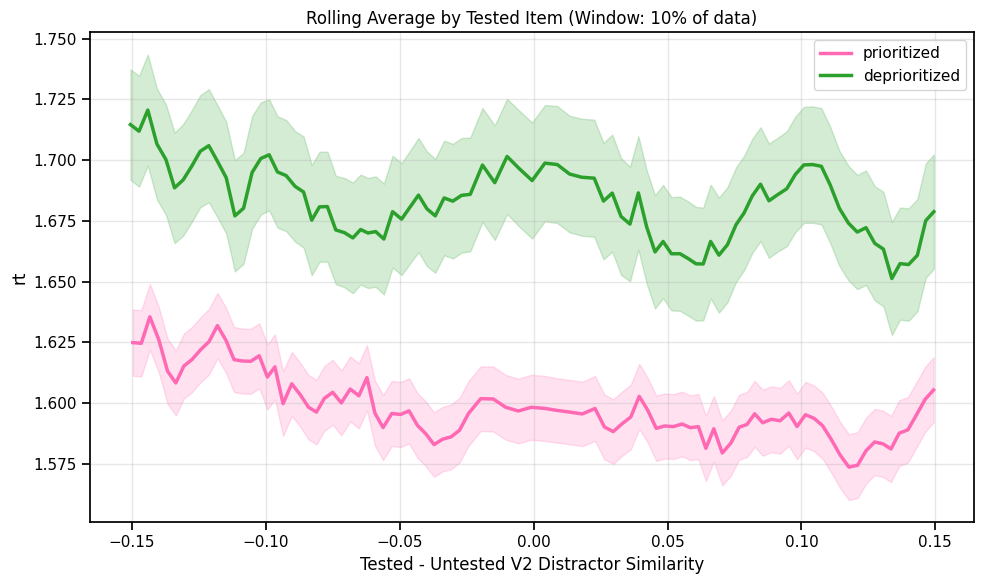

left side - Item: prioritized, Total points: 30415, Window size: 6083, Step size: 669
left side - Item: deprioritized, Total points: 10129, Window size: 2025, Step size: 222
right side - Item: prioritized, Total points: 30335, Window size: 6067, Step size: 667
right side - Item: deprioritized, Total points: 10121, Window size: 2024, Step size: 222


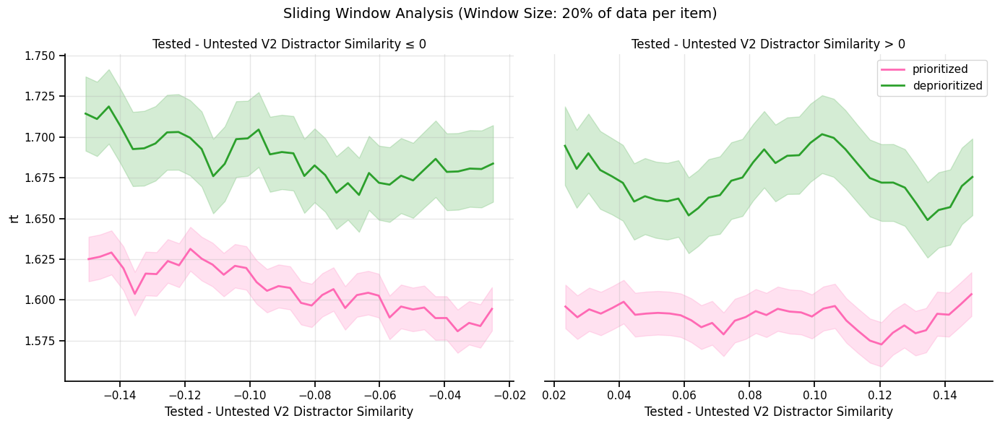

In [24]:
simple_sliding_window_by_item_percentage(
    df, 
    x_col="Tested - Untested V2 Distractor Similarity",
    y_col='rt',
    item_col='Tested Item',
    window_percent=0.1,   # 10% of data points for each item
    step_percent=0.01     # 1% of data points for each item (10% of window size)
)
plt.show()

fig = plot_sliding_window_double_split_percentage(
    df, 
    x_col="Tested - Untested V2 Distractor Similarity",
    y_col='rt',
    item_col='Tested Item',
    window_percent=0.2,    # 10% of data points for each item
    step_percent=0.022      # 1% of data points for each item (10% of window size)
)
plt.show()

left side - Item: prioritized, Total points: 30415, Window size: 6083, Step size: 608
left side - Item: deprioritized, Total points: 10129, Window size: 2025, Step size: 202
right side - Item: prioritized, Total points: 30335, Window size: 6067, Step size: 606
right side - Item: deprioritized, Total points: 10121, Window size: 2024, Step size: 202


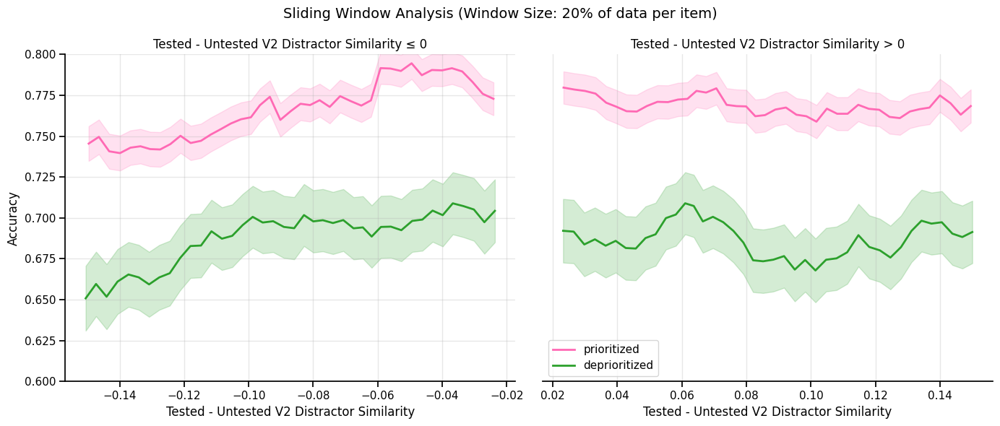

In [25]:
fig = plot_sliding_window_double_split_percentage(
    df, 
    x_col="Tested - Untested V2 Distractor Similarity",
    y_col='Accuracy',
    item_col='Tested Item',
    window_percent=0.2,    # 10% of data points for each item
    step_percent=0.02      # 1% of data points for each item (10% of window size)
)
plt.show()

<Figure size 1000x600 with 0 Axes>

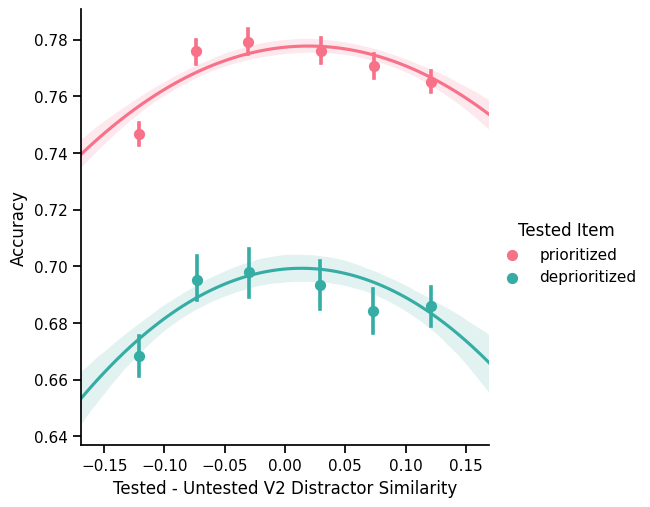

In [26]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x="Tested - Untested V2 Distractor Similarity",
    y='Accuracy',
    hue = 'Tested Item',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order

    data=df
)


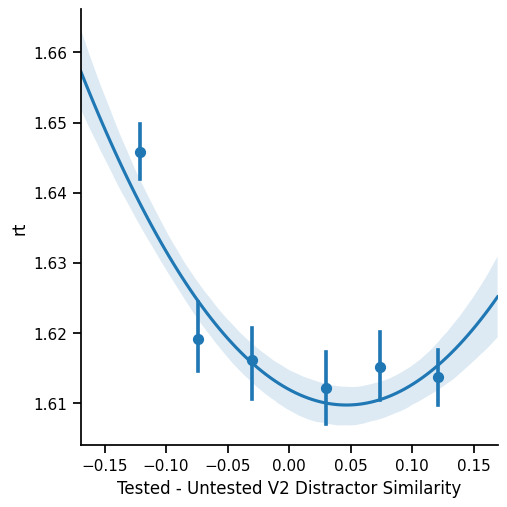

In [27]:


# plt.figure(figsize=(10, 6))
sns.lmplot(
    x="Tested - Untested V2 Distractor Similarity",
    y='rt',
    # hue='Tested Item',
    # row = 'Retrocue Reliability',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order

    data=df
)


In [29]:
# sns.set_context()
# plt.figure(figsize=(10, 6))

# g = sns.lmplot(
#     x='Tested - Untested V2 Distractor Similarity',
#     y='rt',
#     # hue='Tested Item',
#     col='v2_pos_neg',
#     # row = 'Retrocue Reliability',
#     x_bins=3,
#     order=2,
#     height=6,      
#     aspect=0.7,   
#     facet_kws={'sharex': False}, 
#     ci=68,
#     palette=palette[::-1],
#     legend=False,
#     data=df
# )

# # plt.figure(figsize=(10, 6))
# # sns.lmplot(
# #     x='Tested - Untested V2 Distractor Similarity',
# #     y='Accuracy',
# #     hue = 'Tested Item',
# #     col='v2_pos_neg',

# #     x_bins = 3,
# #     order = 2,
# #     ci = 68,
# #     palette = palette[::-1],  # Reverse the color order
# #     data=df
# # )
# g.axes[0,1].yaxis.set_visible(False)
# g.axes[0,1].spines['left'].set_visible(False)
# plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
# g.axes[0,1].set_xlabel('')

<Figure size 1000x600 with 0 Axes>

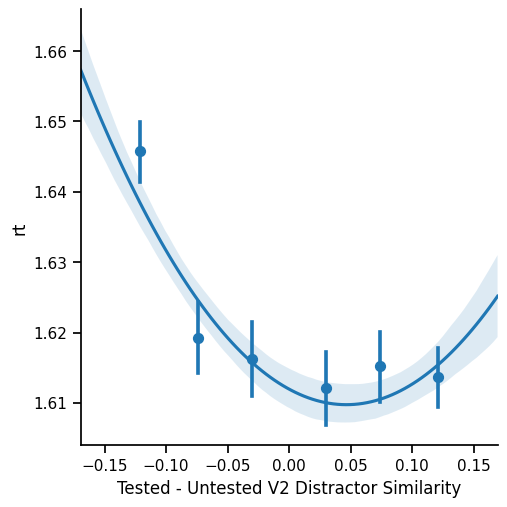

In [30]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='rt',
    # hue = 'Tested Item',
    # col='v2_pos_neg',

    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

Item: prioritized, Total points: 60750, Window size: 6075, Step size: 607
Item: deprioritized, Total points: 20250, Window size: 2025, Step size: 202


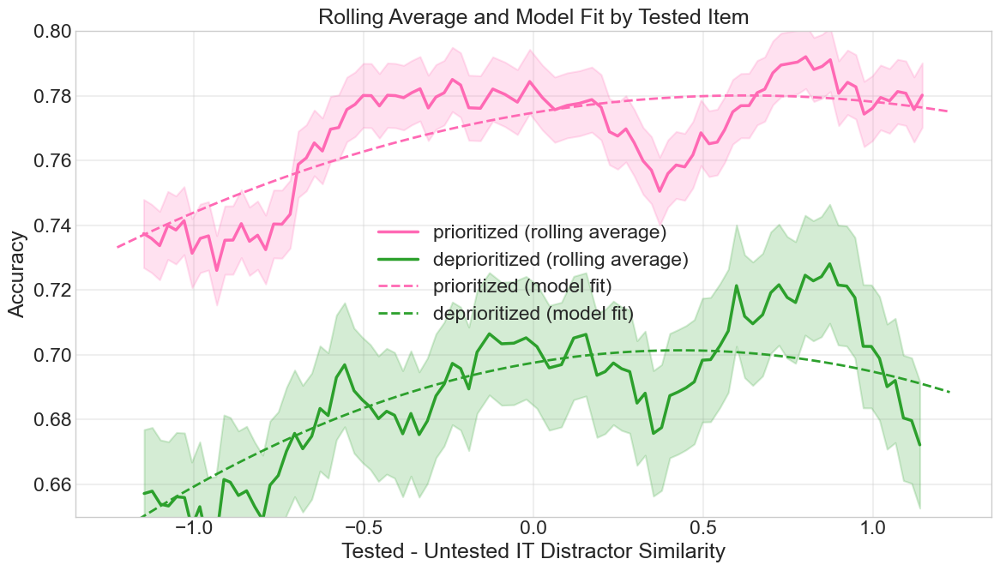

In [277]:
def combined_rolling_average_and_model_fit(df, x_col="Tested - Untested IT Distractor Similarity", 
                                           y_col='Accuracy', item_col='Tested Item',
                                           window_percent=0.1, step_percent=0.01):
    fig, ax = plt.subplots(figsize=(12, 7))
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')
    
    # Remove grid
    ax.grid(False)
    # Get unique tested items
    tested_items = df[item_col].unique()
    
    color_map = {
        'prioritized': '#FF69B4',    # Pink
        'deprioritized': '#2ca02c',  # Green
    }
    
    default_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd', '#8c564b']
    
    # Plot rolling average for each tested item
    for i, item in enumerate(tested_items):
        df_item = df[df[item_col] == item].sort_values(by=x_col).reset_index(drop=True)
        
        total_points = len(df_item)
        
        window_points = max(int(total_points * window_percent), 3)  # Ensure at least 3 points
        step_points = max(int(total_points * step_percent), 1)      # Ensure at least 1 point
        
        if total_points < window_points:
            print(f"Skipping {item} - insufficient data points ({total_points} < {window_points})")
            continue
            
        print(f"Item: {item}, Total points: {total_points}, Window size: {window_points}, Step size: {step_points}")
            
        x_values = []
        y_values = []
        y_errors = []
        
        for j in range(0, total_points - window_points + 1, step_points):
            window = df_item.iloc[j:j+window_points]
            
            mean_x = window[x_col].mean()
            mean_y = window[y_col].mean()
            
            std_y = window[y_col].std()
            sem_y = std_y / np.sqrt(window_points)
            
            x_values.append(mean_x)
            y_values.append(mean_y)
            y_errors.append(sem_y)
        
        x_values = np.array(x_values)
        y_values = np.array(y_values)
        y_errors = np.array(y_errors)
        
        if len(x_values) == 0:
            continue
        
        item_lower = str(item).lower()
        if item_lower in color_map:
            color = color_map[item_lower]
        elif 'prioritized' in item_lower:
            color = color_map['prioritized']
        elif 'deprioritized' in item_lower:
            color = color_map['deprioritized']
        else:
            color = default_colors[i % len(default_colors)]
        
        ax.plot(x_values, y_values, color=color, linewidth=2.5, label=f'{item} (rolling average)')
        
        ax.fill_between(x_values, 
                       y_values - 1.96 * y_errors,
                       y_values + 1.96 * y_errors,
                       color=color, alpha=0.2)
    
    # Add polynomial fit for each item (without the binned points)
    for i, item in enumerate(tested_items):
        df_item = df[df[item_col] == item]
        
        item_lower = str(item).lower()
        if item_lower in color_map:
            color = color_map[item_lower]
        elif 'prioritized' in item_lower:
            color = color_map['prioritized']
        elif 'deprioritized' in item_lower:
            color = color_map['deprioritized']
        else:
            color = default_colors[i % len(default_colors)]
            
        # Fit a 2nd order polynomial
        x_range = np.linspace(df_item[x_col].min(), df_item[x_col].max(), 100)
        model = np.poly1d(np.polyfit(df_item[x_col], df_item[y_col], 2))
        
        # Plot the model fit
        ax.plot(x_range, model(x_range), color=color, linestyle='--', 
                linewidth=2, label=f'{item} (model fit)')
    
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(f'Rolling Average and Model Fit by {item_col}')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    if y_col.lower() in ['accuracy', 'acc', 'correct', 'resp_correct']:
        ax.set_ylim(0.65, 0.8)
    
    plt.tight_layout()
    
    return plt

# Call the function
combined_plot = combined_rolling_average_and_model_fit(
    df, 
    x_col="Tested - Untested IT Distractor Similarity",
    y_col="Accuracy", 
    item_col="Tested Item",
    window_percent=0.1, 
    step_percent=0.01
)

# Show the plot
plt.show()

Item: prioritized, Total points: 60750, Window size: 12150, Step size: 607
Item: deprioritized, Total points: 20250, Window size: 4050, Step size: 202


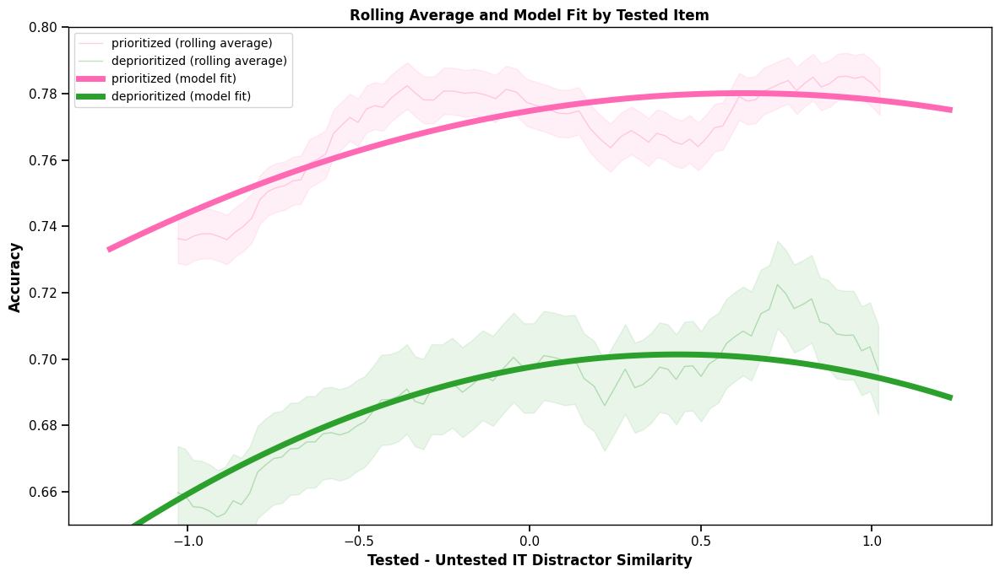

In [32]:
def combined_rolling_average_and_model_fit(df, x_col="Tested - Untested IT Distractor Similarity", 
                                           y_col='Accuracy', item_col='Tested Item',
                                           window_percent=0.2, step_percent=0.01):
    # Create figure with white background
    fig, ax = plt.subplots(figsize=(12, 7))
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')
    
    # Remove grid
    ax.grid(False)
    
    # Get unique tested items
    tested_items = df[item_col].unique()
    
    color_map = {
        'prioritized': '#FF69B4',    # Pink
        'deprioritized': '#2ca02c',  # Green
    }
    
    default_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd', '#8c564b']
    
    # First, plot rolling averages (in background)
    for i, item in enumerate(tested_items):
        df_item = df[df[item_col] == item].sort_values(by=x_col).reset_index(drop=True)
        
        total_points = len(df_item)
        
        window_points = max(int(total_points * window_percent), 3)  # Ensure at least 3 points
        step_points = max(int(total_points * step_percent), 1)      # Ensure at least 1 point
        
        if total_points < window_points:
            print(f"Skipping {item} - insufficient data points ({total_points} < {window_points})")
            continue
            
        print(f"Item: {item}, Total points: {total_points}, Window size: {window_points}, Step size: {step_points}")
            
        x_values = []
        y_values = []
        y_errors = []
        
        for j in range(0, total_points - window_points + 1, step_points):
            window = df_item.iloc[j:j+window_points]
            
            mean_x = window[x_col].mean()
            mean_y = window[y_col].mean()
            
            std_y = window[y_col].std()
            sem_y = std_y / np.sqrt(window_points)
            
            x_values.append(mean_x)
            y_values.append(mean_y)
            y_errors.append(sem_y)
        
        x_values = np.array(x_values)
        y_values = np.array(y_values)
        y_errors = np.array(y_errors)
        
        if len(x_values) == 0:
            continue
        
        item_lower = str(item).lower()
        if item_lower in color_map:
            color = color_map[item_lower]
        elif 'prioritized' in item_lower:
            color = color_map['prioritized']
        elif 'deprioritized' in item_lower:
            color = color_map['deprioritized']
        else:
            color = default_colors[i % len(default_colors)]
        
        # Very transparent rolling average lines
        ax.plot(x_values, y_values, color=color, linewidth=1, alpha=0.3, label=f'{item} (rolling average)')
        
        # Very transparent confidence bands
        ax.fill_between(x_values, 
                       y_values - 1.96 * y_errors,
                       y_values + 1.96 * y_errors,
                       color=color, alpha=0.1)
    
    # Then plot model fits (bold lines on top)
    for i, item in enumerate(tested_items):
        df_item = df[df[item_col] == item]
        
        item_lower = str(item).lower()
        if item_lower in color_map:
            color = color_map[item_lower]
        elif 'prioritized' in item_lower:
            color = color_map['prioritized']
        elif 'deprioritized' in item_lower:
            color = color_map['deprioritized']
        else:
            color = default_colors[i % len(default_colors)]
            
        # Fit a 2nd order polynomial
        x_range = np.linspace(df_item[x_col].min(), df_item[x_col].max(), 100)
        model = np.poly1d(np.polyfit(df_item[x_col], df_item[y_col], 2))
        
        # Very bold model fit lines
        ax.plot(x_range, model(x_range), color=color, linestyle='-', 
                linewidth=5, label=f'{item} (model fit)')
    
    # Styling for axes and labels
    ax.set_xlabel(x_col, fontweight='bold')
    ax.set_ylabel(y_col, fontweight='bold')
    ax.set_title(f'Rolling Average and Model Fit by {item_col}', fontweight='bold')
    
    # Create custom legend with larger font
    ax.legend(frameon=True, fontsize=10)
    
    # Set y-axis limits if applicable
    if y_col.lower() in ['accuracy', 'acc', 'correct', 'resp_correct']:
        ax.set_ylim(0.65, 0.8)
    
    # Add spines with minimal styling
    for spine in ax.spines.values():
        spine.set_color('black')
        spine.set_linewidth(1)
    
    plt.tight_layout()
    
    return plt

# Call the function
combined_plot = combined_rolling_average_and_model_fit(
    df, 
    x_col="Tested - Untested IT Distractor Similarity",
    y_col="Accuracy", 
    item_col="Tested Item",
    window_percent=0.2,  # Changed to 20% window
    step_percent=0.01
)

# Show the plot
plt.show()

Negative side - Item: prioritized, Total points: 30510, Window size: 6102, Step size: 610
Negative side - Item: deprioritized, Total points: 10260, Window size: 2052, Step size: 205
Positive side - Item: prioritized, Total points: 30240, Window size: 6048, Step size: 604
Positive side - Item: deprioritized, Total points: 9990, Window size: 1998, Step size: 199


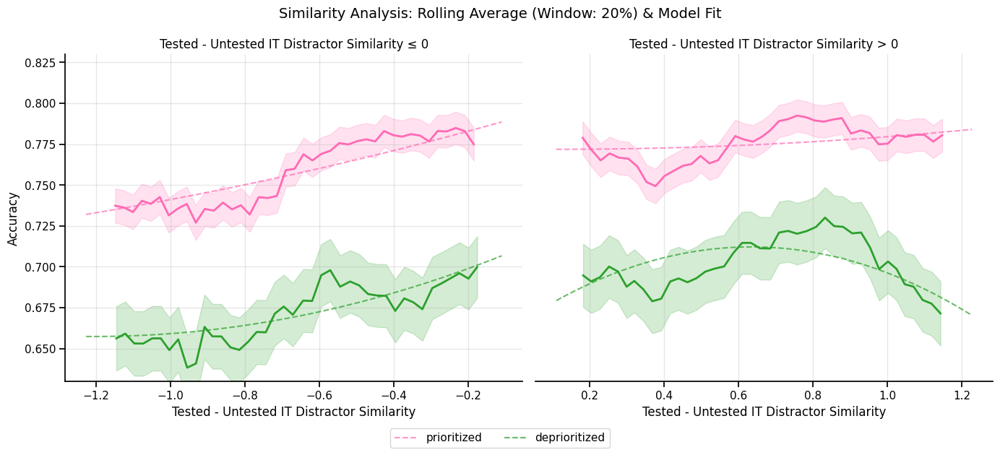

In [34]:
def combined_sliding_window_and_model_fit_split(df, x_col="Tested - Untested V2 Distractor Similarity", 
                                               y_col='Accuracy', item_col='Tested Item',
                                               split_col='v2_pos_neg', split_value=0,
    
    # Split the data
    df_left = df[df[x_col] <= split_value].copy()
    df_right = df[df[x_col] > split_value].copy()
    
    tested_items = df[item_col].unique()
    
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)
    
    color_map = {
        'prioritized': '#FF69B4',    # Pink
        'deprioritized': '#2ca02c',  # Green
    }
    
    default_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd', '#8c564b']
    
    # Function to process data for each side - both rolling average and model fit
    def process_side(df_side, ax, side_name):
        for i, item in enumerate(tested_items):
            df_item = df_side[df_side[item_col] == item].sort_values(by=x_col).reset_index(drop=True)
            
            total_points = len(df_item)
            
            # Calculate window and step sizes based on percentages
            window_points = max(int(total_points * window_percent), 3)  # Ensure at least 3 points
            step_points = max(int(total_points * step_percent), 1)      # Ensure at least 1 point
            
            # Set color based on item
            item_lower = str(item).lower()
            if item_lower in color_map:
                color = color_map[item_lower]
            elif 'prioritized' in item_lower:
                color = color_map['prioritized']
            elif 'deprioritized' in item_lower:
                color = color_map['deprioritized']
            else:
                color = default_colors[i % len(default_colors)]
            
            # 1. Add model fit (polynomial) first so it appears behind the rolling average
            if total_points >= 5:  # Need at least 5 points for a reasonable quadratic fit
                # Fit a 2nd order polynomial
                x_range = np.linspace(df_item[x_col].min(), df_item[x_col].max(), 100)
                model = np.poly1d(np.polyfit(df_item[x_col], df_item[y_col], 2))
                
                # Plot the model fit
                ax.plot(x_range, model(x_range), color=color, linestyle='--', linewidth=1.5, 
                       alpha=0.7, label=f'{item} (model)')
            
            # 2. Add rolling average if enough points
            if total_points < window_points:
                print(f"Skipping {item} on {side_name} side - insufficient data points ({total_points} < {window_points})")
                continue
                
            print(f"{side_name} side - Item: {item}, Total points: {total_points}, "
                  f"Window size: {window_points}, Step size: {step_points}")
                
            x_vals, y_vals, y_errs = [], [], []
            
            for j in range(0, total_points - window_points + 1, step_points):
                window = df_item.iloc[j:j+window_points]
                
                mean_x = window[x_col].mean()
                mean_y = window[y_col].mean()
                std_y = window[y_col].std()
                sem_y = std_y / np.sqrt(window_points)
                
                x_vals.append(mean_x)
                y_vals.append(mean_y)
                y_errs.append(sem_y)
            
            x_vals = np.array(x_vals)
            y_vals = np.array(y_vals)
            y_errs = np.array(y_errs)
            
            if len(x_vals) == 0:
                continue
            
            # Plot rolling average
            ax.plot(x_vals, y_vals, color=color, linewidth=2, label=f'{item} (rolling)')
            ax.fill_between(x_vals, 
                           y_vals - 1.96 * y_errs,
                           y_vals + 1.96 * y_errs,
                           color=color, alpha=0.2)
    
    # Process both sides
    process_side(df_left, ax_left, "Negative")
    process_side(df_right, ax_right, "Positive")
    
    # Set titles and labels
    ax_left.set_title(f"{x_col} ≤ {split_value}")
    ax_right.set_title(f"{x_col} > {split_value}")
    
    ax_left.set_xlabel(x_col)
    ax_right.set_xlabel(x_col)
    
    ax_left.set_ylabel(y_col)
    
    # Style the axes
    ax_right.yaxis.set_visible(False)
    ax_right.spines['left'].set_visible(False)
    ax_left.spines['right'].set_visible(False)
    ax_right.spines['right'].set_visible(False)
    ax_right.spines['top'].set_visible(False)
    ax_left.spines['top'].set_visible(False)
    
    # Add legend to right plot - only keep unique items by using set()
    by_label = {}
    for ax in [ax_left, ax_right]:
        handles, labels = ax.get_legend_handles_labels()
        # Group handles by labels and take the first handle for each label
        for h, lbl in zip(handles, labels):
            # Just use the item name without the "(rolling)" or "(model)" suffix
            if "(" in lbl:
                base_label = lbl.split("(")[0].strip()
            else:
                base_label = lbl
            if base_label not in by_label:
                by_label[base_label] = h
    
    # Place legend outside
    if by_label:
        fig.legend(by_label.values(), by_label.keys(), 
                  loc='lower center', ncol=len(by_label), bbox_to_anchor=(0.5, -0.05))
    
    # Set y-limits for accuracy plots
    if y_col.lower() in ['accuracy', 'acc', 'correct', 'resp_correct']:
        y_min = 0.63
        y_max = 0.83
        ax_left.set_ylim(y_min, y_max)
    
    # Add grid
    ax_left.grid(alpha=0.3)
    ax_right.grid(alpha=0.3)
    
    window_percent_text = f"{window_percent*100:.0f}%"
    fig.suptitle(f'Similarity Analysis: Rolling Average (Window: {window_percent_text}) & Model Fit', 
                 fontsize=14, y=0.98)
    
    plt.tight_layout()
    return fig

fig = combined_sliding_window_and_model_fit_split(
    df, 
    x_col="Tested - Untested IT Distractor Similarity",
    y_col="Accuracy", 
    item_col="Tested Item",
    split_col="it_pos_neg",
    split_value=0,
    window_percent=0.2, 
    step_percent=0.02
)

plt.show()

<Figure size 1000x600 with 0 Axes>

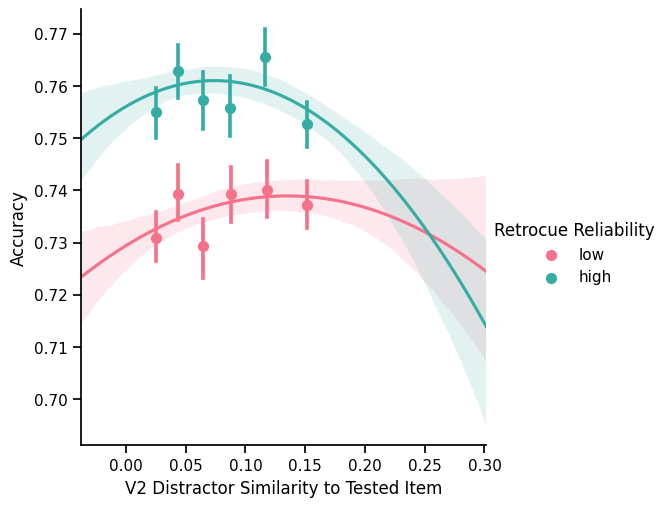

In [35]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='Retrocue Reliability',  
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)
plt.show()

<Figure size 1000x600 with 0 Axes>

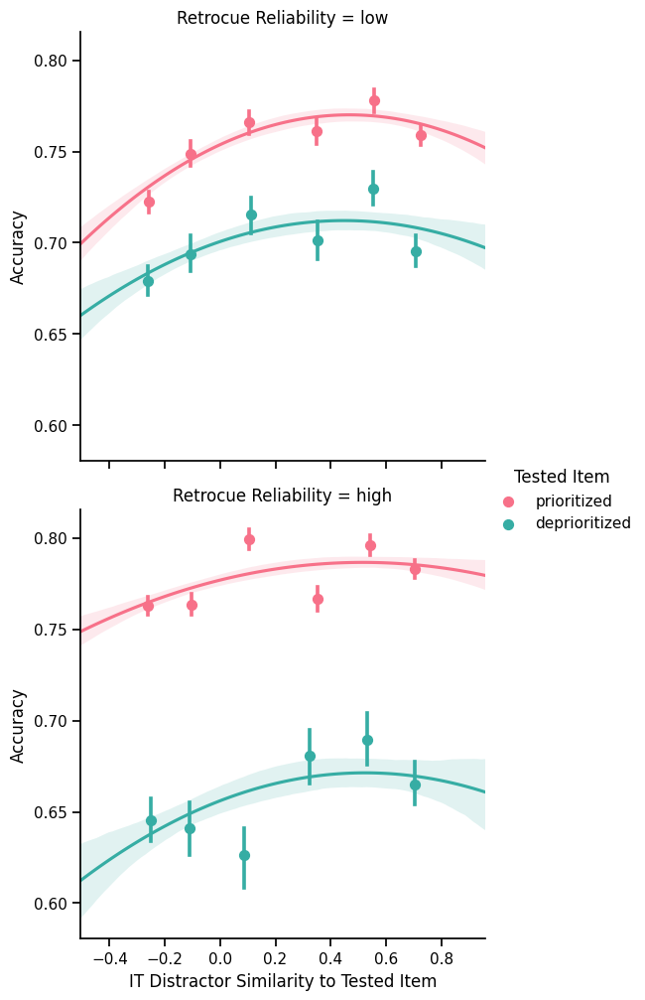

In [36]:


plt.figure(figsize=(10, 6))
sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='Tested Item',
    row='Retrocue Reliability',  
    row_order = ['low', 'high'],
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)


<Figure size 1000x600 with 0 Axes>

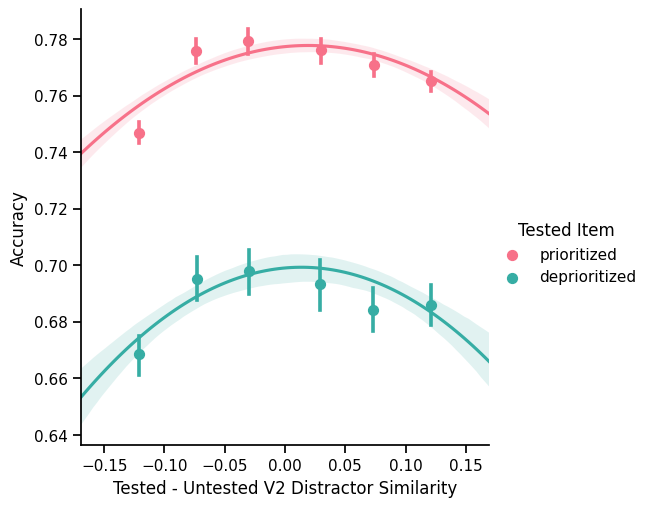

In [37]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue = 'Tested Item',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

<Figure size 1000x600 with 0 Axes>

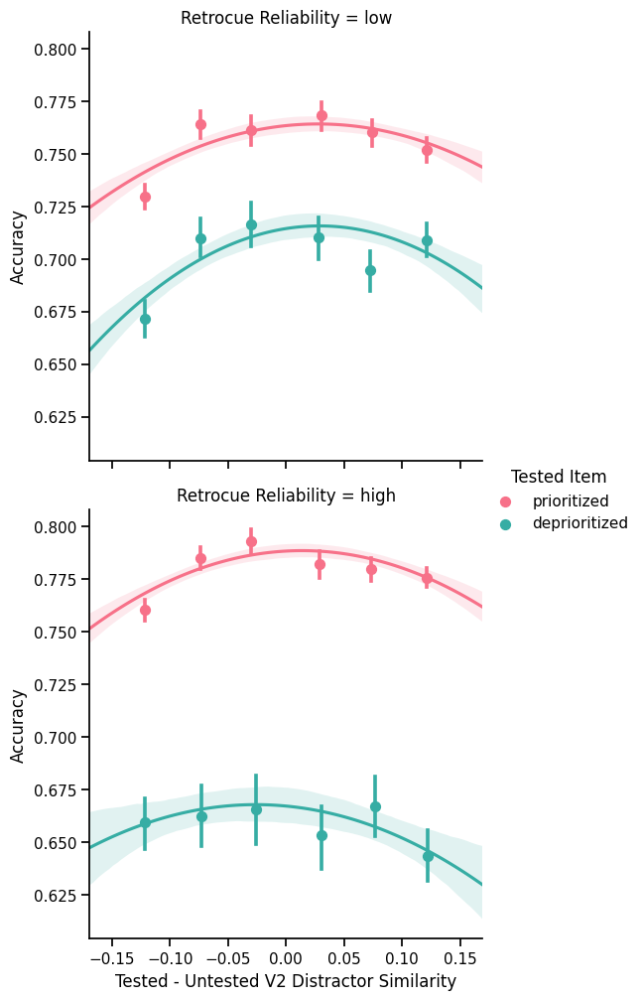

In [38]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue = 'Tested Item',

    row = 'Retrocue Reliability',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

In [39]:
# df_filtered_neg = df[df['Tested - Untested IT Distractor Similarity'] < 0]
# df_filtered_pos = df[df['Tested - Untested IT Distractor Similarity'] >= 0]

<Figure size 1000x600 with 0 Axes>

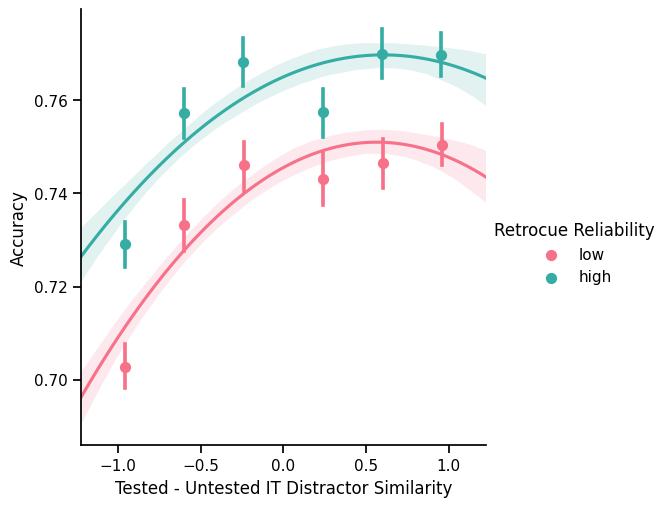

In [40]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Accuracy',
    hue = 'Retrocue Reliability',
    # hue = 'Tested Item',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)


<Figure size 1000x600 with 0 Axes>

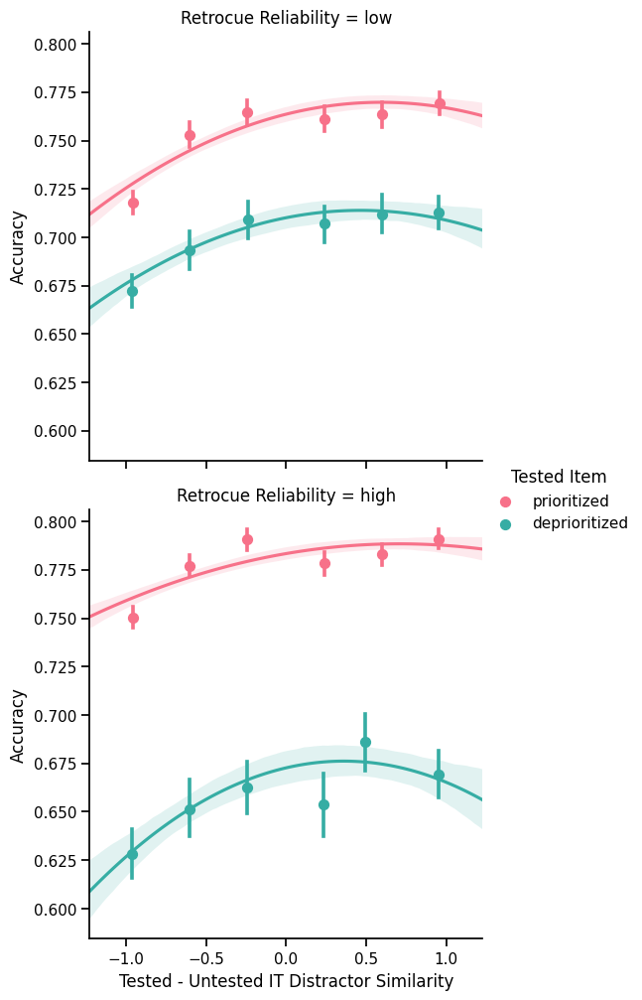

In [41]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Accuracy',
    row = 'Retrocue Reliability',
    hue = 'Tested Item',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)


In [42]:
df_correct['Response Time'] = df_correct['analysis_rt']

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_13687/1728104853.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_correct['Response Time'] = df_correct['analysis_rt']


<Figure size 1000x600 with 0 Axes>

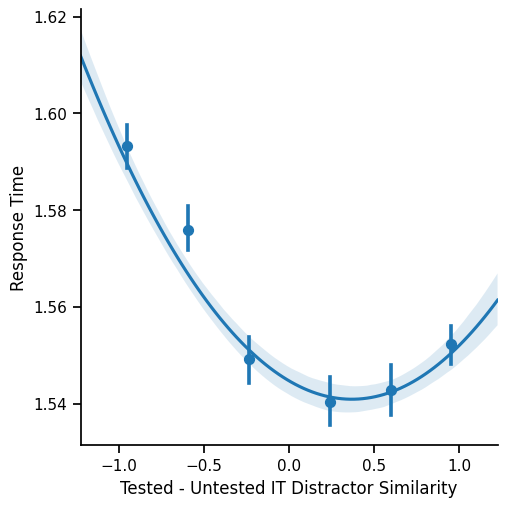

In [43]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Response Time',
#     row = 'Retrocue Reliability',
#     hue = 'Tested Item',
#     row_order = ['low', 'high'],
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)


<Figure size 1000x600 with 0 Axes>

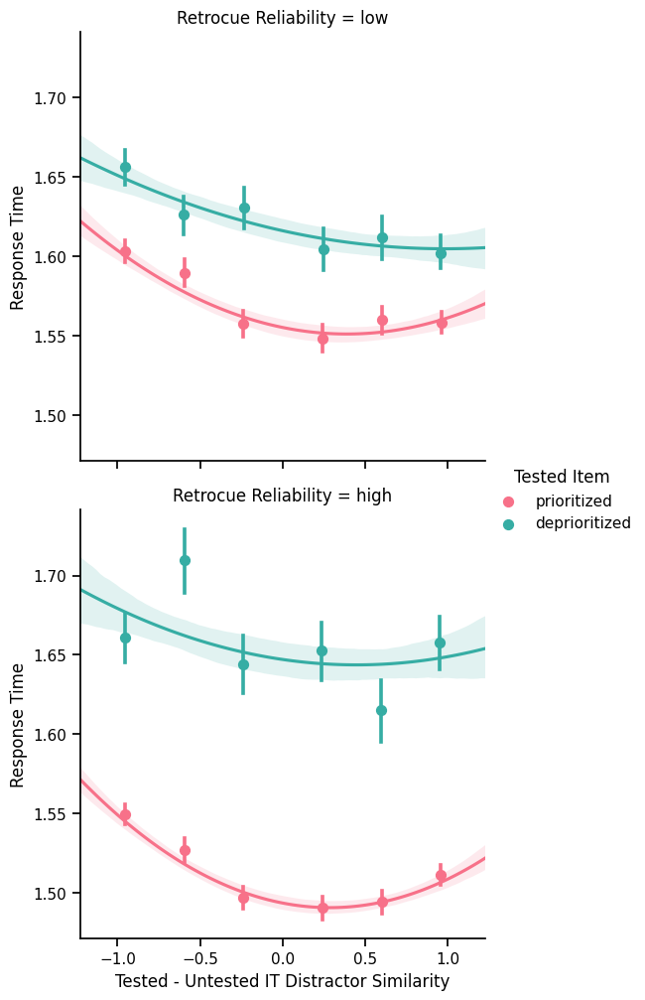

In [44]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Response Time',
    hue = 'Tested Item',
    row = 'Retrocue Reliability',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)

<Figure size 1000x600 with 0 Axes>

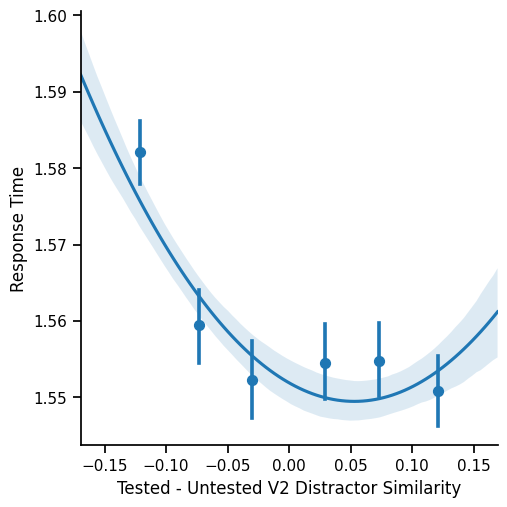

In [45]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Response Time',
    #row = 'Retrocue Reliability',
    # hue = 'Tested Item',
    #row_order = ['low', 'high'],
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)


<Figure size 1000x600 with 0 Axes>

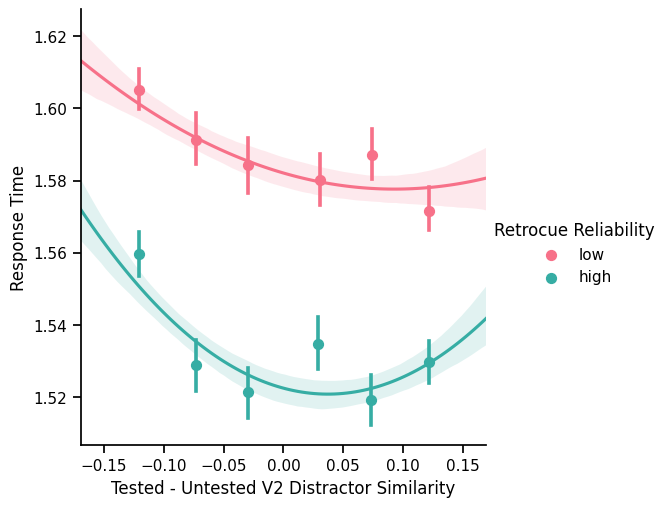

In [46]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Response Time',
    hue = 'Retrocue Reliability',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)

<Figure size 1000x600 with 0 Axes>

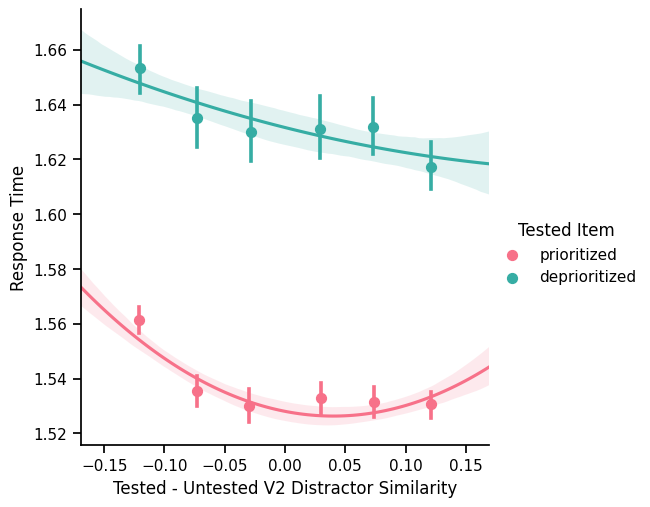

In [47]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Response Time',
    hue = 'Tested Item',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)

<Figure size 1000x600 with 0 Axes>

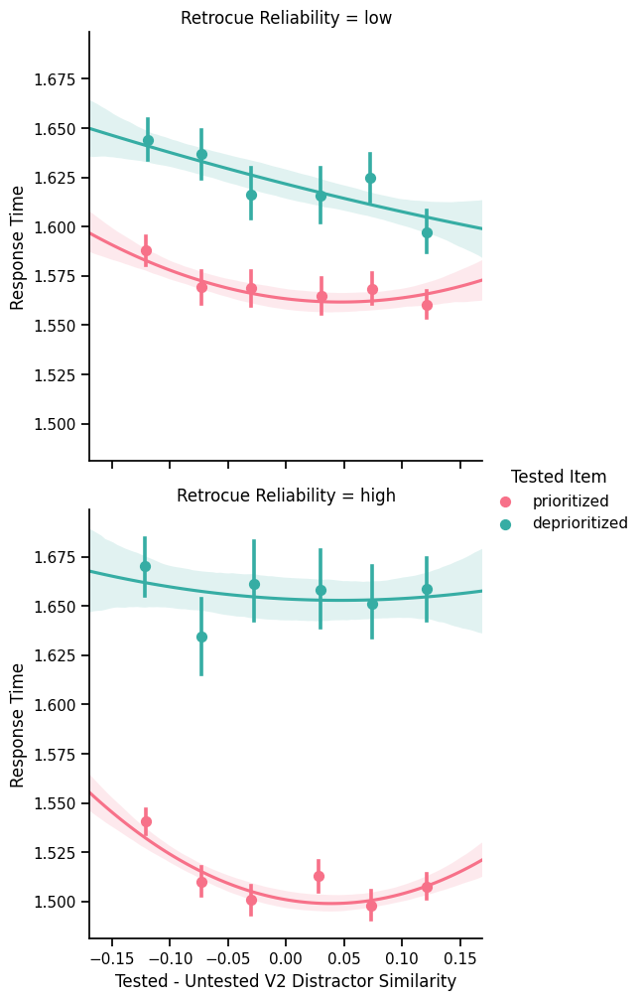

In [48]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Response Time',
    row = 'Retrocue Reliability',
    hue = 'Tested Item',
    row_order = ['low', 'high'],
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)


<Figure size 1000x600 with 0 Axes>

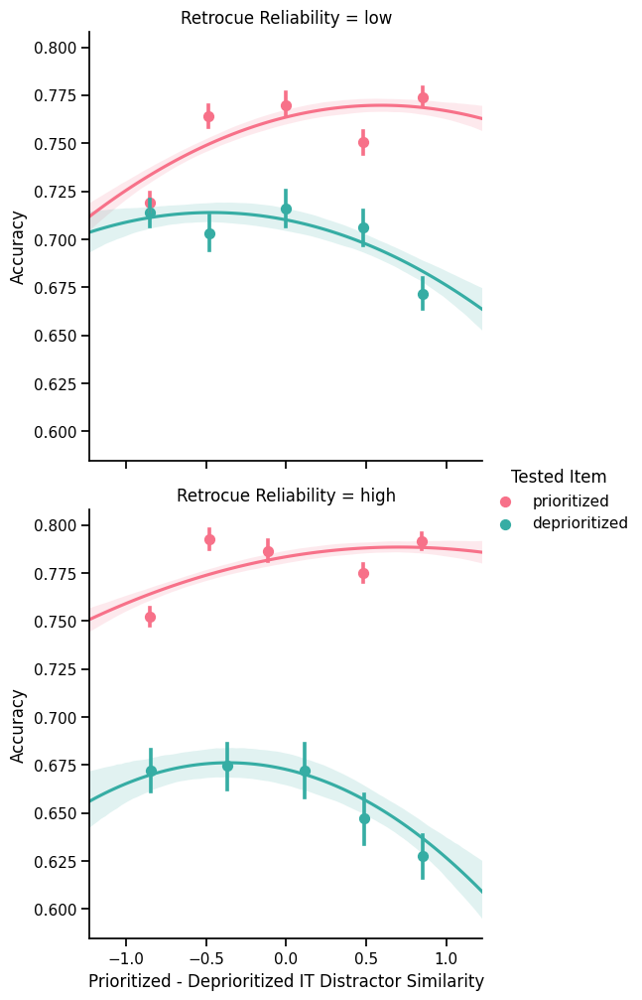

In [49]:

plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Prioritized - Deprioritized IT Distractor Similarity',
    y='Accuracy',
    row = 'Retrocue Reliability',
    hue = 'Tested Item',
    x_bins = 5,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)


<Figure size 1000x600 with 0 Axes>

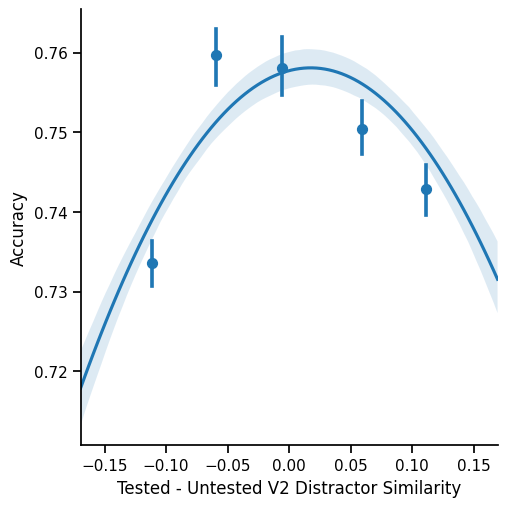

In [50]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    x_bins = 5,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

<Figure size 1000x600 with 0 Axes>

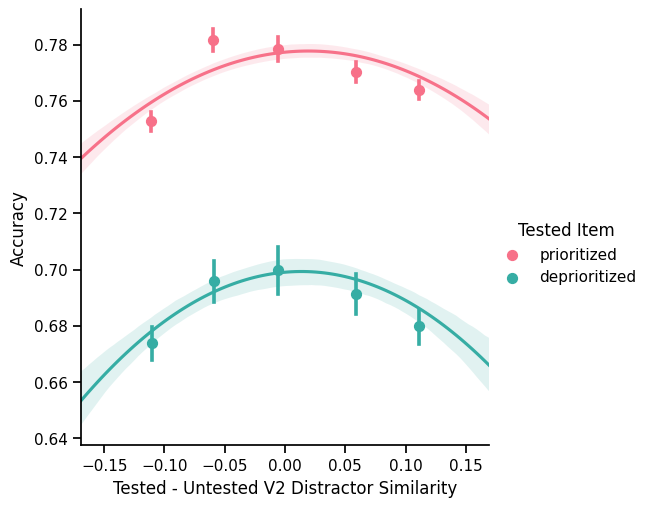

In [51]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue = 'Tested Item',
    x_bins = 5,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

<Figure size 1000x600 with 0 Axes>

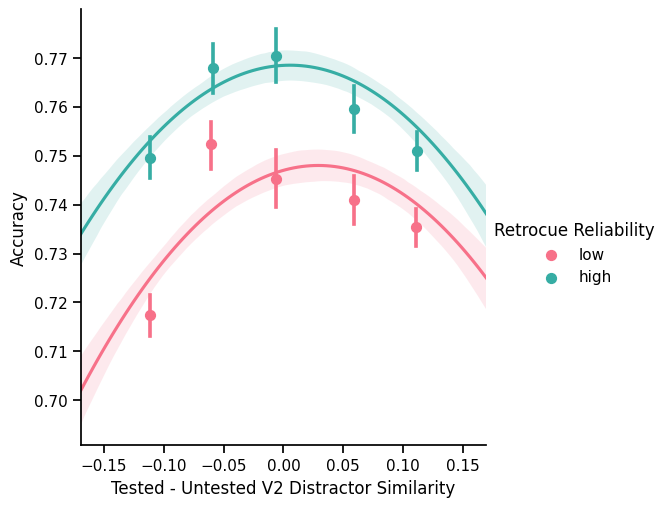

In [52]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue = 'Retrocue Reliability',
    x_bins = 5,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

<Figure size 1000x600 with 0 Axes>

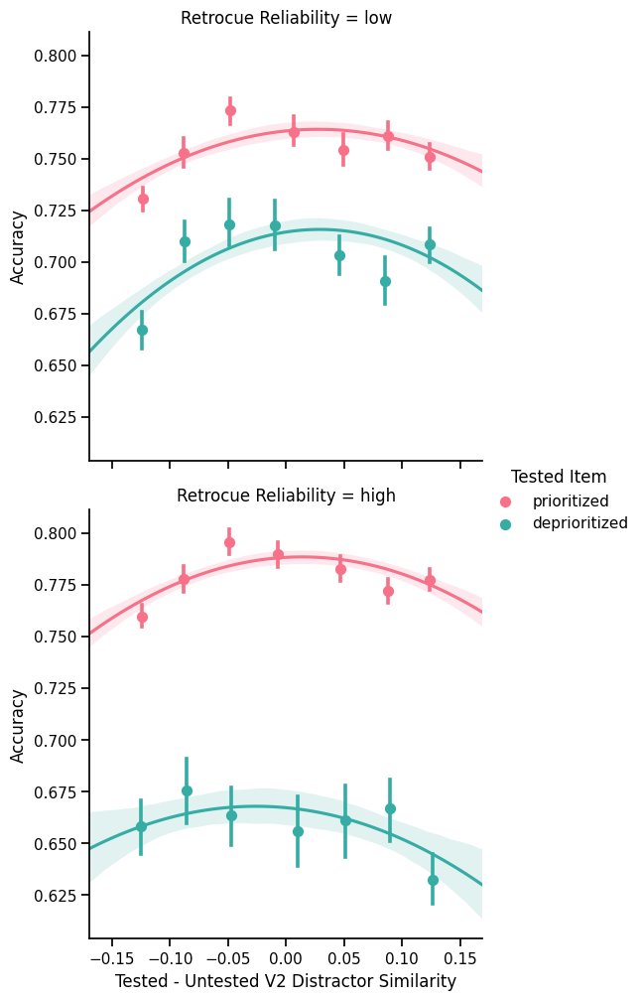

In [53]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    row = 'Retrocue Reliability',
    hue = 'Tested Item',
    x_bins = 7,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

In [54]:
df['Tested Item']

0          prioritized
1        deprioritized
2          prioritized
3        deprioritized
4          prioritized
             ...      
80995    deprioritized
80996      prioritized
80997    deprioritized
80998      prioritized
80999    deprioritized
Name: Tested Item, Length: 81000, dtype: object

<Figure size 1000x600 with 0 Axes>

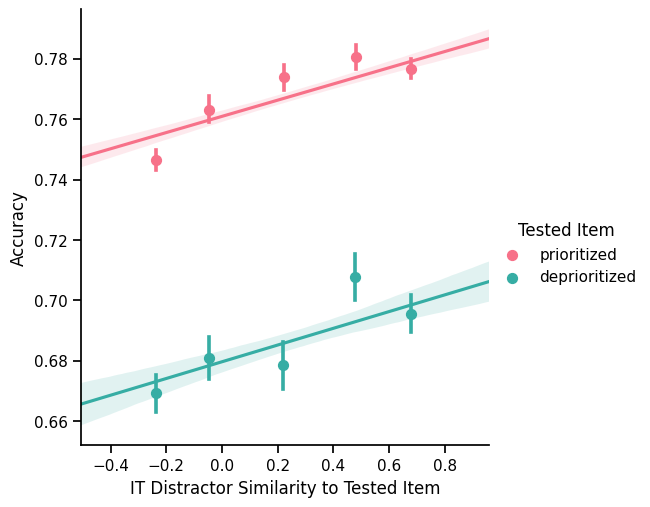

In [55]:
plt.figure(figsize=(10, 6))
sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='Accuracy',
#     row = 'Retrocue Reliability',
    hue = 'Tested Item',
    x_bins = 5,
    order = 1,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df
)

In [56]:
# df['Prioritized - Deprioritized V2 Distractor Similarity Distance Ranges'] = pd.cut(df['it_sim_dis_diff'], bins=5)
# df['Prioritized - Deprioritized IT Distractor Similarity Distance Ranges'] = pd.cut(df['v2_sim_dis_diff'], bins=5)
# df['IT Distractor Similarity to Prioritized Item Distance Ranges'] = pd.cut(df['it_sim_dis_attend'], bins=5)
# df['V2 Distractor Similarity to Prioritized Item Distance Ranges'] =  pd.cut(df['v2_sim_dis_attend'], bins=5)
# df['Tested - Untested V2 Distractor Similarity Distance Ranges'] = pd.cut(df['it_sim_dis_diff_test'], bins=5)
# df['Tested - Untested IT Distractor Similarity Distance Ranges'] = pd.cut(df['v2_sim_dis_diff_test'], bins=5)
# df['IT Distractor Similarity to Tested Item Distance Ranges'] = pd.cut(df['it_sim_dis_test'], bins=5)
# df['V2 Distractor Similarity to Tested Item Distance Ranges'] = pd.cut(df['v2_sim_dis_test'], bins=5)



In [57]:
# df_it_prior_pos = df[df['it_sim_dis_diff'] >= 0]
# df_it_prior_neg = df[df['it_sim_dis_diff'] < 0]
# df_v2_prior_pos = df[df['v2_sim_dis_diff'] >= 0]
# df_v2_prior_neg = df[df['v2_sim_dis_diff'] < 0]

# df_it_test_pos = df[df['it_sim_dis_diff_test'] >= 0]
# df_it_test_neg = df[df['it_sim_dis_diff_test'] < 0]
# df_v2_test_pos= df[df['v2_sim_dis_diff_test'] >= 0]
# df_v2_test_neg = df[df['v2_sim_dis_diff_test'] < 0]

# df_it_prior_pos['IT_diff_binned_pos'] = pd.qcut(df_it_prior_pos['it_sim_dis_diff'], 5, duplicates='drop')


In [58]:
df['it_pos_neg'] =  np.where(df['it_sim_dis_diff_test'] <= 0, 0, 1)
df['v2_pos_neg'] =  np.where(df['v2_sim_dis_diff_test'] <= 0, 0, 1)
df['it_pos_neg_abs'] =  np.where(df['it_sim_dis_test'] <= 0, 0, 1)
df['v2_pos_neg_abs'] =  np.where(df['v2_sim_dis_test'] <= 0, 0, 1)


In [59]:
len(df[df['it_pos_neg_abs'] == 0])

29549

In [60]:
len(df[df['it_pos_neg'] == 1])

40230

Text(0.5, 613.7083333333331, '')

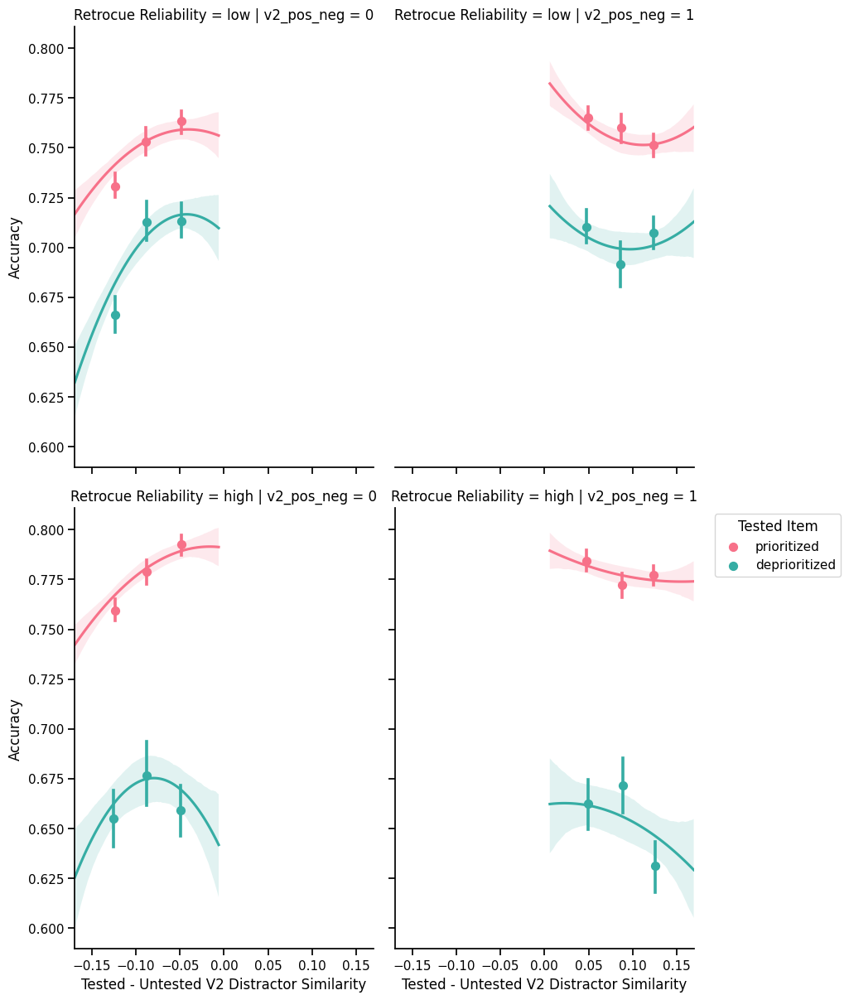

In [62]:
g = sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue='Tested Item',
    col='v2_pos_neg',
    row = 'Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    # facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df
)

g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
g.axes[0,1].set_xlabel('')

In [63]:
g = sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue='Tested Item',
    col='v2_pos_neg',
    row = 'Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df
)

# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
g.axes[1,1].yaxis.set_visible(False)
g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')

plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [64]:
sns.set_context('talk')
g = sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Accuracy',
    hue='Tested Item',
    col='it_pos_neg',
    row = 'Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df
)

g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
g.axes[0,1].set_xlabel('')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [65]:
g = sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Accuracy',
    hue='Tested Item',
    col='it_pos_neg',
    row = 'Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df
)

# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
g.axes[1,1].yaxis.set_visible(False)
g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')

plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [66]:
df_correct = df[df['resp_correct'] == 1]

In [67]:
df_correct = df[df['resp_correct'] == 1]
df_correct['Response Time'] = df_correct['analysis_rt']

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_13687/3838276257.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_correct['Response Time'] = df_correct['analysis_rt']


In [68]:
g = sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Response Time',
    hue='Tested Item',
    col='v2_pos_neg',
    # hue='Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=95,
    palette=palette[::-1],
    legend=False,
    data=df_correct
)

# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
# g.axes[1,1].yaxis.set_visible(False)
# g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
# g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')



plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [69]:
g = sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Response Time',
    # hue='Tested Item',
    # col='v2_pos_neg',
    # row='Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df_correct
)

# Remove y-axis and spine from right plots
# g.axes[0,1].yaxis.set_visible(False)
# g.axes[0,1].spines['left'].set_visible(False)
# g.axes[1,1].yaxis.set_visible(False)
# g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
# g.axes[0,1].set_xlabel('')
# g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')



plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

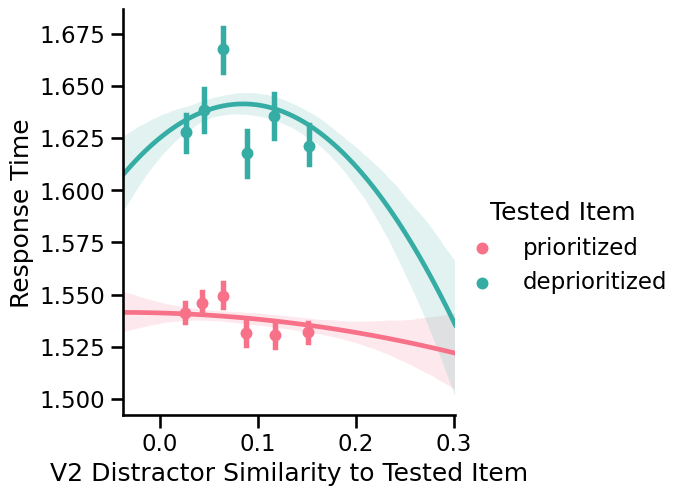

In [70]:
sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Response Time',
    hue = 'Tested Item',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)

In [71]:
g = sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='Tested Item',
    col='v2_pos_neg_abs',
    row='Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df
)
# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
g.axes[1,1].yaxis.set_visible(False)
g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')



plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
g.axes[0,1].set_xlabel('')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [73]:
g = sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='Tested Item',
    col='it_pos_neg_abs',
    row='Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df
)
# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
g.axes[1,1].yaxis.set_visible(False)
g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')



plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
g.axes[0,1].set_xlabel('')

TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [74]:
df_correct = df[df['resp_correct'] == 1]
df_correct['Response Time'] = df_correct['analysis_rt']

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_13687/3838276257.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_correct['Response Time'] = df_correct['analysis_rt']


In [75]:
g = sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Response Time',
    hue='Tested Item',
    col='v2_pos_neg_abs',
    row='Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df_correct
)
# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
g.axes[1,1].yaxis.set_visible(False)
g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')



plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
g.axes[0,1].set_xlabel('')



TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

In [76]:
g = sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='Response Time',
    hue='Tested Item',
    col='it_pos_neg_abs',
    row='Retrocue Reliability',
    x_bins=3,
    order=2,
    height=6,      
    aspect=0.7,   
    facet_kws={'sharex': False}, 
    ci=68,
    palette=palette[::-1],
    legend=False,
    data=df_correct
)
# Remove y-axis and spine from right plots
g.axes[0,1].yaxis.set_visible(False)
g.axes[0,1].spines['left'].set_visible(False)
g.axes[1,1].yaxis.set_visible(False)
g.axes[1,1].spines['left'].set_visible(False)

# Remove x-labels from right plots
g.axes[0,1].set_xlabel('')
g.axes[1,1].set_xlabel('')

# Remove column titles while keeping row titles
g.set_titles(col_template='', row_template='{row_name}')



plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')
g.axes[0,1].set_xlabel('')



TypeError: lmplot() got an unexpected keyword argument 'facet_kws'

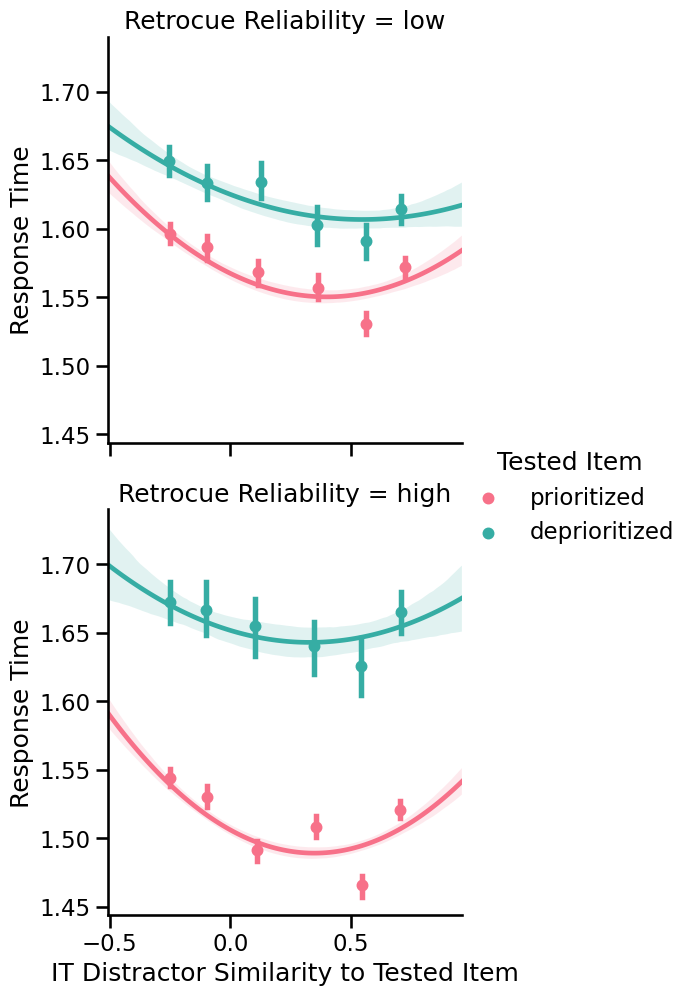

In [77]:
sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='Response Time',
    hue = 'Tested Item',
    row = 'Retrocue Reliability',
    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)

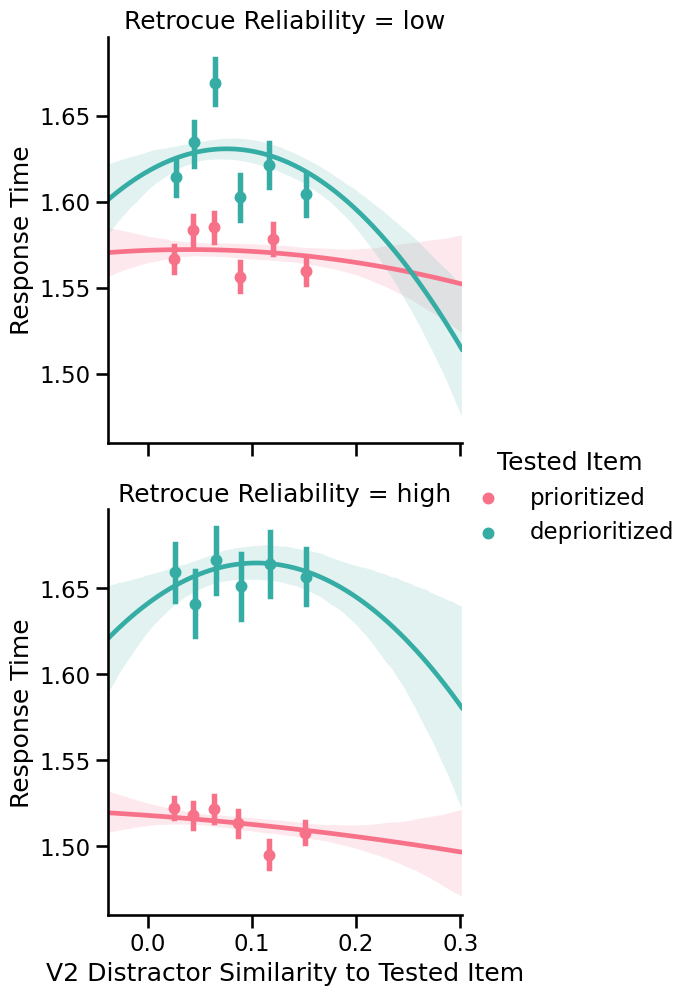

In [78]:
sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Response Time',
    hue = 'Tested Item',
    row = 'Retrocue Reliability',

    x_bins = 6,
    order = 2,
    ci = 68,
    palette = palette[::-1],  # Reverse the color order
    data=df_correct
)

In [79]:
df['tested_memorability_resmem_z'] = scaler.fit_transform(df[['tested_memorability_resmem']])

In [80]:
# df.to_csv('pilot_TOTAL_TEST.csv', index=False)  # Set index=False to avoid saving row indices


In [81]:
# scaler = StandardScaler()

# df['it_pos_neg_abs_z'] =  scaler.fit_transform(df[['it_pos_neg_abs']])
# df['v2_pos_neg_abs_z'] = scaler.fit_transform(df[['v2_pos_neg_abs']])
# df['it_pos_neg_z'] = scaler.fit_transform(df[['it_pos_neg']])
# df['v2_pos_neg_z'] = scaler.fit_transform(df[['v2_pos_neg']])

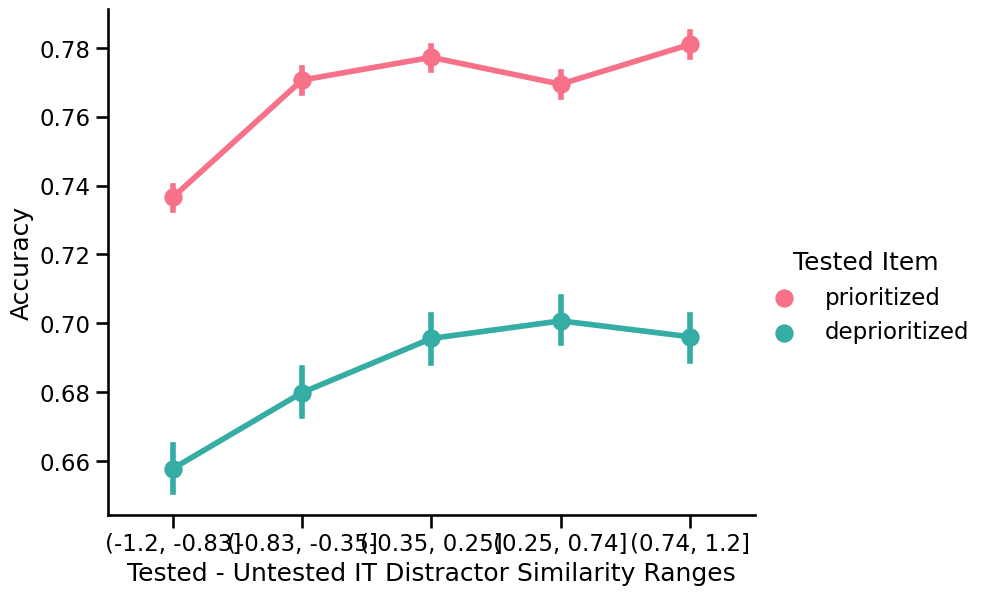

In [82]:

df['pilot_type'] = np.where(df['pilot_number'] == 1, 'new stimuli', 'old stimuli')

sns.catplot(
    data=df,
    x='Tested - Untested IT Distractor Similarity Ranges',
    y='Accuracy',
    hue='Tested Item',
#         col = 'pilot_type',

#     col='Retrocue Reliability',
#     col_order = ['low', 'high'],
    kind='point',
    ci=68,
    palette=palette[::-1],
    height=6,
    aspect=1.3
)

In [83]:
### instead of Prioritized-Deprioritized similarity on x axis, get (both relative and absolute)
# Similarity to Tested item and then split by prioritzed - x axis will be relative to tested/untested instead of prioritized/deprioritized

In [84]:
df['tested_memorability_resmem']

0        0.846955
1        0.707946
2        0.778179
3        0.826415
4        0.896562
           ...   
80995    0.923335
80996    0.807225
80997    0.913835
80998    0.872645
80999    0.873611
Name: tested_memorability_resmem, Length: 81000, dtype: float64

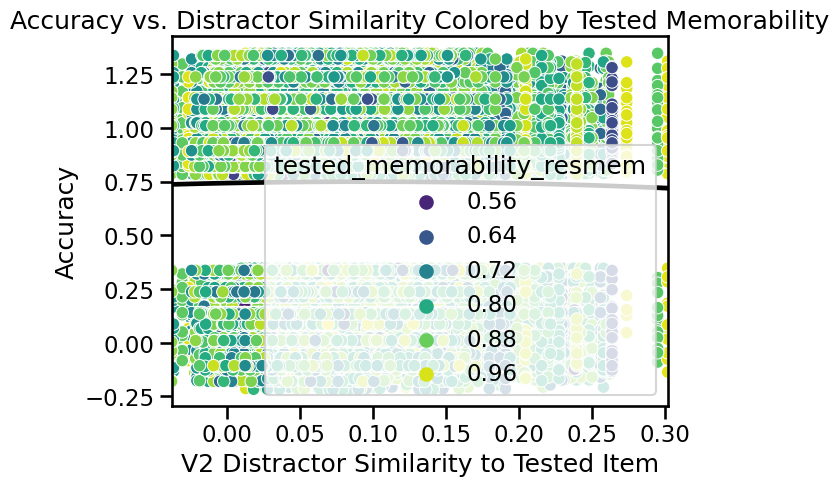

In [85]:
sns.scatterplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='tested_memorability_resmem',        # Numeric
    palette='viridis',               # Continuous colormap
    data=df
)

sns.regplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Accuracy',
    order=2,
    ci=68,
    scatter=False,                   # Don't re-draw points
    color='black',
    data=df
)

plt.title("Accuracy vs. Distractor Similarity Colored by Tested Memorability")
plt.show()

In [86]:
df['tested_memorability_binned'] = pd.qcut(df['tested_memorability_resmem'], q=3, 
                                           labels=['Low','Medium', 'High'])


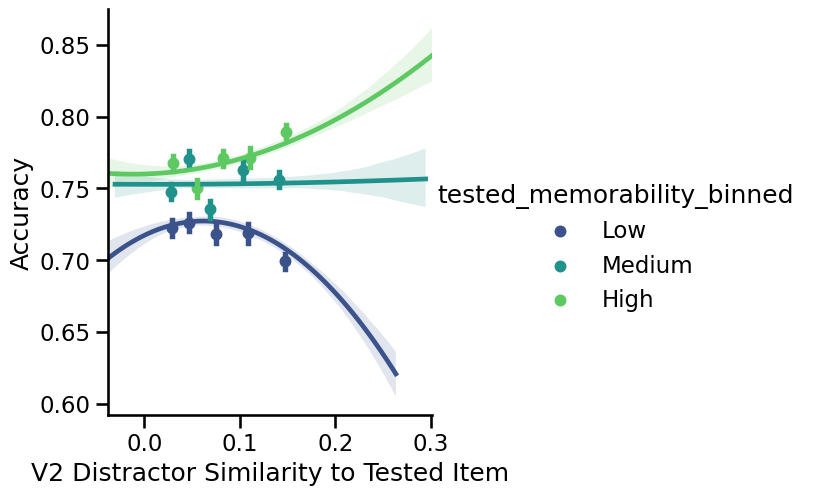

In [87]:
sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='tested_memorability_binned',  # Now it's categorical
    x_bins=5,
    order=2,
    ci=68,
    palette='viridis',
    data=df
)
plt.show()

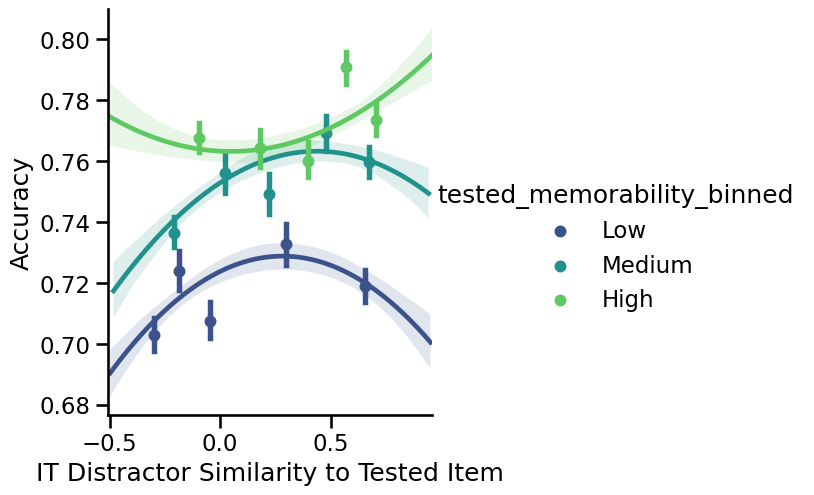

In [88]:
sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='Accuracy',
    hue='tested_memorability_binned',  # Now it's categorical
    x_bins=5,
    order=2,
    ci=68,
    palette='viridis',
    data=df
)
plt.show()

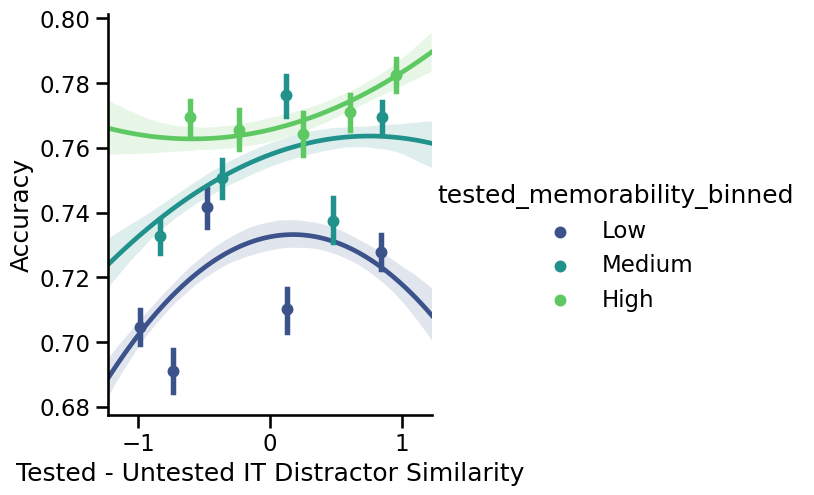

In [89]:
sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='Accuracy',
    hue='tested_memorability_binned',  # Now it's categorical
    x_bins=5,
    order=2,
    ci=68,
    palette='viridis',
    data=df
)
plt.show()

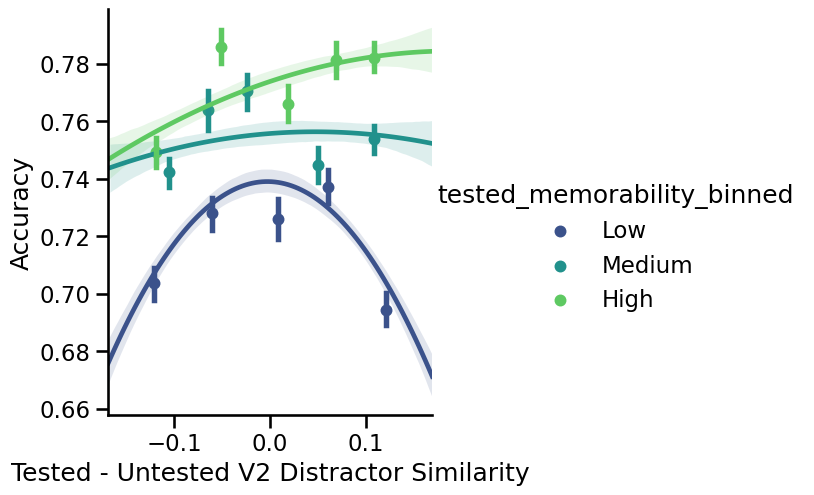

In [90]:
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='Accuracy',
    hue='tested_memorability_binned',  # Now it's categorical
    x_bins=5,
    order=2,
    ci=68,
    palette='viridis',
    data=df
)
plt.show()

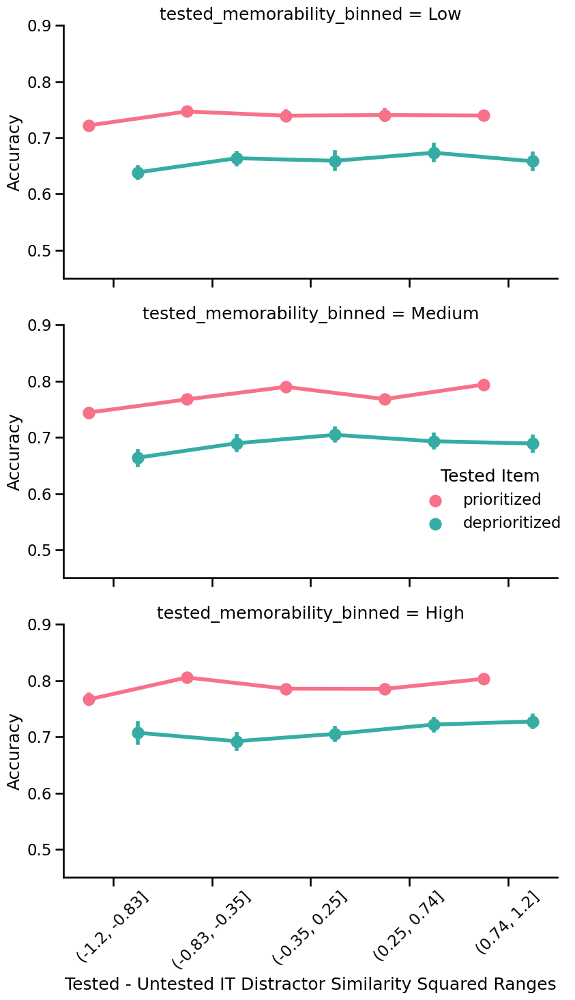

In [91]:

g = sns.catplot(
    x='Tested - Untested IT Distractor Similarity Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='tested_memorability_binned',  # Use 'row' instead of 'col'
    aspect=1.3,
#     row_order = ['low', 'high'],
    dodge=0.5,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.45, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Tested - Untested IT Distractor Similarity Squared Ranges", "Accuracy")
plt.tight_layout()
plt.show()

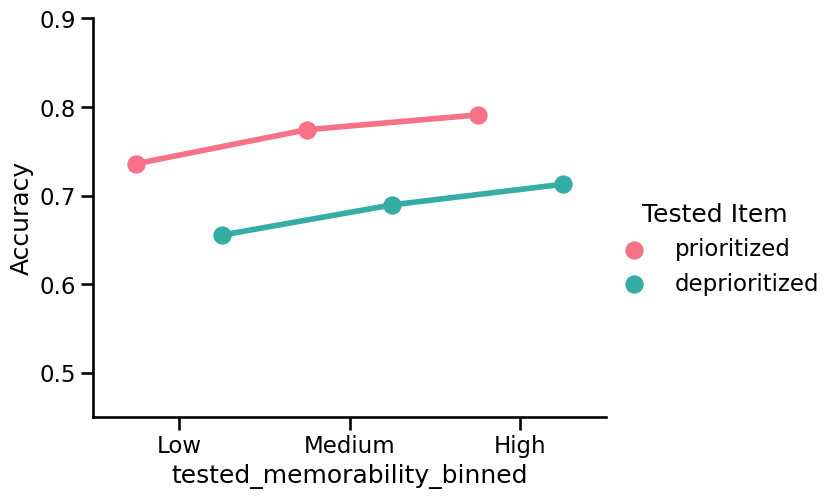

In [92]:
g = sns.catplot(
    x='tested_memorability_binned',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
#     row='Retrocue Reliability',
    aspect=1.3,
#     row_order = ['low', 'high'],
    dodge=0.5,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.45, 0.9))


In [93]:
df['Tested Item Memorability'] = df['tested_memorability_binned']

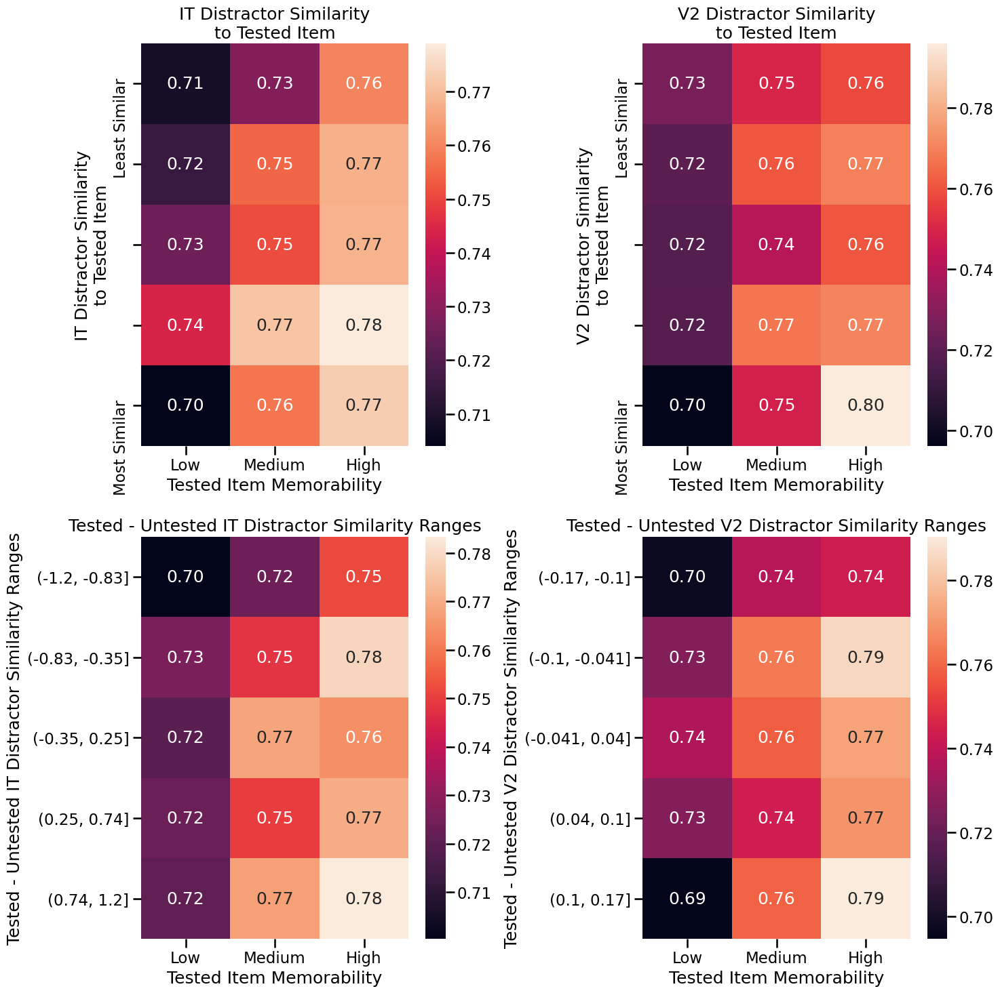

In [94]:
# Create a figure with 2x2 subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))

# List of similarity metrics
similarity_metrics = [
    'IT Distractor Similarity\nto Tested Item',
    'V2 Distractor Similarity\nto Tested Item',
    'Tested - Untested IT Distractor Similarity Ranges',
    'Tested - Untested V2 Distractor Similarity Ranges'
]

# Create heatmaps
axes = [ax1, ax2, ax3, ax4]
for ax, metric in zip(axes, similarity_metrics):
    # Create pivot table
    heatmap_data = df.pivot_table(
        values='Accuracy',
        index=metric,
        columns='Tested Item Memorability',
        aggfunc='mean'
    )
    
    # Create heatmap
    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt='.2f',
        #cmap='RdYlBu_r',
        ax=ax
    )
    
    # Set title
    ax.set_title(metric)

# Adjust layout
plt.tight_layout()
plt.show()

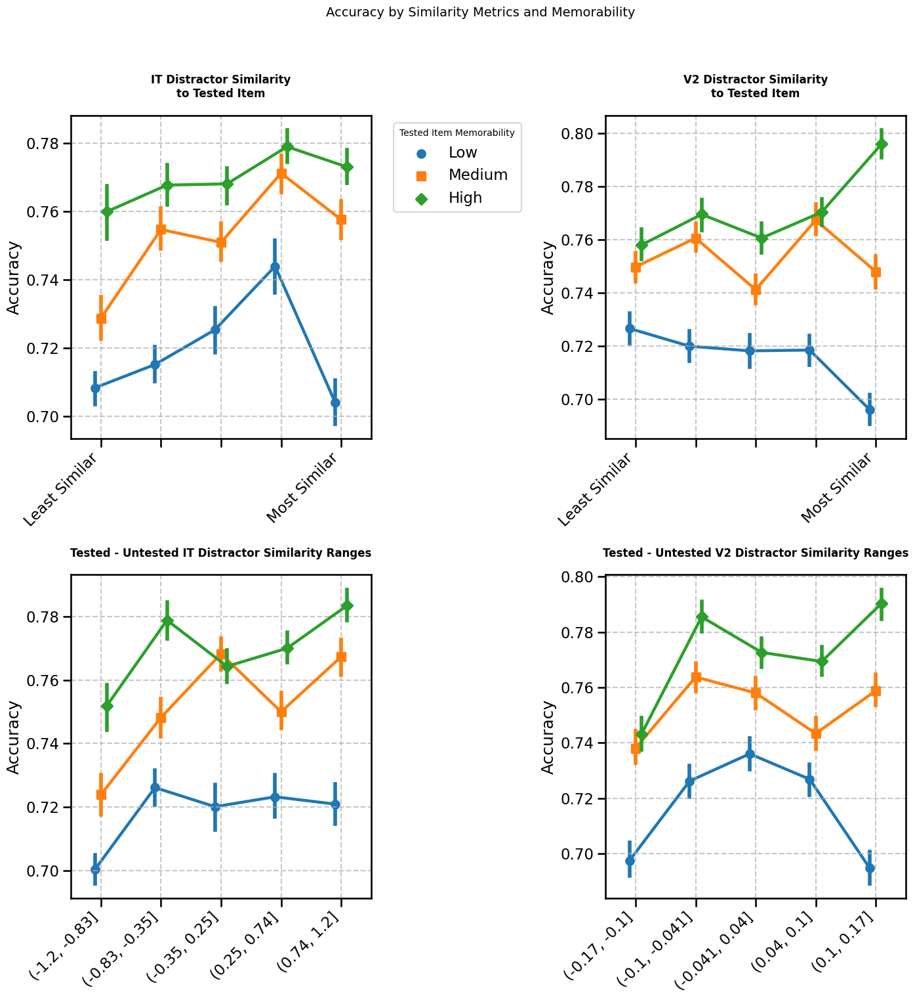

In [95]:
# Set figure size and create subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))

# List of similarity metrics
similarity_metrics = [
    'IT Distractor Similarity\nto Tested Item',
    'V2 Distractor Similarity\nto Tested Item',
    'Tested - Untested IT Distractor Similarity Ranges',
    'Tested - Untested V2 Distractor Similarity Ranges'
]

# Create point plots
axes = [ax1, ax2, ax3, ax4]
for ax, metric in zip(axes, similarity_metrics):
    sns.pointplot(
        x=metric,
        y='Accuracy',
        hue='Tested Item Memorability',
        data=df,
        dodge=0.2,
        ci=68,
        ax=ax,
        markers=['o', 's', 'D', '^', 'v'],  # Different markers for each category
        scale=0.8,  # Adjust point size
        #legend=False if ax != ax1 else True
    )
    
    # Customize each subplot
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(metric, pad=20, fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.set_xlabel('')  # Remove x-label as it's in the title
    
    # Remove legend if not the first plot
    if ax != ax1:
        ax.get_legend().remove()

# Move legend outside for first subplot
legend = ax1.legend(
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    title='Tested Item Memorability',
    title_fontsize=10,
    frameon=True
)

# Add main title
fig.suptitle('Accuracy by Similarity Metrics and Memorability', fontsize=14, y=1.02)

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Make room for legend
plt.show()

<Axes: xlabel='Tested Item Memorability', ylabel='Accuracy'>

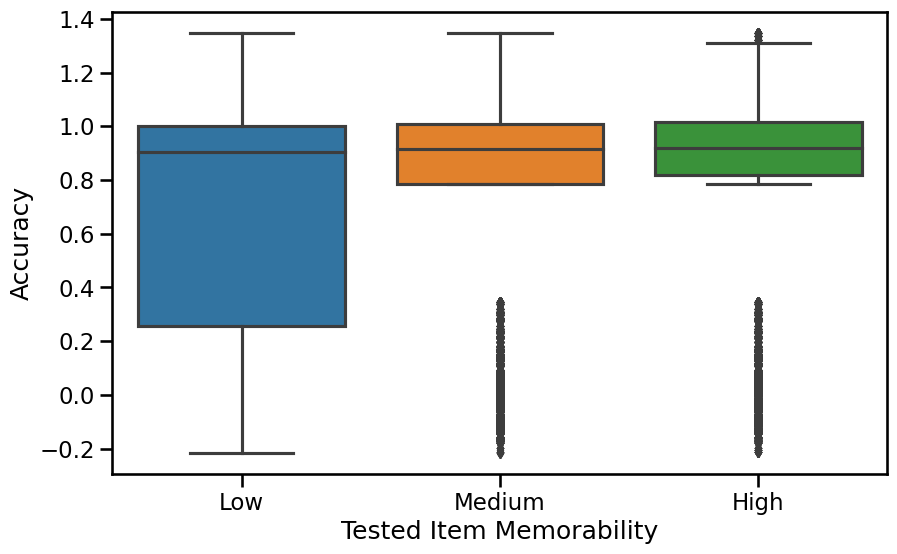

In [96]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='Tested Item Memorability',
    y='Accuracy',
    data=df
)

In [97]:
len(set(df['IT Distractor Similarity to Tested Item'].unique()))

1200

## counts = df['Tested Item Memorability - Distance split'].value_counts()
# plt.figure(figsize=(10, 10))
# plt.pie(counts, labels=counts.index, autopct='%1.1f%%')
# plt.title('Distribution of Items Across Memorability Bins')

In [98]:
# # Create a figure with 2x2 subplots
# fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))

# # List of similarity metrics
# similarity_metrics = [
#     'IT Distractor Similarity\nto Tested Item',
#     'V2 Distractor Similarity\nto Tested Item',
#     'Tested - Untested IT Distractor Similarity Ranges',
#     'Tested - Untested V2 Distractor Similarity Ranges'
# ]

# # Create heatmaps
# axes = [ax1, ax2, ax3, ax4]
# for ax, metric in zip(axes, similarity_metrics):
#     # Create pivot table
#     heatmap_data = df.pivot_table(
#         values='Accuracy',
#         index=metric,
#         columns='Tested Item Memorability - Distance split',
#         aggfunc='mean'
#     )
    
#     # Create heatmap
#     sns.heatmap(
#         heatmap_data,
#         annot=True,
#         fmt='.2f',
#         #cmap='RdYlBu_r',
#         ax=ax
#     )
    
#     # Set title
#     ax.set_title(metric)

# # Adjust layout
# plt.tight_layout()
# plt.show()

In [99]:
# fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))

# # List of similarity metrics
# similarity_metrics = [
#     'IT Distractor Similarity\nto Tested Item',
#     'V2 Distractor Similarity\nto Tested Item',
#     'Tested - Untested IT Distractor Similarity Ranges',
#     'Tested - Untested V2 Distractor Similarity Ranges'
# ]

# # Create point plots
# axes = [ax1, ax2, ax3, ax4]
# for ax, metric in zip(axes, similarity_metrics):
#     sns.pointplot(
#         x=metric,
#         y='Accuracy',
#         hue='Tested Item Memorability - Distance split',

#         data=df,
#         dodge=0.2,
#         ci=68,
#         ax=ax,
#         markers=['o', 's', 'D', '^', 'v'],  # Different markers for each category
#         scale=0.8,  # Adjust point size
#         #legend=False if ax != ax1 else True
#     )
    
#     # Customize each subplot
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
#     ax.set_title(metric, pad=20, fontsize=12, fontweight='bold')
#     ax.grid(True, linestyle='--', alpha=0.7)
#     ax.set_xlabel('')  # Remove x-label as it's in the title
    
#     # Remove legend if not the first plot
#     if ax != ax1:
#         ax.get_legend().remove()

# # Move legend outside for first subplot
# legend = ax1.legend(
#     bbox_to_anchor=(1.05, 1),
#     loc='upper left',
#     title='Tested Item Memorability - Distance Split',
#     title_fontsize=10,
#     frameon=True
# )

# # Add main title
# fig.suptitle('Accuracy by Similarity Metrics and Memorability', fontsize=14, y=1.02)

# # Adjust layout
# plt.tight_layout(rect=[0, 0, 0.95, 1])  # Make room for legend
# plt.show()

In [100]:

# from mpl_toolkits.mplot3d import Axes3D

# fig = plt.figure(figsize=(20, 10))

# ax1 = fig.add_subplot(121, projection='3d')
# scatter = ax1.scatter(df['V2 Distractor Similarity to Tested Item'],
#                      df['tested_memorability_resmem'],
#                      df['Accuracy'],
#                      c=df['tested_memorability_resmem'],
#                      cmap='viridis',
#                      s=50)
# ax1.set_xlabel('Distractor Similarity')
# ax1.set_ylabel('Memorability')
# ax1.set_zlabel('Accuracy')
# ax1.set_title('3D Scatter Plot with Memorability Color Gradient')
# plt.colorbar(scatter, label='Memorability')

# ax2 = fig.add_subplot(122, projection='3d')

# x = np.linspace(df['V2 Distractor Similarity to Tested Item'].min(), 
#                 df['V2 Distractor Similarity to Tested Item'].max(), 20)
# y = np.linspace(df['tested_memorability_resmem'].min(), 
#                 df['tested_memorability_resmem'].max(), 20)
# X, Y = np.meshgrid(x, y)

# from sklearn.preprocessing import PolynomialFeatures
# from sklearn.linear_model import LinearRegression

# X_train = df[['V2 Distractor Similarity to Tested Item', 'tested_memorability']]
# y_train = df['Accuracy']

# poly = PolynomialFeatures(degree=2)
# X_poly = poly.fit_transform(X_train)

# model = LinearRegression()
# model.fit(X_poly, y_train)

# X_pred = np.column_stack((X.ravel(), Y.ravel()))
# X_pred_poly = poly.transform(X_pred)
# Z = model.predict(X_pred_poly).reshape(X.shape)

# surf = ax2.plot_surface(X, Y, Z, cmap='viridis',
#                        linewidth=0, antialiased=True)
# ax2.set_xlabel('Distractor Similarity')
# ax2.set_ylabel('Memorability')
# ax2.set_zlabel('Accuracy')
# ax2.set_title('3D Surface Plot of Accuracy Prediction')
# plt.colorbar(surf, label='Predicted Accuracy')

# plt.tight_layout()

# import plotly.express as px
# import plotly.graph_objects as go

# fig_plotly = go.Figure(data=[go.Scatter3d(
#     x=df['V2 Distractor Similarity to Tested Item'],
#     y=df['tested_memorability_resmem'],
#     z=df['Accuracy'],
#     mode='markers',
#     marker=dict(
#         size=6,
#         color=df['tested_memorability_resmem'],
#         colorscale='Viridis',
#         opacity=0.8
#     )
# )])

# fig_plotly.update_layout(
#     title='Interactive 3D Scatter Plot',
#     scene=dict(
#         xaxis_title='Distractor Similarity',
#         yaxis_title='Memorability',
#         zaxis_title='Accuracy'
#     ),
#     width=800,
#     height=800
# )



In [101]:
# import plotly.express as px
# import plotly.graph_objects as go
# from sklearn.preprocessing import StandardScaler

# df_scaled = df.copy()
# columns_to_scale = ['V2 Distractor Similarity to Tested Item', 'tested_memorability_resmem', 'Accuracy']
# df_scaled[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

# fig = go.Figure()

# fig.add_trace(go.Scatter3d(
#     x=df['V2 Distractor Similarity to Tested Item'],
#     y=df['tested_memorability_resmem'],
#     z=df['Accuracy'],
#     mode='markers',
#     marker=dict(
#         size=4,
#         color=df['tested_memorability_resmem'],
#         colorscale='Viridis',
#         opacity=0.8,
#         colorbar=dict(
#             title='Memorability',
#             thickness=20,
#             len=0.75,
#             x=0.95
#         )
#     ),
#     hovertemplate=
#     '<b>Distractor Similarity:</b> %{x:.2f}<br>' +
#     '<b>Memorability:</b> %{y:.2f}<br>' +
#     '<b>Accuracy:</b> %{z:.2f}<br>' +
#     '<extra></extra>'  
# ))

# x_range = np.linspace(df['V2 Distractor Similarity to Tested Item'].min(), 
#                      df['V2 Distractor Similarity to Tested Item'].max(), 50)
# y_range = np.linspace(df['tested_memorability_resmem'].min(), 
#                      df['tested_memorability_resmem'].max(), 50)
# x_mesh, y_mesh = np.meshgrid(x_range, y_range)

# from sklearn.preprocessing import PolynomialFeatures
# from sklearn.linear_model import LinearRegression
# from sklearn.pipeline import Pipeline

# model = Pipeline([
#     ('poly', PolynomialFeatures(degree=2)),
#     ('linear', LinearRegression())
# ])

# X = df[['V2 Distractor Similarity to Tested Item', 'tested_memorability_resmem']]
# y = df['Accuracy']
# model.fit(X, y)

# X_pred = np.vstack([x_mesh.ravel(), y_mesh.ravel()]).T
# z_mesh = model.predict(X_pred).reshape(x_mesh.shape)

# fig.add_trace(go.Surface(
#     x=x_range,
#     y=y_range,
#     z=z_mesh,
#     opacity=0.3,
#     colorscale='Viridis',
#     showscale=False,
#     hoverinfo='skip'
# ))

# fig.update_layout(
#     title=dict(
#         text='Memory Performance Analysis',
#         x=0.5,
#         y=0.95,
#         font=dict(size=24)
#     ),
#     scene=dict(
#         xaxis_title=dict(
#             text='Distractor Similarity',
#             font=dict(size=14)
#         ),
#         yaxis_title=dict(
#             text='Memorability',
#             font=dict(size=14)
#         ),
#         zaxis_title=dict(
#             text='Accuracy',
#             font=dict(size=14)
#         ),
#         camera=dict(
#             up=dict(x=0, y=0, z=1),
#             center=dict(x=0, y=0, z=0),
#             eye=dict(x=1.5, y=1.5, z=1.5)
#         ),
#         aspectmode='cube'
#     ),
#     template='plotly_white',
#     showlegend=False,
#     width=900,
#     height=700,
#     margin=dict(l=0, r=0, t=30, b=0)
# )

# fig.update_layout(
#     updatemenus=[
#         dict(
#             type='buttons',
#             showactive=False,
#             buttons=[
#                 dict(
#                     label='Top View',
#                     method='relayout',
#                     args=['scene.camera', dict(
#                         up=dict(x=0, y=0, z=1),
#                         center=dict(x=0, y=0, z=0),
#                         eye=dict(x=0, y=0, z=2)
#                     )]
#                 ),
#                 dict(
#                     label='Side View',
#                     method='relayout',
#                     args=['scene.camera', dict(
#                         up=dict(x=0, y=0, z=1),
#                         center=dict(x=0, y=0, z=0),
#                         eye=dict(x=2, y=0, z=0)
#                     )]
#                 ),
#                 dict(
#                     label='Isometric',
#                     method='relayout',
#                     args=['scene.camera', dict(
#                         up=dict(x=0, y=0, z=1),
#                         center=dict(x=0, y=0, z=0),
#                         eye=dict(x=1.5, y=1.5, z=1.5)
#                     )]
#                 )
#             ],
#             x=0.1,
#             y=1.1,
#             xanchor='left',
#             yanchor='top'
#         )
#     ]
# )

# fig.show()

In [102]:

# plt.figure(figsize=(10, 6))
# sns.lmplot(
#     x='vviq_sum',
#     y='Accuracy',
#     x_bins = 6,
#     order = 2,
#     ci = 68,
#     palette = palette[::-1],  # Reverse the color order
#     data=df
# )

# plt.show()

In [103]:

# plt.figure(figsize=(10, 6))
# sns.lmplot(
#     x='vviq_sum',
#     y='resp_correct',
#     x_bins = 6,
#     order = 2,
#     ci = 68,
#     palette = palette[::-1],  # Reverse the color order
#     data=df
# )

# plt.show()

In [104]:

# plt.figure(figsize=(10, 6))
# sns.lmplot(
#     x='vviq_sum',
#     y='rt',
#     x_bins = 6,
#     order = 2,
#     ci = 68,
#     palette = palette[::-1],  # Reverse the color order
#     data=df_correct
# )

# plt.show()

In [105]:
# participant_vviq = df.groupby('participant')['vviq_sum'].first().reset_index()

# # Create a count of participants for each vviq_sum value
# vviq_counts = participant_vviq['vviq_sum'].value_counts().sort_index().reset_index()
# vviq_counts.columns = ['vviq_sum', 'participant_count']

# # Plot the distribution
# plt.figure(figsize=(12, 6))
# sns.barplot(data=vviq_counts, x='vviq_sum', y='participant_count')

# # Add labels and title
# plt.title('Number of Participants by VVIQ Sum Score')
# plt.xlabel('VVIQ Sum')
# plt.ylabel('Number of Participants')
# plt.grid(axis='y', alpha=0.3)

# # Add value labels on top of each bar
# for i, count in enumerate(vviq_counts['participant_count']):
#     plt.text(i, count + 0.1, str(count), ha='center')

# plt.tight_layout()
# plt.show()


In [106]:

# # Alternative: Create a histogram with integer bins
# plt.figure(figsize=(12, 6))
# sns.histplot(data=participant_vviq, x='vviq_sum', discrete=True, shrink=0.8)

# plt.title('Distribution of Participants by VVIQ Sum Score')
# plt.xlabel('VVIQ Sum')
# plt.ylabel('Number of Participants')
# plt.grid(axis='y', alpha=0.3)
# plt.xticks(range(int(participant_vviq['vviq_sum'].min()), 
#                 int(participant_vviq['vviq_sum'].max()) + 1))
# plt.tight_layout()
# plt.show()

In [107]:
# vviq_counts

In [108]:
df['Accuracy'].head(5000)

0       1.046728
1       0.046728
2       1.046728
3       1.046728
4       0.046728
          ...   
4995    0.883395
4996    0.883395
4997    0.883395
4998   -0.116605
4999    0.883395
Name: Accuracy, Length: 5000, dtype: float64

In [109]:
#test_item = 'img1'
#attend
#validity
# img1 = './stimuli/156_2.jpg', ping_img
#Image1 = '156_2.jpg'
#left_img, right_img
#stim_side is what left and right depend on
#attend_direction = 'left'

#mem_stim the tested item
#distractor_stim one of the two initial images that was not tested
#distractor_3 = './stimuli/distractors/can_opener_06s.jpg'
#distractor_3_type = 'im2_distractor'

In [110]:
df['mouse.clicked_name']

0             ["memoranda_stim"]
1        ["distractor_mem_stim"]
2             ["memoranda_stim"]
3             ["memoranda_stim"]
4                             []
                  ...           
80995         ["memoranda_stim"]
80996         ["memoranda_stim"]
80997        ["distractor_im_1"]
80998         ["memoranda_stim"]
80999    ["distractor_mem_stim"]
Name: mouse.clicked_name, Length: 81000, dtype: object

In [111]:
df_incorrect = df[~df['mouse.clicked_name'].apply(lambda x: "memoranda_stim" in x)]
df_wth = df_incorrect[df_incorrect['resp_correct'] == 1]
df_wth['mouse.clicked_name']

602                        ["distractor_im_1"]
1400                   ["distractor_mem_stim"]
1617                                        []
1832                                        []
1940                                        []
                         ...                  
77544    ["distractor_im_2","distractor_im_3"]
78023                                       []
78630                                       []
79224                      ["distractor_im_0"]
79664                      ["distractor_im_1"]
Name: mouse.clicked_name, Length: 250, dtype: object

In [112]:
df_wth = df_incorrect[df_incorrect['resp_correct'] == 1]
df_wth

,setup_js.started,setup_js.stopped,participant,date,expName,psychopyVersion,OS,frameRate,Instructions1.started,Instructions1.stopped,...,V2_diff_binned_test_sq,Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges,Prioritized - Deprioritized IT Distractor Similarity Squared Ranges,Tested - Untested V2 Distractor Similarity Squared Ranges,Tested - Untested IT Distractor Similarity Squared Ranges,it_pos_neg_abs,v2_pos_neg_abs,pilot_type,tested_memorability_binned,Tested Item Memorability
602,NaN,NaN,148645,2024-10-09 20:06:55.634,WM_Deepgen,2024.1.5,MacIntel,60.240964,NaN,NaN,...,"(0.018, 0.029]","(0.018, 0.029]","(0.11, 0.31]","(0.018, 0.029]","(0.11, 0.31]",1,1,new stimuli,Low,Low
1400,NaN,NaN,151819,2024-10-24 12:31:37.936,WM_Deepgen,2023.2.1,MacIntel,60.002400,NaN,NaN,...,"(0.0016, 0.0052]","(0.0016, 0.0052]","(0.31, 0.6]","(0.0016, 0.0052]","(0.31, 0.6]",0,1,new stimuli,High,High
1617,NaN,NaN,156973,2024-10-18 19:27:57.801,WM_Deepgen,2023.2.1,MacIntel,57.803468,NaN,NaN,...,"(-0.00096, 0.0016]","(-0.00096, 0.0016]","(0.11, 0.31]","(-0.00096, 0.0016]","(0.11, 0.31]",1,1,new stimuli,High,High
1832,NaN,NaN,144751,2024-10-16 22:10:33.164,WM_Deepgen,2023.2.1,Win32,60.024010,NaN,NaN,...,"(0.0052, 0.011]","(0.0052, 0.011]","(0.011, 0.11]","(0.0052, 0.011]","(0.011, 0.11]",0,1,new stimuli,Low,Low
1940,NaN,NaN,144751,2024-10-16 22:10:33.164,WM_Deepgen,2023.2.1,Win32,60.024010,NaN,NaN,...,"(0.011, 0.018]","(0.011, 0.018]","(0.6, 1.0]","(0.011, 0.018]","(0.6, 1.0]",0,1,new stimuli,Medium,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77544,NaN,NaN,152644,2025-01-28 12:04:45.535,WM_Deepgen,2023.2.1,MacIntel,59.880240,NaN,NaN,...,"(0.011, 0.018]","(0.011, 0.018]","(0.011, 0.11]","(0.011, 0.018]","(0.011, 0.11]",1,1,old stimuli,Medium,Medium
78023,NaN,NaN,154567,2025-01-21 15:44:36.194,WM_Deepgen,2023.2.1,MacIntel,56.179775,NaN,NaN,...,"(-0.00096, 0.0016]","(-0.00096, 0.0016]","(1.0, 1.5]","(-0.00096, 0.0016]","(1.0, 1.5]",1,1,old stimuli,Low,Low
78630,NaN,NaN,168988,2024-12-02 13:12:25.741,WM_Deepgen,2023.2.1,MacIntel,45.454545,NaN,NaN,...,"(0.0052, 0.011]","(0.0052, 0.011]","(0.6, 1.0]","(0.0052, 0.011]","(0.6, 1.0]",0,1,old stimuli,Low,Low
79224,NaN,NaN,145672,2024-11-26 19:56:28.633,WM_Deepgen,2023.2.1,MacIntel,60.240964,NaN,NaN,...,"(0.0052, 0.011]","(0.0052, 0.011]","(0.6, 1.0]","(0.0052, 0.011]","(0.6, 1.0]",0,1,old stimuli,Low,Low


In [113]:
df_wth.to_csv('unexpected_results.csv', index=False)

In [114]:
# Count unexpected cases where response is marked correct but memoranda_stim wasn't clicked
unexpected_count = len(df[(df['resp_correct'] == 1) & 
                         (~df['mouse.clicked_name'].apply(lambda x: "memoranda_stim" in x))])

print(f"Number of unexpected cases (resp_correct=1 but memoranda_stim not clicked): {unexpected_count}")

# Calculate percentage of all trials
total_trials = len(df)
percentage = (unexpected_count / total_trials) * 100
print(f"This represents {percentage:.2f}% of all trials")

# Show a few examples if any exist
if unexpected_count > 0:
    print("\nExample cases:")
    unexpected_cases = df[(df['resp_correct'] == 1) & 
                         (~df['mouse.clicked_name'].apply(lambda x: "memoranda_stim" in x))]
    print(unexpected_cases[['mouse.clicked_name', 'resp_correct']].head(5))

Number of unexpected cases (resp_correct=1 but memoranda_stim not clicked): 250
This represents 0.31% of all trials

Example cases:
           mouse.clicked_name  resp_correct
602       ["distractor_im_1"]           1.0
1400  ["distractor_mem_stim"]           1.0
1617                       []           1.0
1832                       []           1.0
1940                       []           1.0


In [115]:
df_cleaned = df[df['mouse.clicked_name'].astype(str).apply(lambda x: x != '[]')]
df_cleaned

,setup_js.started,setup_js.stopped,participant,date,expName,psychopyVersion,OS,frameRate,Instructions1.started,Instructions1.stopped,...,V2_diff_binned_test_sq,Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges,Prioritized - Deprioritized IT Distractor Similarity Squared Ranges,Tested - Untested V2 Distractor Similarity Squared Ranges,Tested - Untested IT Distractor Similarity Squared Ranges,it_pos_neg_abs,v2_pos_neg_abs,pilot_type,tested_memorability_binned,Tested Item Memorability
0,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,"(0.0016, 0.0052]","(0.0016, 0.0052]","(1.0, 1.5]","(0.0016, 0.0052]","(1.0, 1.5]",1,1,new stimuli,Medium,Medium
1,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,"(0.0016, 0.0052]","(0.0016, 0.0052]","(0.6, 1.0]","(0.0016, 0.0052]","(0.6, 1.0]",0,1,new stimuli,Low,Low
2,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,"(0.018, 0.029]","(0.018, 0.029]","(0.11, 0.31]","(0.018, 0.029]","(0.11, 0.31]",0,1,new stimuli,Low,Low
3,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,"(0.011, 0.018]","(0.011, 0.018]","(1.0, 1.5]","(0.011, 0.018]","(1.0, 1.5]",1,1,new stimuli,Medium,Medium
5,NaN,NaN,157210,2024-10-18 18:29:32.464,WM_Deepgen,2023.2.1,MacIntel,29.94012,NaN,NaN,...,"(0.0016, 0.0052]","(0.0016, 0.0052]","(0.011, 0.11]","(0.0016, 0.0052]","(0.011, 0.11]",1,1,new stimuli,High,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80995,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,"(0.0052, 0.011]","(0.0052, 0.011]","(1.0, 1.5]","(0.0052, 0.011]","(1.0, 1.5]",1,1,old stimuli,High,High
80996,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,"(0.011, 0.018]","(0.011, 0.018]","(0.011, 0.11]","(0.011, 0.018]","(0.011, 0.11]",1,1,old stimuli,Medium,Medium
80997,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,"(0.0016, 0.0052]","(0.0016, 0.0052]","(1.0, 1.5]","(0.0016, 0.0052]","(1.0, 1.5]",0,1,old stimuli,High,High
80998,NaN,NaN,167431,2024-11-24 14:54:08.781,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,"(0.011, 0.018]","(0.011, 0.018]","(0.011, 0.11]","(0.011, 0.018]","(0.011, 0.11]",1,1,old stimuli,Medium,Medium


In [116]:

df_cleaned = df_cleaned[df_cleaned['resp_correct'] != 1]

# Check the results
original_count = len(df)
cleaned_count = len(df_cleaned)
removed_count = original_count - cleaned_count

print(f"Original DataFrame: {original_count} rows")
print(f"Cleaned DataFrame: {cleaned_count} rows")
print(f"Removed {removed_count} rows ({(removed_count/original_count)*100:.2f}% of data)")

# Optional: Reset the index of the cleaned DataFrame
df_cleaned = df_cleaned.reset_index(drop=True)

Original DataFrame: 81000 rows
Cleaned DataFrame: 17401 rows
Removed 63599 rows (78.52% of data)


In [117]:
# df_cleaned['last_clicked'].unique()

In [118]:
# Create a more robust function to extract the last entry
def get_last_entry(x):
    # If it's a string representation of a list like "['memoranda_stim']"
    if isinstance(x, str) and x.startswith('[') and x.endswith(']'):
        try:
            # Try to evaluate the string as a Python list
            import ast
            parsed_list = ast.literal_eval(x)
            if isinstance(parsed_list, list) and len(parsed_list) > 0:
                return parsed_list[-1]
        except:
            pass
    
    # If it's already a list
    if isinstance(x, list) and len(x) > 0:
        return x[-1]
    
   
    return None

df_cleaned['last_clicked'] = df_cleaned['mouse.clicked_name'].apply(get_last_entry)

# Check for empty entries
empty_count = df_cleaned['last_clicked'].isna().sum()
print(f"Number of rows with empty last_clicked: {empty_count}")

# Check for memoranda_stim as last click
mem_stim_count = (df_cleaned['last_clicked'] == "memoranda_stim").sum()
print(f"Number of rows where last click was memoranda_stim: {mem_stim_count}")

# Check for rows where resp_correct is 1
correct_count = (df_cleaned['resp_correct'] == 1).sum()
print(f"Number of rows where resp_correct is 1: {correct_count}")

# Analyze cases where last click is memoranda_stim but resp_correct is not 1
inconsistent_mem = df_cleaned[(df_cleaned['last_clicked'] == "memoranda_stim") & (df_cleaned['resp_correct'] != 1)]
print(f"Number of rows where last click was memoranda_stim but resp_correct != 1: {len(inconsistent_mem)}")

# Analyze cases where last click is not memoranda_stim but resp_correct is 1
inconsistent_non_mem = df_cleaned[(df_cleaned['last_clicked'] != "memoranda_stim") & (df_cleaned['resp_correct'] == 1)]
print(f"Number of rows where last click was NOT memoranda_stim but resp_correct = 1: {len(inconsistent_non_mem)}")

# Display a few examples of each inconsistent case if they exist
if len(inconsistent_mem) > 0:
    print("\nExamples where last click was memoranda_stim but resp_correct != 1:")
    print(inconsistent_mem[['mouse.clicked_name', 'last_clicked', 'resp_correct']].head(3))

if len(inconsistent_non_mem) > 0:
    print("\nExamples where last click was NOT memoranda_stim but resp_correct = 1:")
    print(inconsistent_non_mem[['mouse.clicked_name', 'last_clicked', 'resp_correct']].head(3))

Number of rows with empty last_clicked: 0
Number of rows where last click was memoranda_stim: 16
Number of rows where resp_correct is 1: 0
Number of rows where last click was memoranda_stim but resp_correct != 1: 16
Number of rows where last click was NOT memoranda_stim but resp_correct = 1: 0

Examples where last click was memoranda_stim but resp_correct != 1:
                        mouse.clicked_name    last_clicked  resp_correct
2991   ["memoranda_stim","memoranda_stim"]  memoranda_stim           0.0
3472  ["distractor_im_3","memoranda_stim"]  memoranda_stim           0.0
4235                    ["memoranda_stim"]  memoranda_stim           0.0


In [119]:
sample_value = df['mouse.clicked_name'].iloc[0]
sample_value

'["memoranda_stim"]'

In [120]:
df_odd = df_cleaned[df_cleaned['last_clicked'] == 'memoranda_stim']
# so sometimes there is a response and memoranda_stim was the last one clicked but its considered wrong???
df_odd.to_csv('weird.csv')

In [121]:
### essentially there are trials where memoranda_stim was the last and only choise 
### but resp_corr is 0
### ALSO there are resp_corr that do not have memoranda_stim as their clicked choise in mouse.clicked_name
###and yet resp_corr = 1

In [122]:
df_cleaned = df_cleaned[df_cleaned['last_clicked'] != 'memoranda_stim']
df_cleaned['last_clicked'].unique()

array(['distractor_mem_stim', 'distractor_im_2', 'distractor_im_0',
       'distractor_im_3', 'distractor_im_1'], dtype=object)

In [123]:
# Create a function that determines the category based on the conditions
def determine_category(row):
    if pd.isna(row['last_clicked']):
        return 'no_click'
    
    # Check if clicked on memoranda_stim
    if row['last_clicked'] == 'memoranda_stim':
        return 'target'
    
    # Check if clicked on distractor_mem_stim
    if row['last_clicked'] == 'distractor_mem_stim':
        return 'memory_distractor'### 
    
    # For image distractors, determine if it was correct category or wrong category
    if row['test_item'] == 'img1':
        if row['last_clicked'] in ['distractor_im_0', 'distractor_im_1']:
            return 'correct_category'
        elif row['last_clicked'] in ['distractor_im_2', 'distractor_im_3']:
            return 'wrong_category'
    elif row['test_item'] == 'img2':
        if row['last_clicked'] in ['distractor_im_0', 'distractor_im_1']:
            return 'wrong_category'
        elif row['last_clicked'] in ['distractor_im_2', 'distractor_im_3']:
            return 'correct_category'
    
    # Default case
    return 'other'

# Apply the function to create the new column
df_cleaned['last_clicked_category'] = df_cleaned.apply(determine_category, axis=1)

# Check the results
category_counts = df_cleaned['last_clicked_category'].value_counts()
print(category_counts)

last_clicked_category
correct_category     10657
memory_distractor     4131
wrong_category        2597
Name: count, dtype: int64


In [124]:

df_cleaned['WM Choice Category'] = np.where(
    df_cleaned['last_clicked_category'] == 'correct_category',
    'correct category',
    'wrong category'
)
df_cleaned['wm_category'] = df_cleaned['WM Choice Category']

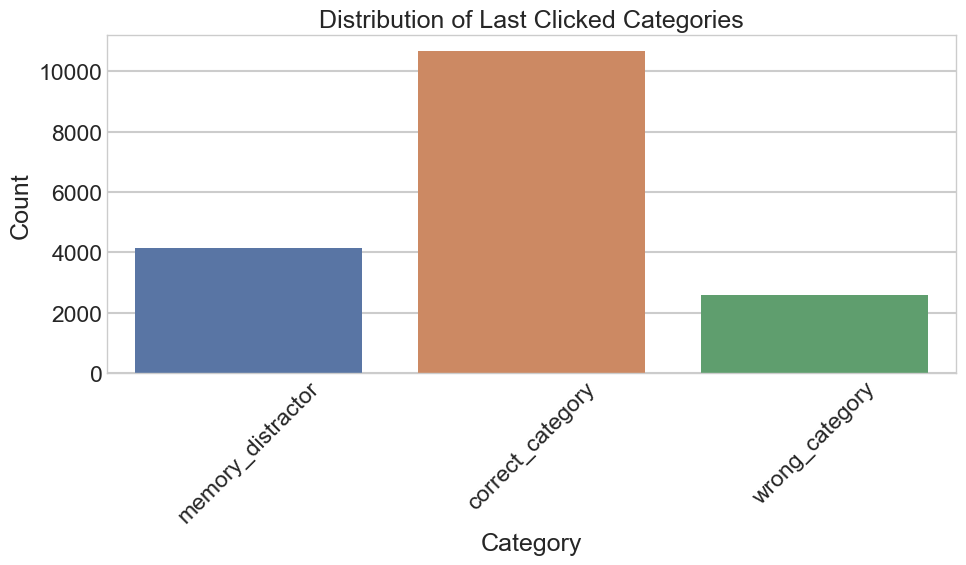

In [125]:
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("deep")

# Count plot for last_clicked_category
plt.figure(figsize=(10, 6))
sns.countplot(data=df_cleaned, x='last_clicked_category')
plt.title('Distribution of Last Clicked Categories')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

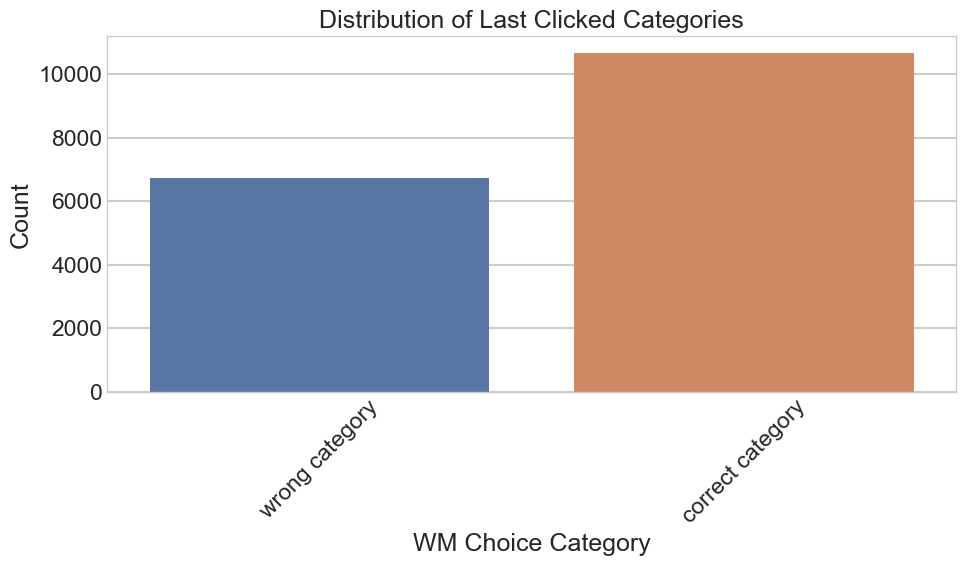

In [126]:
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("deep")

# Count plot for last_clicked_category
plt.figure(figsize=(10, 6))
sns.countplot(data=df_cleaned, x='WM Choice Category')
plt.title('Distribution of Last Clicked Categories')
plt.xlabel('WM Choice Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

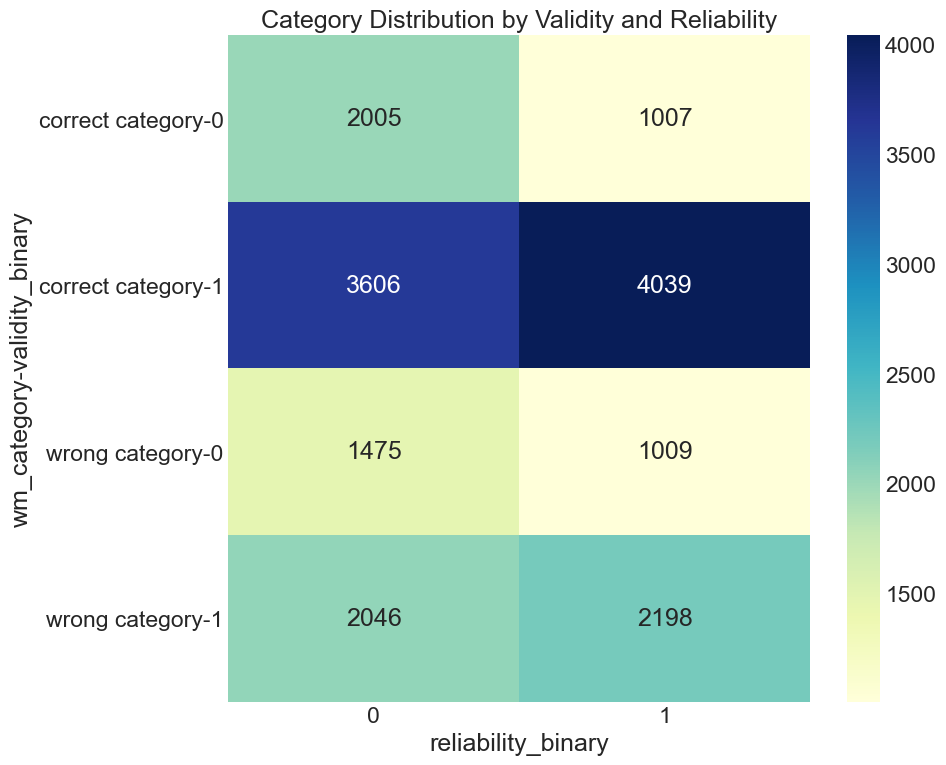

In [127]:
cross_tab = pd.crosstab(
    [df_cleaned['wm_category'], df_cleaned['validity_binary']], 
    df_cleaned['reliability_binary']
)

# Plot as heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Category Distribution by Validity and Reliability')
plt.tight_layout()
plt.show()

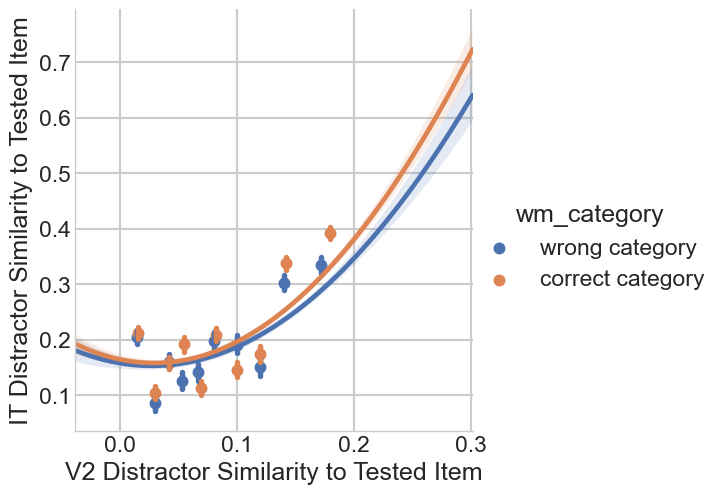

In [128]:
sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='IT Distractor Similarity to Tested Item',
    hue = 'wm_category',
    # row = 'Retrocue Reliability',

    x_bins = 10,
    order = 2,
    ci = 68,
    # palette = palette[::-1],  # Reverse the color order
    data=df_cleaned
)

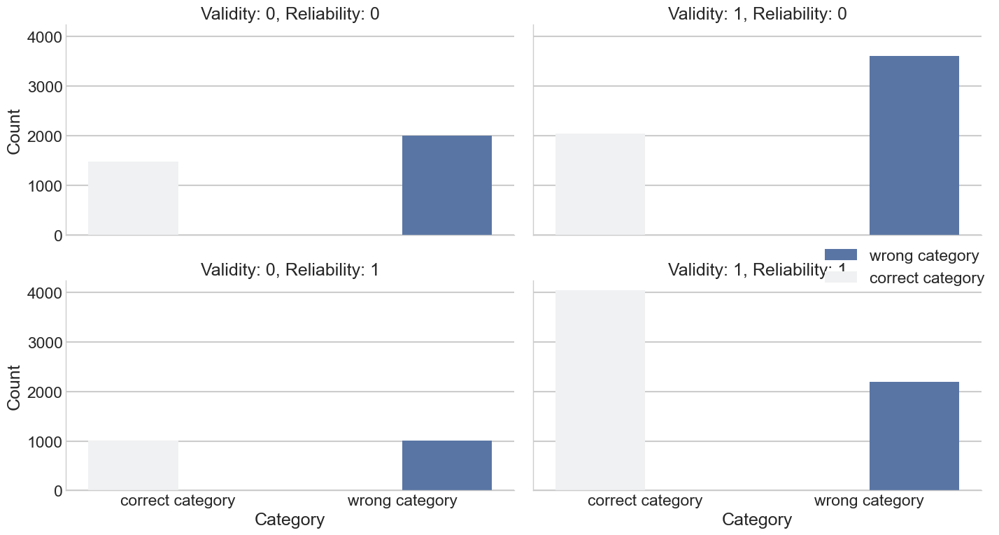

In [129]:
g = sns.FacetGrid(df_cleaned, col='validity_binary', row='reliability_binary', height=4, aspect=1.5)
g.map_dataframe(sns.countplot, x='wm_category', hue='WM Choice Category')
g.add_legend()
g.set_axis_labels("Category", "Count")
g.set_titles("Validity: {col_name}, Reliability: {row_name}")
plt.tight_layout()
plt.show()


##Reliability doesn't have much of an effect in valid trials, but in invalid ones
## low reliability ensures that people remember not a detailed but a general picture - thus higher
## choices of correct category?

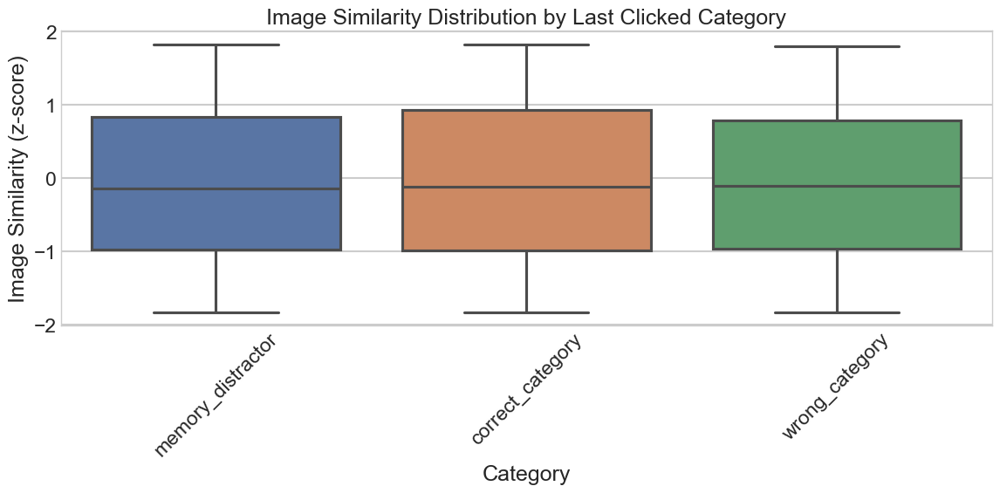

In [130]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_cleaned, x='last_clicked_category', y='it_sim_dis_test_z')
plt.title('Image Similarity Distribution by Last Clicked Category')
plt.xlabel('Category')
plt.ylabel('Image Similarity (z-score)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

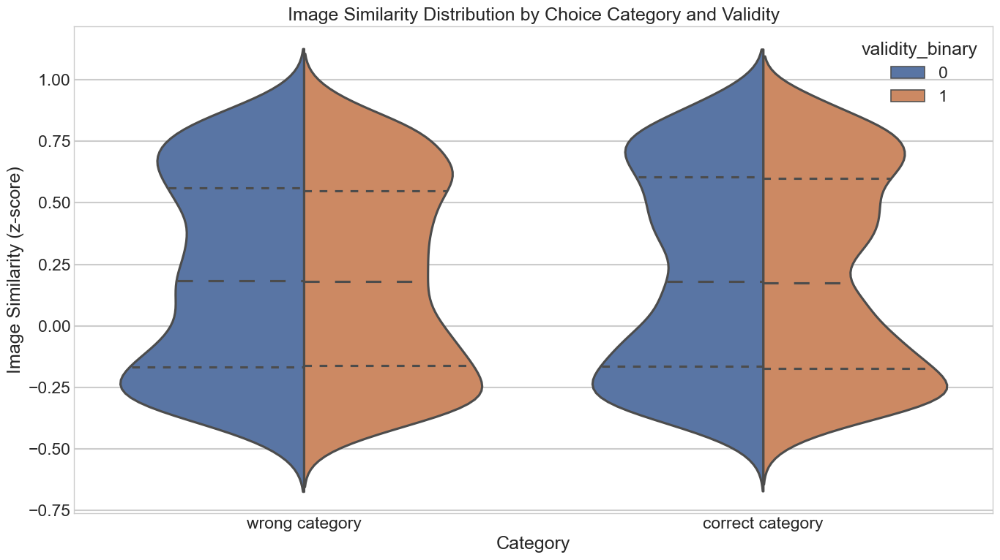

In [131]:
plt.figure(figsize=(14, 8))
sns.violinplot(data=df_cleaned, x='WM Choice Category', y='it_sim_dis_test', 
               hue='validity_binary', split=True, inner='quartile')
plt.title('Image Similarity Distribution by Choice Category and Validity')
plt.xlabel('Category')
plt.ylabel('Image Similarity (z-score)')
plt.tight_layout()
plt.show()

In [132]:
import plotly.express as px

fig = px.scatter(df_cleaned, x='it_sim_dis_test_z', y='v2_sim_dis_test_z', 
                color='wm_category', symbol='validity_binary'
                # facet_col='reliability_binary',
                # hover_data=['resp_correct']
                )
fig.update_layout(title='Image Similarity Metrics by Category and Trial Type')
fig.show()

<Figure size 1200x800 with 0 Axes>

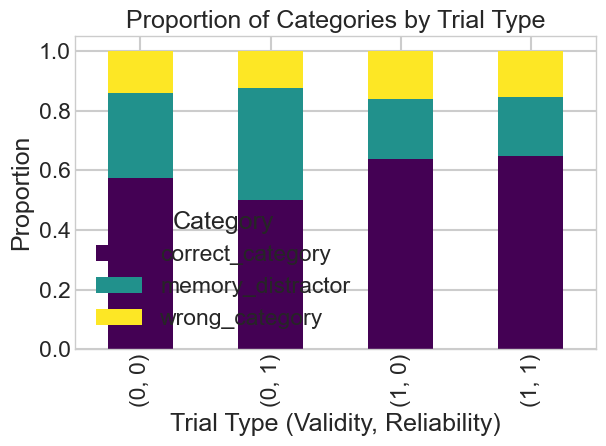

In [133]:
# Calculate proportions
props = df_cleaned.groupby(['validity_binary', 'reliability_binary'])['last_clicked_category'].value_counts(normalize=True).unstack().fillna(0)

# Plot
plt.figure(figsize=(12, 8))
props.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Proportion of Categories by Trial Type')
plt.xlabel('Trial Type (Validity, Reliability)')
plt.ylabel('Proportion')
plt.legend(title='Category')
plt.tight_layout()
plt.show()

In [134]:
# Calculate proportions
props = df_cleaned.groupby(['validity_binary', 'reliability_binary'])['wm_category_num'].value_counts(normalize=True).unstack().fillna(0)

# Plot
plt.figure(figsize=(12, 8))
props.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Proportion of Categories by Trial Type')
plt.xlabel('Trial Type (Validity, Reliability)')
plt.ylabel('Proportion')
plt.legend(title='Category')
plt.tight_layout()
plt.show()

KeyError: 'Column not found: wm_category_num'

In [135]:
df_cleaned['wm_category_num'] =  np.where(
    df_cleaned['wm_category'] == "correct category", 1,0 )
df_cleaned['wm_category_num'].unique()

array([0, 1])

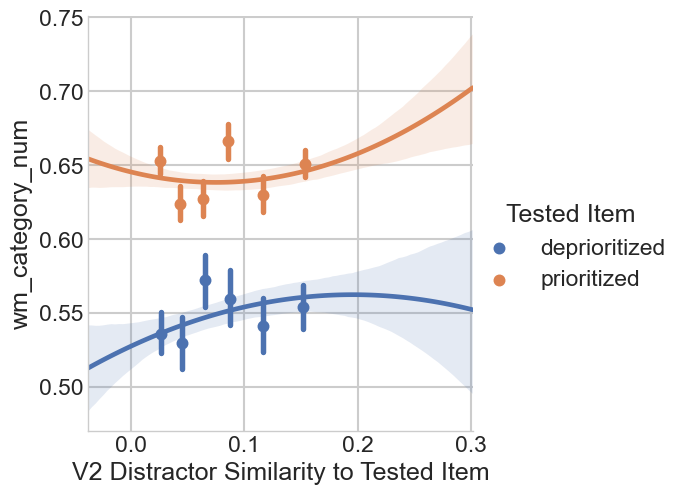

In [136]:

sns.lmplot(
    x='V2 Distractor Similarity to Tested Item',
    y='wm_category_num',
    hue = 'Tested Item',
    # row = 'Retrocue Reliability',

    x_bins = 6,
    order = 2,
    ci = 68,
    # palette = palette[::-1],  # Reverse the color order
    data=df_cleaned
)



In [15]:
g = sns.catplot(
            x = 'Tested Item',
            y='wm_category_num',
            hue = 'Retrocue Reliability',

            ci = 68,       
            aspect = 1.3,
            kind = 'point',
            data = df_cleaned)
# g.set(ylim=(1.5, 1.7))


NameError: name 'df_cleaned' is not defined

In [14]:
sns.lmplot(
    x='IT Distractor Similarity to Tested Item',
    y='wm_category_num',
    hue = 'Tested Item',
    # row = 'Retrocue Reliability',

    x_bins = 6,
    order = 2,
    ci = 68,
    # palette = palette[::-1],  # Reverse the color order
    data=df_cleaned
)

NameError: name 'df_cleaned' is not defined

Text(45.890582264957274, 0.5, 'Accuracy')

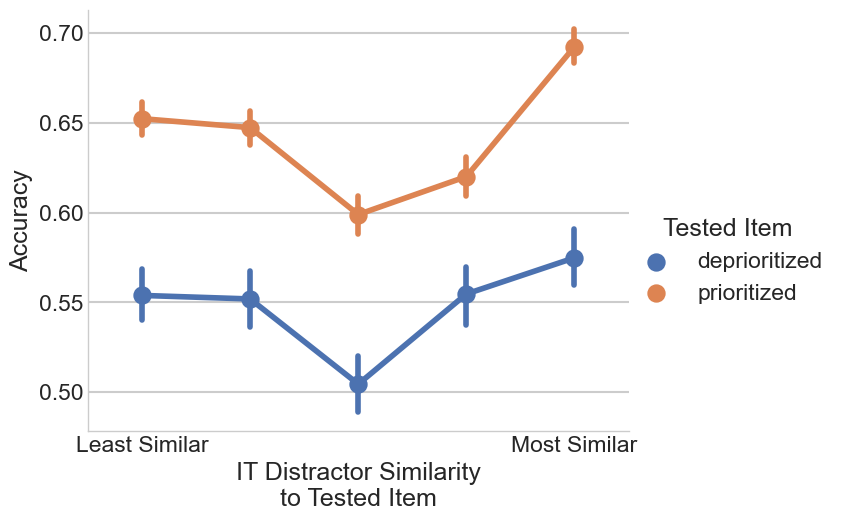

In [139]:
g = sns.catplot(
    x = 'IT Distractor Similarity\nto Tested Item',
    y='wm_category_num',
    hue = 'Tested Item',

    ci = 68,       
    aspect = 1.3,
    kind = 'point',
    data = df_cleaned)
# g.set(ylim=(1.5, 1.7))
plt.ylabel('Accuracy')

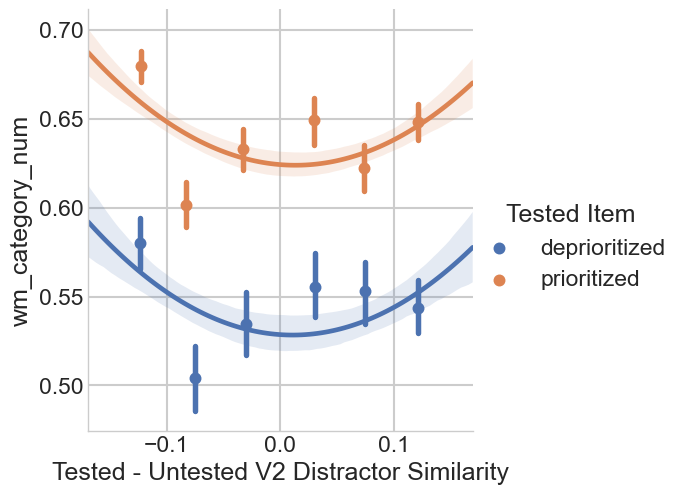

In [140]:
sns.lmplot(
    x='Tested - Untested V2 Distractor Similarity',
    y='wm_category_num',
    hue = 'Tested Item',

    # hue = 'wm_category',
    # row = 'Retrocue Reliability',

    x_bins = 6,
    order = 2,
    ci = 68,
    # palette = palette[::-1],  # Reverse the color order
    data=df_cleaned
)

Text(49.96567841880342, 0.5, 'Accuracy')

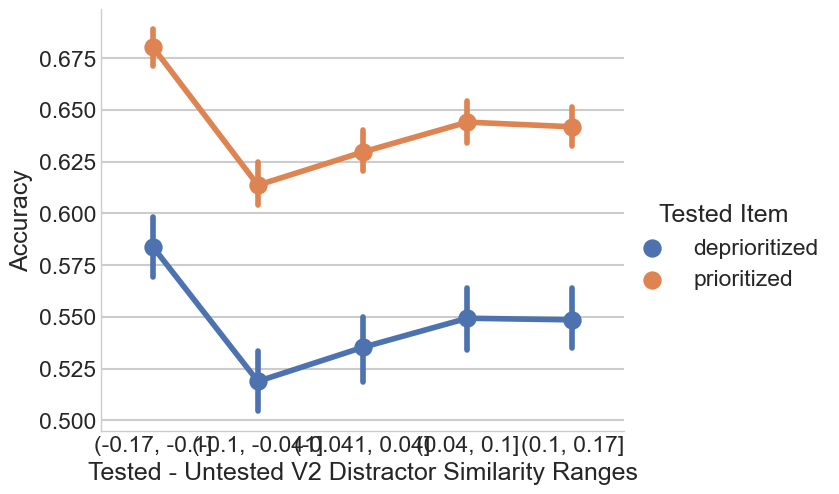

In [141]:
g = sns.catplot(
    x = 'Tested - Untested V2 Distractor Similarity Ranges',
    y='wm_category_num',
    hue = 'Tested Item',

    ci = 68,       
    aspect = 1.3,
    kind = 'point',
    data = df_cleaned)
# g.set(ylim=(1.5, 1.7))
plt.ylabel('Accuracy')

Text(53.224423611111106, 0.5, 'wm correct category frequency')

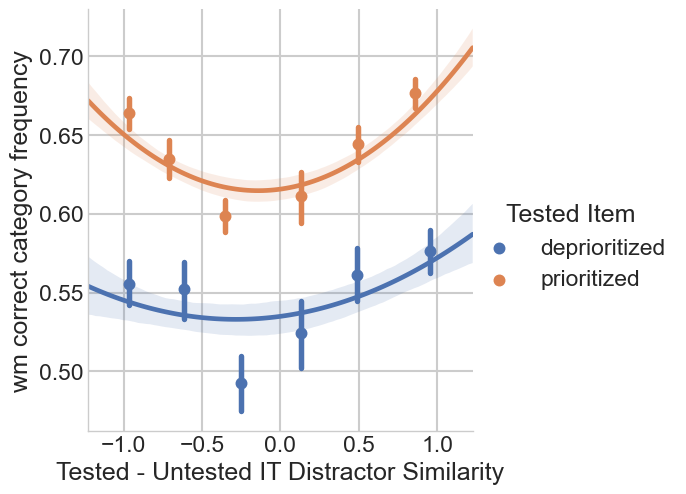

In [142]:
sns.lmplot(
    x='Tested - Untested IT Distractor Similarity',
    y='wm_category_num',
    hue = 'Tested Item',
    # row = 'Retrocue Reliability',

    x_bins = 6,
    order = 2,
    ci = 68,
    # palette = palette[::-1],  # Reverse the color order
    data=df_cleaned
)
plt.ylabel('wm correct category frequency')

Text(49.96567841880342, 0.5, 'wm correct category frequency')

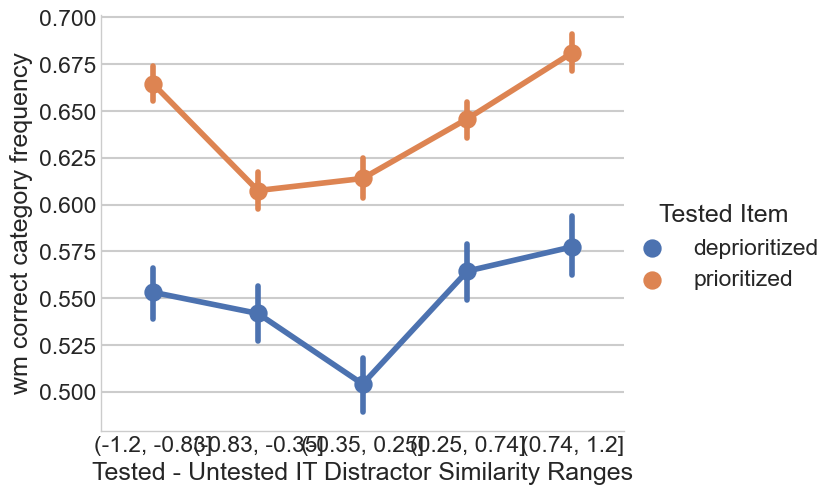

In [143]:
g = sns.catplot(
    x = 'Tested - Untested IT Distractor Similarity Ranges',
    y='wm_category_num',
    hue = 'Tested Item',

    ci = 68,       
    aspect = 1.3,
    kind = 'point',
    data = df_cleaned)
# g.set(ylim=(1.5, 1.7))
plt.ylabel('wm correct category frequency')

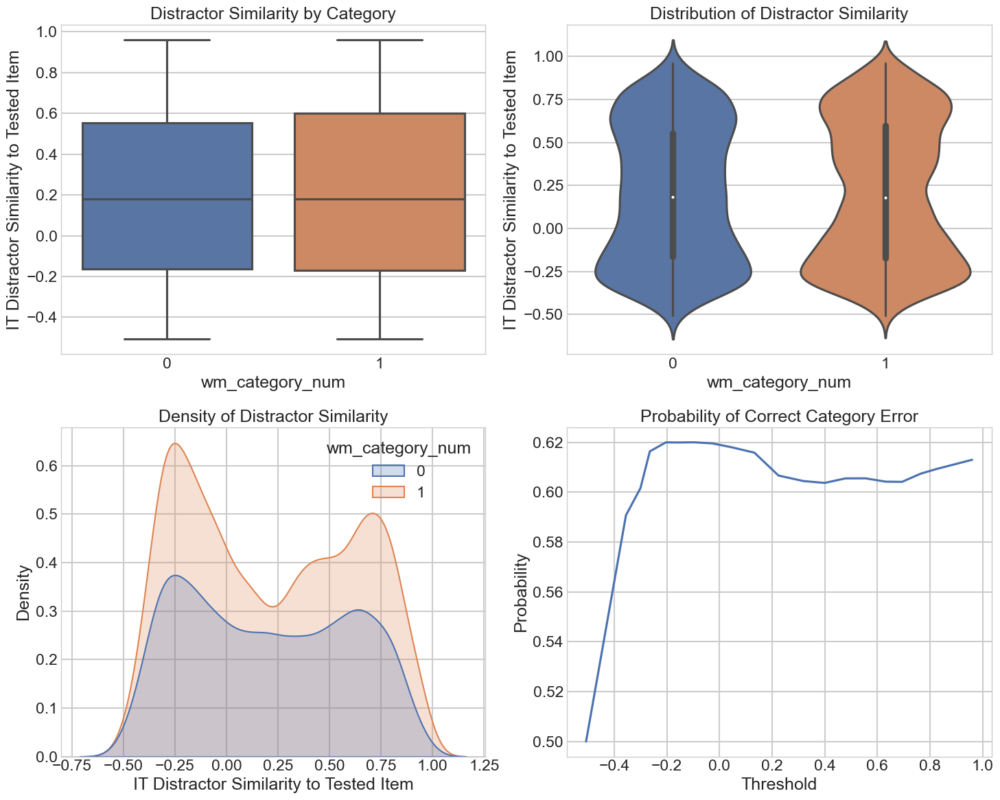

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns

# Multiple plots to explore the data
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Boxplot of similarity by category
sns.boxplot(
    x='wm_category_num', 
    y='IT Distractor Similarity to Tested Item', 
    data=df_cleaned, 
    ax=axes[0, 0]
)
axes[0, 0].set_title('Distractor Similarity by Category')

# 2. Violin plot for distribution
sns.violinplot(
    x='wm_category_num', 
    y='IT Distractor Similarity to Tested Item', 
    data=df_cleaned, 
    ax=axes[0, 1]
)
axes[0, 1].set_title('Distribution of Distractor Similarity')

# 3. Kernel Density Estimation
sns.kdeplot(
    data=df_cleaned, 
    x='IT Distractor Similarity to Tested Item', 
    hue='wm_category_num', 
    fill=True,
    ax=axes[1, 0]
)
axes[1, 0].set_title('Density of Distractor Similarity')

# 4. Probability of category error
from scipy import stats

def bootstrap_category_prob(data, feature, category_col, n_bootstrap=1000):
    probabilities = []
    for threshold in np.percentile(data[feature], np.linspace(0, 100, 20)):
        subset = data[data[feature] <= threshold]
        prob = subset[category_col].mean()
        probabilities.append((threshold, prob))
    return pd.DataFrame(probabilities, columns=['Threshold', 'Probability'])

category_probs = bootstrap_category_prob(df_cleaned, 'IT Distractor Similarity to Tested Item', 'wm_category_num')
sns.lineplot(
    x='Threshold', 
    y='Probability', 
    data=category_probs, 
    ax=axes[1, 1]
)
axes[1, 1].set_title('Probability of Correct Category Error')

plt.tight_layout()
plt.show()

t-test: t=-1.65, p=0.0995


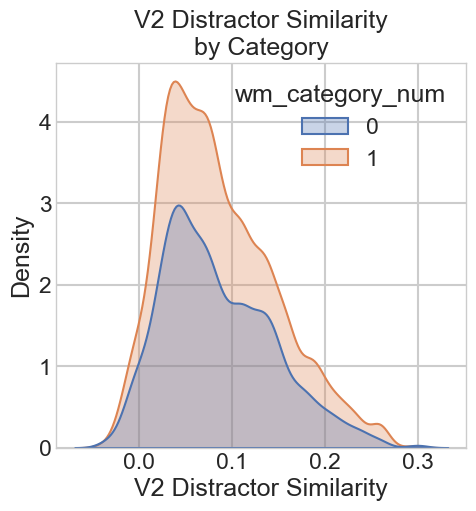

In [145]:
plt.figure(figsize=(18, 5))

# 1. Distribution of IT Distractor Similarity by Category
plt.subplot(1, 3, 1)
# Kernel Density Estimation
sns.kdeplot(
    data=df_cleaned, 
    x='V2 Distractor Similarity to Tested Item', 
    hue='wm_category_num', 
    fill=True,
    alpha=0.3
)
plt.title('V2 Distractor Similarity\nby Category')
plt.xlabel('V2 Distractor Similarity')
plt.ylabel('Density')

# Statistical test for IT Similarity between categories
cat_0_it = df_cleaned[df_cleaned['wm_category_num'] == 0]['V2 Distractor Similarity to Tested Item']
cat_1_it = df_cleaned[df_cleaned['wm_category_num'] == 1]['V2 Distractor Similarity to Tested Item']
t_stat, p_val = stats.ttest_ind(cat_0_it, cat_1_it)
print(f't-test: t={t_stat:.2f}, p={p_val:.4f}')


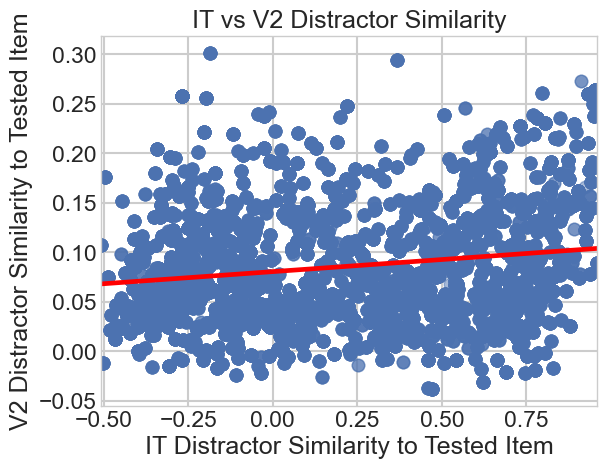

In [146]:
sns.regplot(
    x='IT Distractor Similarity to Tested Item', 
    y='V2 Distractor Similarity to Tested Item', 
    data=df_cleaned,
    scatter_kws={'alpha':0.5},
    line_kws={'color': 'red'}
)
plt.title('IT vs V2 Distractor Similarity')
# Calculate and display correlation
corr = df_cleaned['IT Distractor Similarity to Tested Item'].corr(
    df_cleaned['V2 Distractor Similarity to Tested Item']
)


Tested Item: deprioritized
t-test: t=-16.40, p=0.0000
Mean RT (Cat 0): 1.679
Mean RT (Cat 1): 1.926

Tested Item: prioritized
t-test: t=-1.93, p=0.0536
Mean RT (Cat 0): 1.847
Mean RT (Cat 1): 1.868


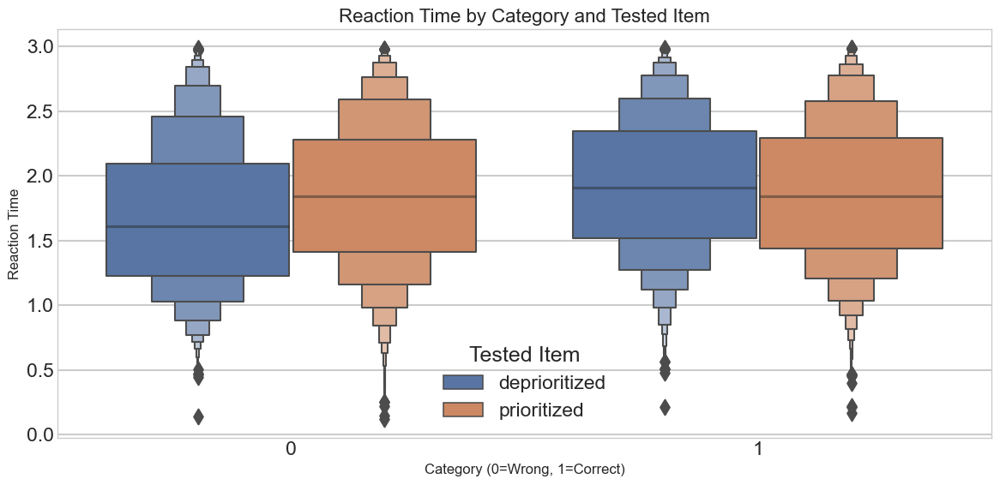


Detailed Reaction Time Summary:
                                count      mean       std     min       25%  \
Tested Item   wm_category_num                                                 
deprioritized 0                2484.0  1.678721  0.579472  0.1390  1.227675   
              1                3012.0  1.925927  0.535916  0.2124  1.520400   
prioritized   0                4244.0  1.847057  0.574243  0.1220  1.413075   
              1                7645.0  1.867793  0.553932  0.1660  1.442700   

                                   50%      75%     max  
Tested Item   wm_category_num                            
deprioritized 0                1.61140  2.09305  2.9881  
              1                1.91200  2.34535  2.9894  
prioritized   0                1.84485  2.27920  2.9814  
              1                1.84500  2.29550  2.9890  


In [147]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

plt.figure(figsize=(12, 6))

# Boxen plot (enhanced boxplot)
sns.boxenplot(
   x='wm_category_num', 
   y='rt', 
   hue='Tested Item',
   data=df_cleaned
)

plt.title('Reaction Time by Category and Tested Item', fontsize=16)
plt.xlabel('Category (0=Wrong, 1=Correct)', fontsize=12)
plt.ylabel('Reaction Time', fontsize=12)

# Perform statistical test
for tested_item in df_cleaned['Tested Item'].unique():
   subset = df_cleaned[df_cleaned['Tested Item'] == tested_item]
   cat_0_rt = subset[subset['wm_category_num'] == 0]['rt']
   cat_1_rt = subset[subset['wm_category_num'] == 1]['rt']
   t_stat, p_val = stats.ttest_ind(cat_0_rt, cat_1_rt)
   
   print(f"\nTested Item: {tested_item}")
   print(f"t-test: t={t_stat:.2f}, p={p_val:.4f}")
   print(f"Mean RT (Cat 0): {cat_0_rt.mean():.3f}")
   print(f"Mean RT (Cat 1): {cat_1_rt.mean():.3f}")

plt.tight_layout()
plt.show()

# Additional summary statistics
print("\nDetailed Reaction Time Summary:")
print(df_cleaned.groupby(['Tested Item', 'wm_category_num'])['rt'].describe())

<Figure size 1200x600 with 0 Axes>

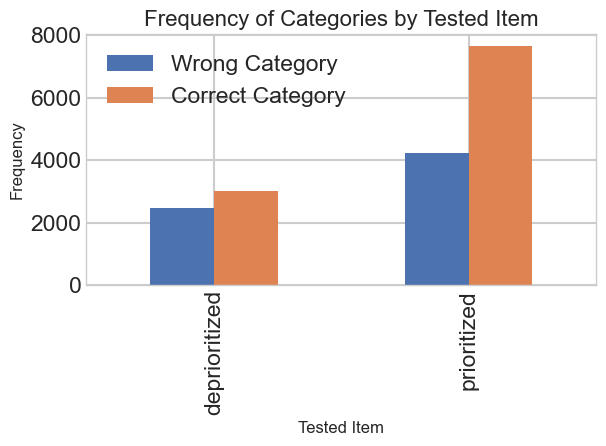

Frequency Table:
wm_category_num     0     1
Tested Item                
deprioritized    2484  3012
prioritized      4244  7645

Percentage Table:
wm_category_num          0          1
Tested Item                          
deprioritized    45.196507  54.803493
prioritized      35.696863  64.303137


In [148]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

plt.figure(figsize=(12, 6))

# Contingency table
freq_table = pd.crosstab(
   df_cleaned['Tested Item'], 
   df_cleaned['wm_category_num']
)

# Plot frequency
freq_table.plot(kind='bar', stacked=False)

plt.title('Frequency of Categories by Tested Item', fontsize=16)
plt.xlabel('Tested Item', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend(labels=['Wrong Category', 'Correct Category'])

# # Chi-square test
# chi2, p_val, dof, expected = stats.chi2_contingency(freq_table)

# # Annotate with statistical details
# plt.text(0.05, 0.95, 
#         f'Chi-square: χ²={chi2:.2f}, p={p_val:.4f}\n', 
#         transform=plt.gca().transAxes, 
#         verticalalignment='top',
#         bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

plt.tight_layout()
plt.show()

# Print detailed frequency and percentage information
print("Frequency Table:")
print(freq_table)

print("\nPercentage Table:")
percentage_table = freq_table.div(freq_table.sum(axis=1), axis=0) * 100
print(percentage_table)

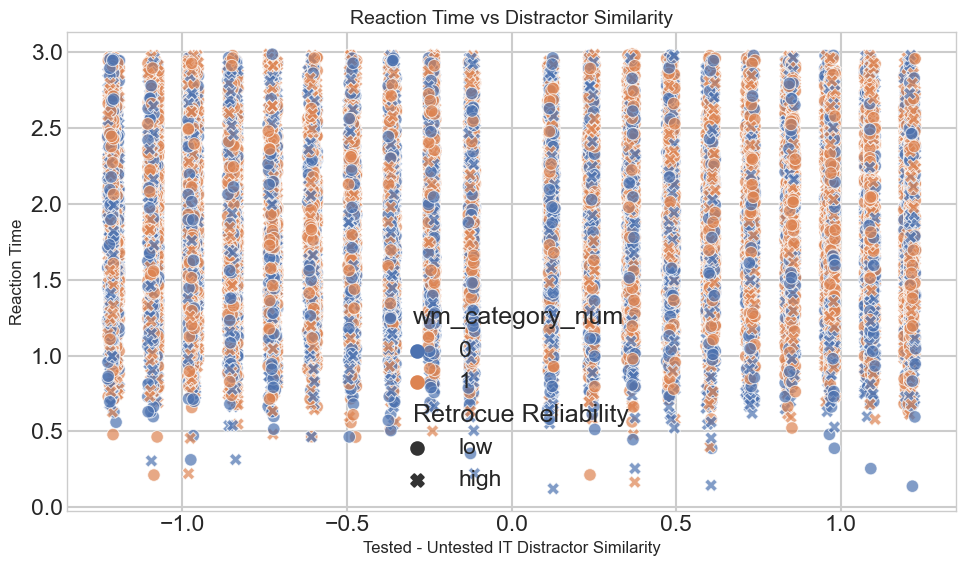

Statistical Summary:
                                          mean       std
wm_category_num Retrocue Reliability                    
0               high                  1.772489  0.586984
                low                   1.796217  0.576958
1               high                  1.883421  0.563831
                low                   1.884945  0.536333


In [149]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))

# Scatter plot with clear differentiation
sns.scatterplot(
    data=df_cleaned,
    x='Tested - Untested IT Distractor Similarity', 
    y='rt', 
    hue='wm_category_num',
    style='Retrocue Reliability',
    alpha=0.7
)

plt.title('Reaction Time vs Distractor Similarity', fontsize=14)
plt.xlabel('Tested - Untested IT Distractor Similarity', fontsize=12)
plt.ylabel('Reaction Time', fontsize=12)

plt.tight_layout()
plt.show()

# Additional simple statistical summary
print("Statistical Summary:")
print(df_cleaned.groupby(['wm_category_num', 'Retrocue Reliability'])['rt'].agg(['mean', 'std']))

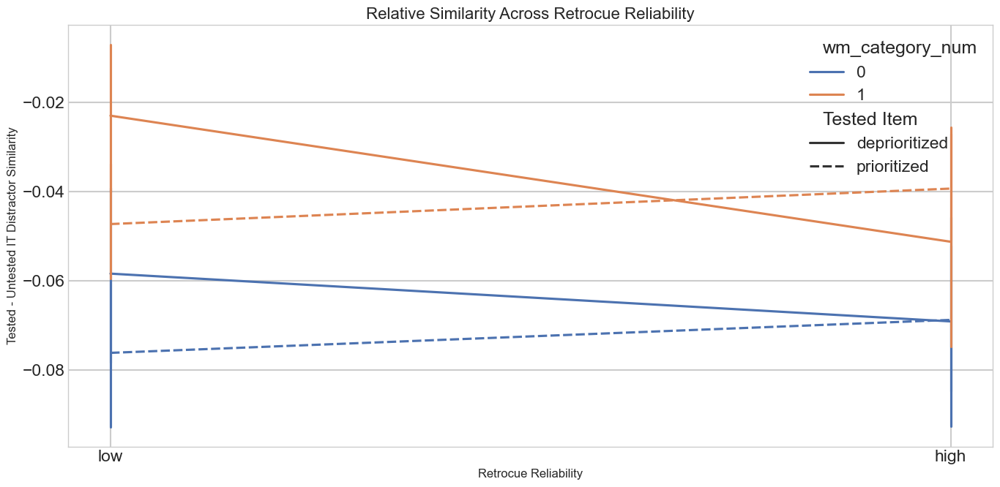

Statistical Summary:
                                                        mean       std  count
Retrocue Reliability wm_category_num Tested Item                             
high                 0               deprioritized -0.069099  0.755759   1009
                                     prioritized   -0.068760  0.732091   2198
                     1               deprioritized -0.051246  0.769286   1007
                                     prioritized   -0.039333  0.763555   4039
low                  0               deprioritized -0.058391  0.748754   1475
                                     prioritized   -0.076145  0.742943   2046
                     1               deprioritized -0.022995  0.766677   2005
                                     prioritized   -0.047282  0.777456   3606


In [150]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 7))

# Line plot with error bars
sns.lineplot(
    data=df_cleaned,
    x='Retrocue Reliability',
    y='Tested - Untested IT Distractor Similarity',
    hue='wm_category_num',
    style='Tested Item',
    err_style='bars',
    ci=68  # 68% confidence interval
)

plt.title('Relative Similarity Across Retrocue Reliability', fontsize=16)
plt.xlabel('Retrocue Reliability', fontsize=12)
plt.ylabel('Tested - Untested IT Distractor Similarity', fontsize=12)

plt.tight_layout()
plt.show()

# Comprehensive statistical summary
print("Statistical Summary:")
summary = df_cleaned.groupby(['Retrocue Reliability', 'wm_category_num', 'Tested Item'])['Tested - Untested IT Distractor Similarity'].agg(['mean', 'std', 'count'])
print(summary)

<Figure size 1400x700 with 0 Axes>

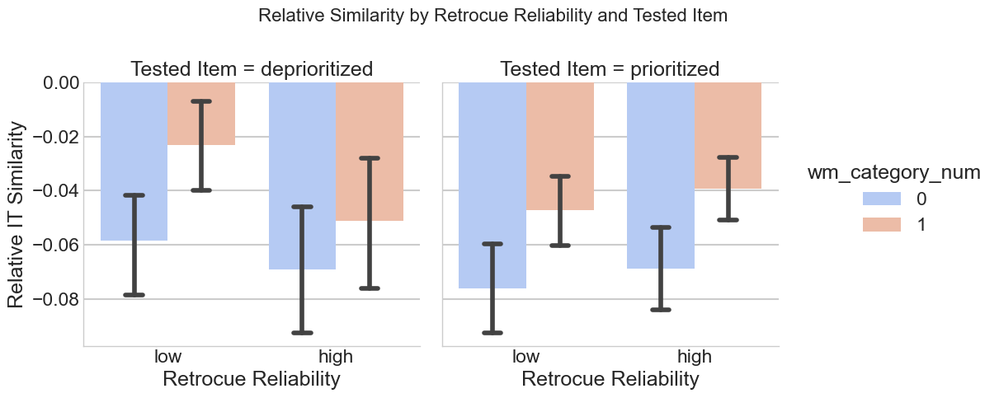

Statistical Summary:
                                                        mean       std  count
Retrocue Reliability wm_category_num Tested Item                             
high                 0               deprioritized -0.069099  0.755759   1009
                                     prioritized   -0.068760  0.732091   2198
                     1               deprioritized -0.051246  0.769286   1007
                                     prioritized   -0.039333  0.763555   4039
low                  0               deprioritized -0.058391  0.748754   1475
                                     prioritized   -0.076145  0.742943   2046
                     1               deprioritized -0.022995  0.766677   2005
                                     prioritized   -0.047282  0.777456   3606


In [151]:

plt.figure(figsize=(14, 7))

g = sns.catplot(
   data=df_cleaned,
   x='Retrocue Reliability',
   y='Tested - Untested IT Distractor Similarity',
   hue='wm_category_num',
   col='Tested Item',
   kind='bar',
   ci=68,  # 68% confidence interval
   capsize=0.1,
   height=5,
   aspect=1,
   palette='coolwarm'
)

# Customize the plot
g.set_axis_labels('Retrocue Reliability', 'Relative IT Similarity')
# g.add_legend(title='Category')
g.fig.suptitle('Relative Similarity by Retrocue Reliability and Tested Item', fontsize=16)
g.tight_layout()

plt.show()

# Detailed statistical summary
print("Statistical Summary:")
summary = df_cleaned.groupby(['Retrocue Reliability', 'wm_category_num', 'Tested Item'])['Tested - Untested IT Distractor Similarity'].agg(['mean', 'std', 'count'])
print(summary)

<Figure size 1400x700 with 0 Axes>

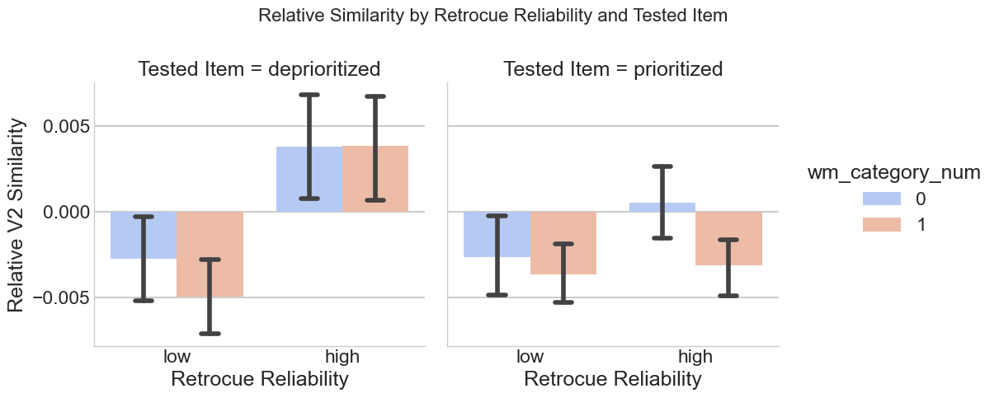

Statistical Summary:
                                                        mean       std  count
Retrocue Reliability wm_category_num Tested Item                             
high                 0               deprioritized  0.003825  0.097991   1009
                                     prioritized    0.000550  0.097115   2198
                     1               deprioritized  0.003854  0.100538   1007
                                     prioritized   -0.003119  0.100742   4039
low                  0               deprioritized -0.002746  0.097925   1475
                                     prioritized   -0.002627  0.098278   2046
                     1               deprioritized -0.004948  0.100771   2005
                                     prioritized   -0.003657  0.100061   3606


In [152]:

plt.figure(figsize=(14, 7))

g = sns.catplot(
   data=df_cleaned,
   x='Retrocue Reliability',
   y='Tested - Untested V2 Distractor Similarity',
   hue='wm_category_num',
   col='Tested Item',
   kind='bar',
   ci=68,  # 68% confidence interval
   capsize=0.1,
   height=5,
   aspect=1,
   palette='coolwarm'
)

# Customize the plot
g.set_axis_labels('Retrocue Reliability', 'Relative V2 Similarity')
# g.add_legend(title='Category')
g.fig.suptitle('Relative Similarity by Retrocue Reliability and Tested Item', fontsize=16)
g.tight_layout()

plt.show()

# Detailed statistical summary
print("Statistical Summary:")
summary = df_cleaned.groupby(['Retrocue Reliability', 'wm_category_num', 'Tested Item'])['Tested - Untested V2 Distractor Similarity'].agg(['mean', 'std', 'count'])
print(summary)

In [153]:
!pip install ptitprince


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [154]:
import ptitprince as pt



In [166]:
df['resp_correct_within'] = pd.to_numeric(df['resp_correct_within'], errors='coerce')

pt.RainCloud(x = 'Tested - Untested IT Distractor Similarity', y = 'Tested Item', data = df, palette = palette, bw = .2,
                 width_viol = .6, ax = ax, orient = ort)

TypeError: Horizontal orientation requires numeric `x` variable.

Text(0.5, 1.0, 'Figure P2\n Basic Rainclouds')

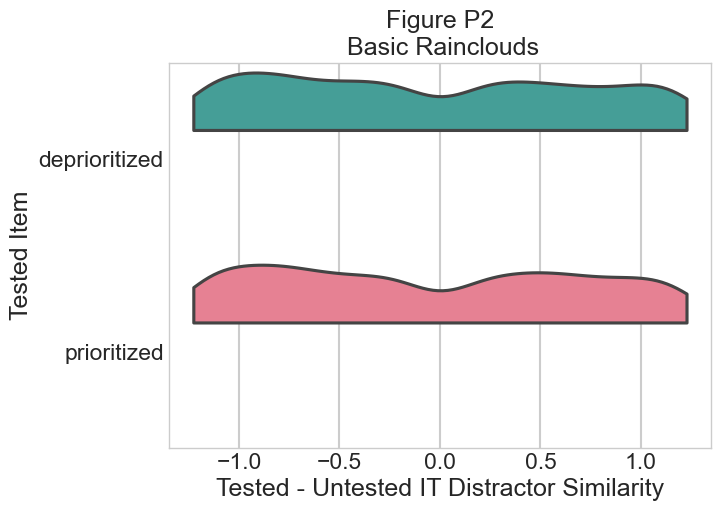

In [178]:
# plotting the clouds
f, ax = plt.subplots(figsize=(7, 5))
dy='Tested Item'; dx='Tested - Untested IT Distractor Similarity'; ort="h"; pal = sns.color_palette(n_colors=1)

ax=pt.half_violinplot( x = dx, y = dy, data = df_cleaned, palette = palette, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)

plt.title("Figure P2\n Basic Rainclouds")


Text(0.5, 1.0, 'Figure P4\n Raincloud with Jittered Data')

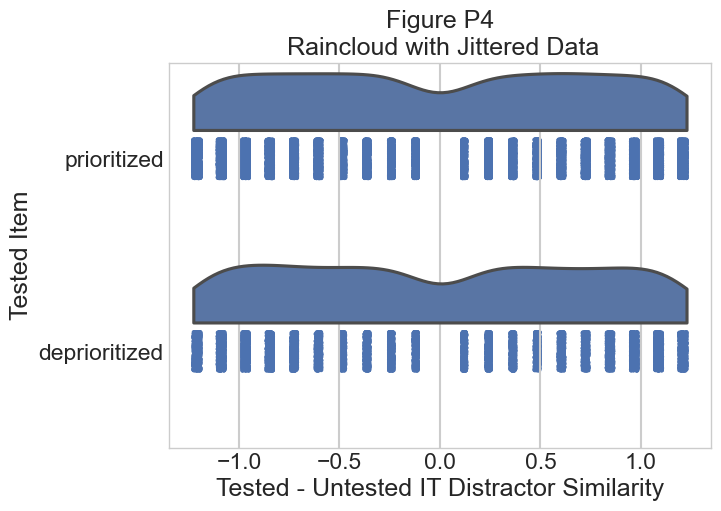

In [179]:
f, ax = plt.subplots(figsize=(7, 5))
ax=pt.half_violinplot( x = dx, y = dy, data = df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)
ax=sns.stripplot( x = dx, y = dy, data = df, palette = pal, edgecolor = "white",
                 size = 3, jitter = 1, zorder = 0, orient = ort)

plt.title("Figure P4\n Raincloud with Jittered Data")


Text(0.5, 1.0, 'Figure P5\n Raincloud with Boxplot')

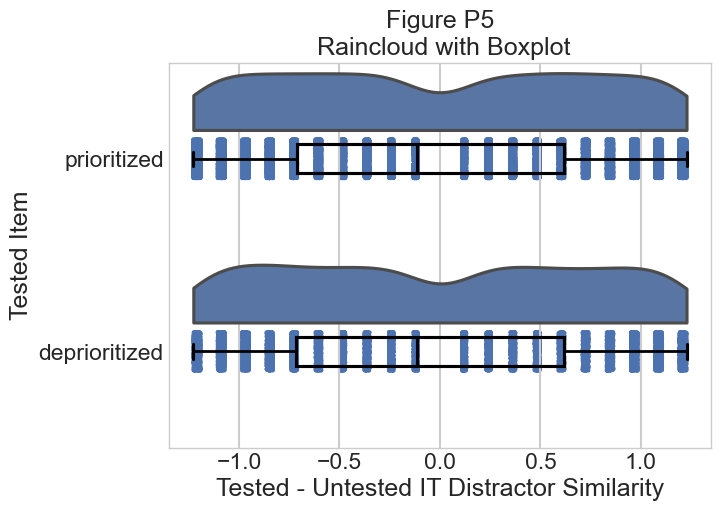

In [180]:
f, ax = plt.subplots(figsize=(7, 5))
ax=pt.half_violinplot( x = dx, y = dy, data = df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)
ax=sns.stripplot( x = dx, y = dy, data = df, palette = pal, edgecolor = "white",
                 size = 3, jitter = 1, zorder = 0, orient = ort, ax = ax )
ax=sns.boxplot( x = dx, y = dy, data = df, color = "black", width = .15, zorder = 10,\
            showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
            showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
               saturation = 1, orient = ort)

plt.title("Figure P5\n Raincloud with Boxplot")


Text(0.5, 1.0, 'Figure P6\n Tweaking the Colour of Your Raincloud')

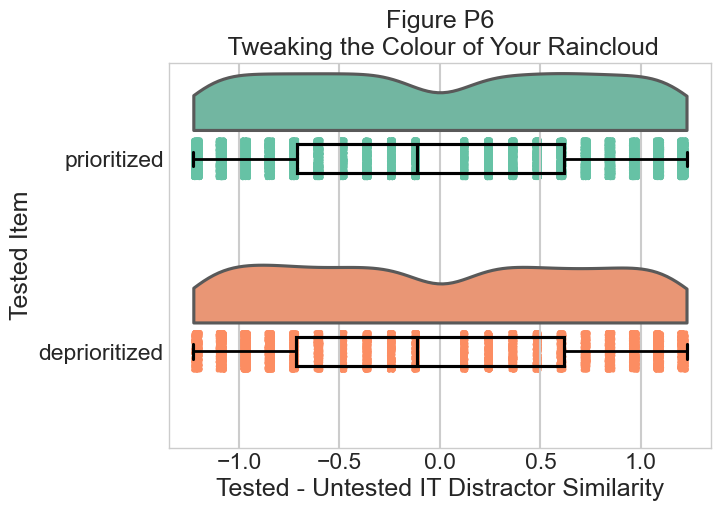

In [181]:
pal = "Set2"
f, ax = plt.subplots(figsize=(7, 5))

ax=pt.half_violinplot( x = dx, y = dy, data = df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)
ax=sns.stripplot( x = dx, y = dy, data = df, palette = pal, edgecolor = "white",
                 size = 3, jitter = 1, zorder = 0, orient = ort)
ax=sns.boxplot( x = dx, y = dy, data = df, color = "black", width = .15, zorder = 10,\
            showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
            showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
               saturation = 1, orient = ort)

plt.title("Figure P6\n Tweaking the Colour of Your Raincloud")

In [182]:
len(set(df['Tested - Untested IT Distractor Similarity'].unique()))

1200

Text(0.5, 1.0, 'Figure P8\n Rainclouds with Shifted Rain')

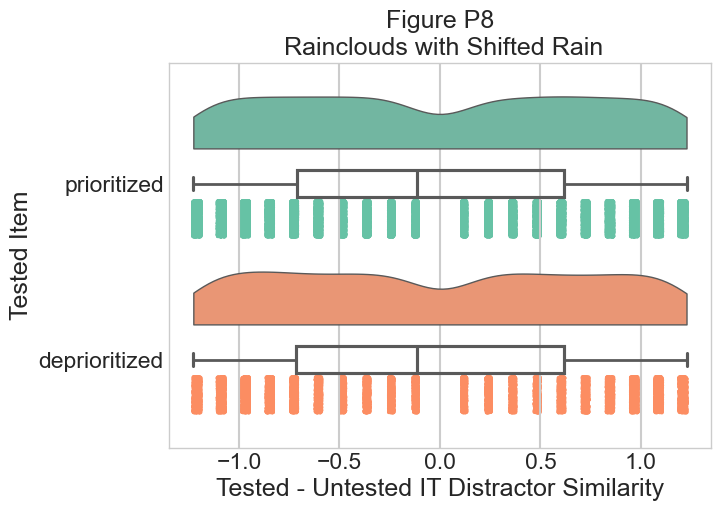

In [184]:
# dx = "group"; dy = "score"; ort = "h"; pal = "Set2"; sigma = .2
f, ax = plt.subplots(figsize=(7, 5))

ax=pt.RainCloud(x = dy, y = dx, data = df, palette = pal, bw = sigma,
                 width_viol = .6, ax = ax, orient = ort, move = .2)

plt.title("Figure P8\n Rainclouds with Shifted Rain")

In [192]:
category_mapping = {
    0: "Deprioritized Tested Item & High Reliability",
    1: "Deprioritized Tested Item & Low Reliability",
    2: "Prioritized Tested Item & Low Reliability",
    3: "Prioritized Tested Item & High Reliability"
}



# Map the numeric values to their descriptive labels
df['validity_reliability'] = df['validity_reliability'].map(category_mapping)



In [260]:

avg_scores = df.groupby(['validity_reliability','participant'])['resp_correct'].mean()
avg_scores_table = df.groupby(['participant', 'validity_reliability', 'Tested Item', 'Retrocue Reliability'])['resp_correct'].mean().reset_index()



avg_scores_table = avg_scores_table.rename(columns={'resp_correct': 'Average Score'})
avg_scores_table = avg_scores_table.rename(columns={'validity_reliability': 'Validity Reliability Group'})
avg_scores_table

,participant,Validity Reliability Group,Tested Item,Retrocue Reliability,Average Score
0,116851,Deprioritized Tested Item & High Reliability,deprioritized,high,1.000
1,116851,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.960
2,116851,Prioritized Tested Item & High Reliability,prioritized,high,0.888
3,116851,Prioritized Tested Item & Low Reliability,prioritized,low,0.920
4,121021,Deprioritized Tested Item & High Reliability,deprioritized,high,0.720
...,...,...,...,...,...
1075,171253,Prioritized Tested Item & Low Reliability,prioritized,low,0.670
1076,171304,Deprioritized Tested Item & High Reliability,deprioritized,high,0.720
1077,171304,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.860
1078,171304,Prioritized Tested Item & High Reliability,prioritized,high,0.824


Text(0.5, 1.0, 'Figure P8\n Rainclouds with Shifted Rain')

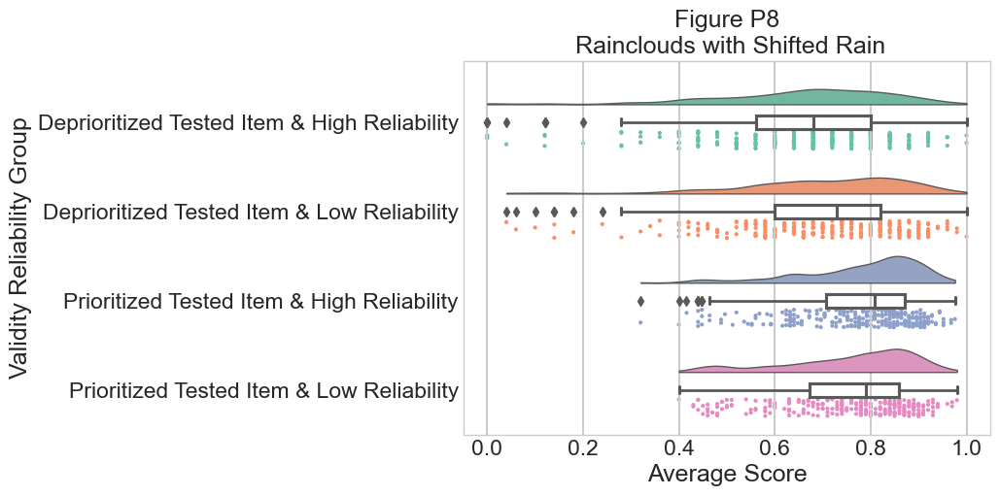

In [261]:
dx = "Validity Reliability Group"; dy = "Average Score"; ort = "h"; pal = "Set2"; sigma = .2
f, ax = plt.subplots(figsize=(7, 5))

ax=pt.RainCloud(x = dx, y = dy, data = avg_scores_table, palette = pal, bw = sigma,
                 width_viol = .6, ax = ax, orient = ort, move = .2)

plt.title("Figure P8\n Rainclouds with Shifted Rain")


Text(0.5, 1.0, 'Figure P18\n Shifting the Rain with the Move Parameter')

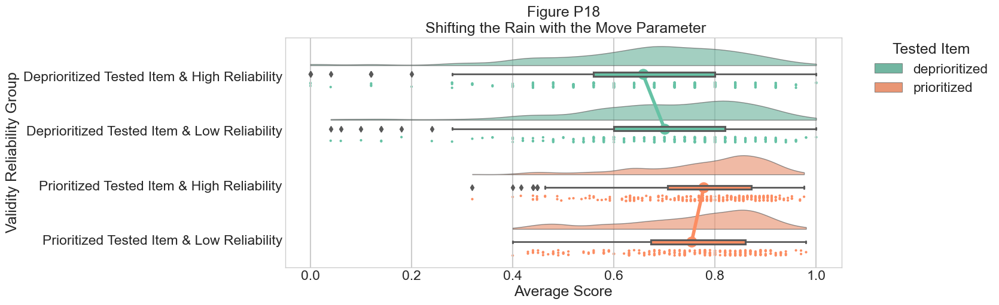

In [262]:
f, ax = plt.subplots(figsize=(12, 5))

ax=pt.RainCloud(x = dx, y = dy, hue = 'Tested Item', data = avg_scores_table, palette = pal, bw = sigma, width_viol = .7,
                ax = ax, orient = ort , alpha = .65, dodge = True, pointplot = True, move = .2)

plt.title("Figure P18\n Shifting the Rain with the Move Parameter")

Text(0.5, 1.0, 'Figure P14\n Rainclouds with Subgroups')

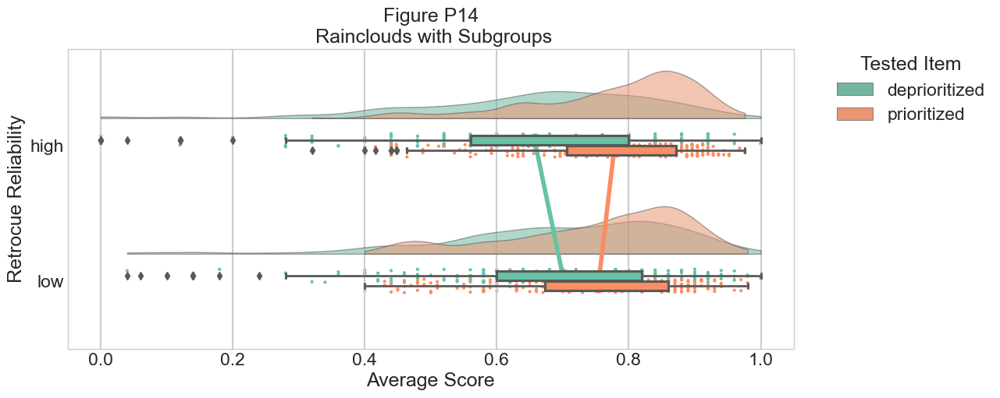

In [263]:
ort="h"
pal = "Set2"
sigma = .2
f, ax = plt.subplots(figsize=(12, 5))

ax=pt.RainCloud(x = 'Retrocue Reliability', y = dy, hue = 'Tested Item', data = avg_scores_table, palette = pal, bw = sigma,
                 width_viol = .7, ax = ax, orient = ort, alpha = .55, dodge = True, pointplot = True)

plt.title("Figure P14\n Rainclouds with Subgroups")

Text(0.5, 1.0, 'Figure P14\n Rainclouds with Subgroups')

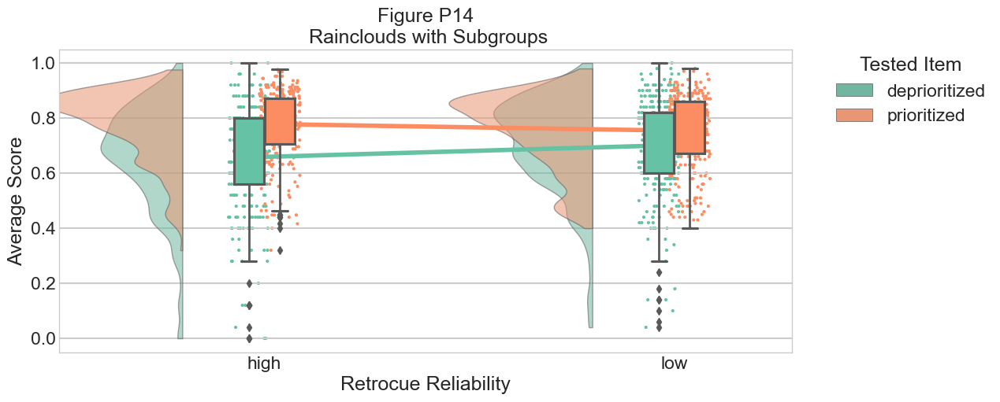

In [264]:
ort = "v"
pal = "Set2"
sigma = .2
f, ax = plt.subplots(figsize=(12, 5))

ax=pt.RainCloud(x = 'Retrocue Reliability', y = dy, hue = 'Tested Item', data = avg_scores_table, palette = pal, bw = sigma,
                 width_viol = .7, ax = ax, orient = ort, alpha = .55, dodge = True, pointplot = True)

plt.title("Figure P14\n Rainclouds with Subgroups")

Text(0.5, 1.0, 'Figure P14\n Rainclouds with Subgroups')

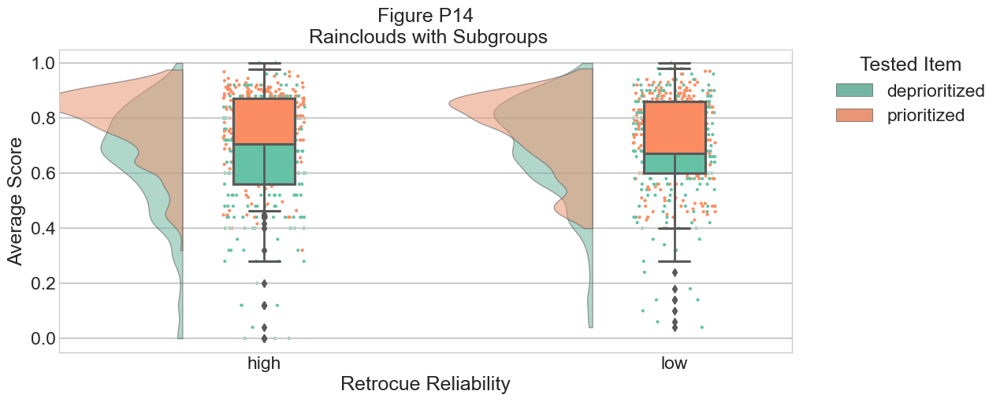

In [265]:
ort = "v"
pal = "Set2"
sigma = .2
f, ax = plt.subplots(figsize=(12, 5))
dhue = 'Tested Item'
dx = 'Retrocue Reliability'
ax=pt.RainCloud(x = dx, y = dy, hue = dhue, data = avg_scores_table, palette = pal, bw = sigma,
                 width_viol = .7, ax = ax, orient = ort, alpha = .55)

plt.title("Figure P14\n Rainclouds with Subgroups")

Text(0.5, 1.0, 'Figure P16\n The Boxplot Dodge Flag')

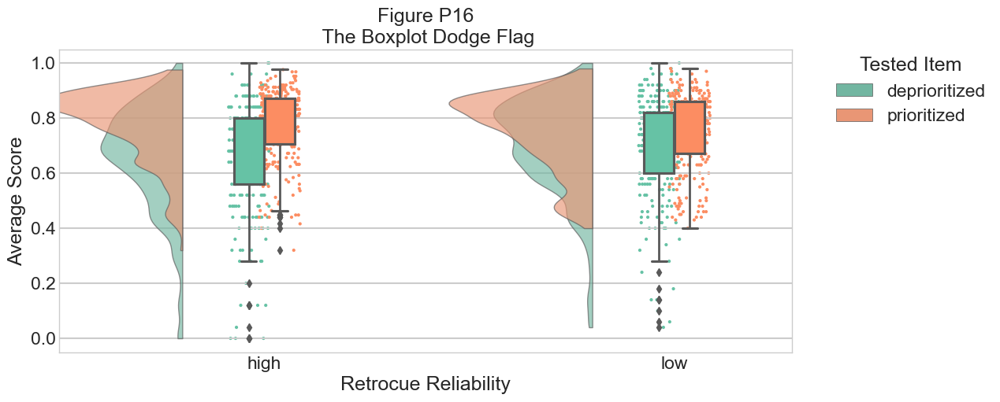

In [266]:
f, ax = plt.subplots(figsize=(12, 5))

ax=pt.RainCloud(x = dx, y = dy, hue = dhue, data = avg_scores_table, palette = pal, bw = sigma,
                 width_viol = .7, ax = ax, orient = ort , alpha = .65, dodge = True)
plt.title("Figure P16\n The Boxplot Dodge Flag")



In [248]:
dep_low = avg_scores_table[(avg_scores_table['Tested Item'] == 'deprioritized') & (avg_scores_table['Retrocue Reliability'] == 'low') ]
dep_low

,participant,Validity Reliability Group,Tested Item,Retrocue Reliability,Average Score
1,116851,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.96
5,121021,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.84
9,123262,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.60
13,123790,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.84
17,123985,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.58
...,...,...,...,...,...
1061,170536,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.64
1065,170665,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.14
1069,171031,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.66
1073,171253,Deprioritized Tested Item & Low Reliability,deprioritized,low,0.62


In [251]:
dep_high = avg_scores_table[(avg_scores_table['Tested Item'] == 'deprioritized') & (avg_scores_table['Retrocue Reliability'] == 'high') ]
dep_high

,participant,Validity Reliability Group,Tested Item,Retrocue Reliability,Average Score
0,116851,Deprioritized Tested Item & High Reliability,deprioritized,high,1.00
4,121021,Deprioritized Tested Item & High Reliability,deprioritized,high,0.72
8,123262,Deprioritized Tested Item & High Reliability,deprioritized,high,0.72
12,123790,Deprioritized Tested Item & High Reliability,deprioritized,high,0.80
16,123985,Deprioritized Tested Item & High Reliability,deprioritized,high,0.52
...,...,...,...,...,...
1060,170536,Deprioritized Tested Item & High Reliability,deprioritized,high,0.68
1064,170665,Deprioritized Tested Item & High Reliability,deprioritized,high,0.12
1068,171031,Deprioritized Tested Item & High Reliability,deprioritized,high,0.88
1072,171253,Deprioritized Tested Item & High Reliability,deprioritized,high,0.64


In [252]:
pr_low = avg_scores_table[(avg_scores_table['Tested Item'] == 'prioritized') & (avg_scores_table['Retrocue Reliability'] == 'low') ]
pr_low

,participant,Validity Reliability Group,Tested Item,Retrocue Reliability,Average Score
3,116851,Prioritized Tested Item & Low Reliability,prioritized,low,0.92
7,121021,Prioritized Tested Item & Low Reliability,prioritized,low,0.83
11,123262,Prioritized Tested Item & Low Reliability,prioritized,low,0.74
15,123790,Prioritized Tested Item & Low Reliability,prioritized,low,0.79
19,123985,Prioritized Tested Item & Low Reliability,prioritized,low,0.46
...,...,...,...,...,...
1063,170536,Prioritized Tested Item & Low Reliability,prioritized,low,0.56
1067,170665,Prioritized Tested Item & Low Reliability,prioritized,low,0.74
1071,171031,Prioritized Tested Item & Low Reliability,prioritized,low,0.82
1075,171253,Prioritized Tested Item & Low Reliability,prioritized,low,0.67


In [253]:
pr_high = avg_scores_table[(avg_scores_table['Tested Item'] == 'prioritized') & (avg_scores_table['Retrocue Reliability'] == 'high') ]
pr_high

,participant,Validity Reliability Group,Tested Item,Retrocue Reliability,Average Score
2,116851,Prioritized Tested Item & High Reliability,prioritized,high,0.888
6,121021,Prioritized Tested Item & High Reliability,prioritized,high,0.840
10,123262,Prioritized Tested Item & High Reliability,prioritized,high,0.848
14,123790,Prioritized Tested Item & High Reliability,prioritized,high,0.848
18,123985,Prioritized Tested Item & High Reliability,prioritized,high,0.616
...,...,...,...,...,...
1062,170536,Prioritized Tested Item & High Reliability,prioritized,high,0.616
1066,170665,Prioritized Tested Item & High Reliability,prioritized,high,0.800
1070,171031,Prioritized Tested Item & High Reliability,prioritized,high,0.784
1074,171253,Prioritized Tested Item & High Reliability,prioritized,high,0.624


In [255]:
dep_low['Average Score'].unique()

array([0.96, 0.84, 0.6 , 0.58, 0.5 , 0.76, 0.44, 0.64, 0.36, 0.78, 0.68,
       0.92, 0.72, 0.82, 0.8 , 0.74, 0.56, 0.42, 0.46, 0.7 , 0.86, 0.98,
       0.48, 0.9 , 0.66, 0.62, 0.32, 0.4 , 1.  , 0.54, 0.88, 0.28, 0.06,
       0.34, 0.18, 0.52, 0.14, 0.24, 0.94, 0.1 , 0.04])

In [256]:
len(set(dep_low['Average Score'].unique()))

41

In [257]:
len(set(dep_high['Average Score'].unique()))

23

In [258]:
len(set(pr_high['Average Score'].unique()))

62

In [259]:
len(set(pr_low['Average Score'].unique()))

52

In [269]:
np.sort(dep_high['Average Score'].unique())

array([0.  , 0.04, 0.12, 0.2 , 0.28, 0.32, 0.36, 0.4 , 0.44, 0.48, 0.52,
       0.56, 0.6 , 0.64, 0.68, 0.72, 0.76, 0.8 , 0.84, 0.88, 0.92, 0.96,
       1.  ])

      participant                          validity_reliability  trials_count
0          116851  Deprioritized Tested Item & High Reliability            25
1          116851   Deprioritized Tested Item & Low Reliability            50
2          116851    Prioritized Tested Item & High Reliability           125
3          116851     Prioritized Tested Item & Low Reliability           100
4          121021  Deprioritized Tested Item & High Reliability            25
...           ...                                           ...           ...
1075       171253     Prioritized Tested Item & Low Reliability           100
1076       171304  Deprioritized Tested Item & High Reliability            25
1077       171304   Deprioritized Tested Item & Low Reliability            50
1078       171304    Prioritized Tested Item & High Reliability           125
1079       171304     Prioritized Tested Item & Low Reliability           100

[1080 rows x 3 columns]


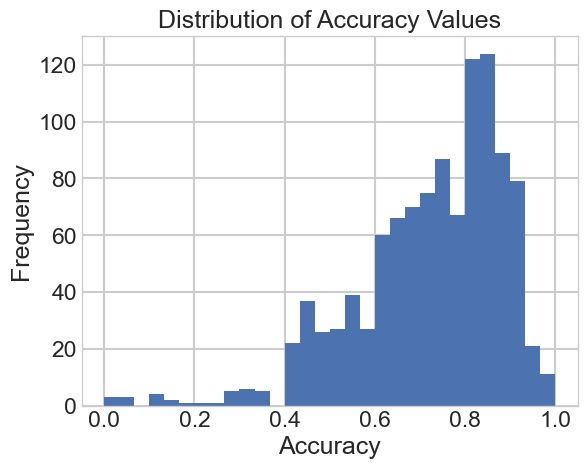

In [271]:
trials_count = df.groupby(['participant', 'validity_reliability']).size().reset_index(name='trials_count')
print(trials_count)

# Check the distribution of your accuracy values
import matplotlib.pyplot as plt
plt.hist(avg_scores.values, bins=30)
plt.title('Distribution of Accuracy Values')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.show()
